**Identifying features that influence low-income student success**

by Ben Lacar
<br>
March 2019

Updates to make

Focus on high ROI

By abstract deadline
- Get feedback
- Check features
    - See if it makes sense to use percentages - try dropping the low percent features
- More EDA for features
- Try different models
    - Add at least random forest, SVM
- Be confident about conclusions
- Monday - Project write up 

Nice to have (later)
- Geospatial data
- Updated census info

## Introduction

I investigated features of high schools that promote the college eligibility rates of low-income students. The hope is to identify features that can be affected by policy changes to help low income students graduate and become college eligible at a higher rate. I focused on CA public high schools.

To obtain features of schools that could be meaningful for my target, I pulled in data from various sources. I obtained census data for each zip code in the state of CA. I then pulled in information from the CA public schools database. Finally, I used data from GreatSchools both with an API and with custom functions (example of one high school shown [here](https://www.greatschools.org/california/chula-vista/6279-Bonita-Vista-Senior-High-School/#Low-income_students*Graduation_rates*UC_CSU_eligibility)).

In [798]:
# Import packages

# Web scraping
import os
import urllib.request
import requests
from io import StringIO
from bs4 import BeautifulSoup

# Use xml package for GreatSchools data
import xml.etree.ElementTree as ET

# Dataframe munging and statistics
import re
import pandas as pd
import numpy as np
from scipy.stats import ttest_ind

# Data visualization
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns

%matplotlib inline

# Unsupervised learning
from sklearn.decomposition import PCA

# Linear regression
from sklearn import datasets, linear_model
from sklearn.metrics import mean_squared_error, r2_score
from sklearn import metrics
from sklearn.model_selection import train_test_split

# classification approaches
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn import metrics
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report

# Stats
from scipy.stats import mannwhitneyu
from scipy.stats import ttest_ind
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats import multitest

<IPython.core.display.Javascript object>

In [285]:
# Code formatting Jupyter black
%load_ext nb_black

<IPython.core.display.Javascript object>

In [319]:
# Colors
# Got Google theme html colors from here https://imagecolorpicker.com
B_beige = "#CDA577"
B_brown = "#643E34"
B_slate = "#3F5B66"
B_dkgray = "#5A7E8E"
B_ltgray = "#6D949B"
B_green = "#01CB8B"
B_lime = "#D3F04A"

B_colors = [B_beige, B_brown, B_slate, B_dkgray, B_ltgray, B_green, B_lime]
B_colors_cat = [B_beige, B_green, B_brown, B_ltgray, B_slate, B_lime, B_dkgray]

<IPython.core.display.Javascript object>

In [2]:
parent_path = '/Users/lacar/Documents/Data_science/Jupyter_notebooks/Education_study/'
os.chdir(parent_path) 
os.getcwd()

'/Users/lacar/Documents/Data_science/Jupyter_notebooks/Education_study'

## Data sources
1. Selected economic characteristics from census for CA by zip code (median income, employment status, worker class, education level)
2. School information (public, charter status, magnet status, address)
3. School enrollment and dropout data (by grades for ethnicity, gender)
4. GreatSchools website

### Data source 1: Population data by zip code (factfinder.census.gov)

Example from site [here](https://factfinder.census.gov/faces/tableservices/jsf/pages/productview.xhtml?src=bkmk)

In [4]:
df_demo_info = pd.read_csv('data/ACS_15_5YR_DP03_with_ann.csv')
df_demo_info.head()

,Id,Id2,Geography,Estimate; EMPLOYMENT STATUS - Population 16 years and over,Margin of Error; EMPLOYMENT STATUS - Population 16 years and over,Percent; EMPLOYMENT STATUS - Population 16 years and over,Percent Margin of Error; EMPLOYMENT STATUS - Population 16 years and over,Estimate; EMPLOYMENT STATUS - Population 16 years and over - In labor force,Margin of Error; EMPLOYMENT STATUS - Population 16 years and over - In labor force,Percent; EMPLOYMENT STATUS - Population 16 years and over - In labor force,...,Percent; PERCENTAGE OF FAMILIES AND PEOPLE WHOSE INCOME IN THE PAST 12 MONTHS IS BELOW THE POVERTY LEVEL - 65 years and over,Percent Margin of Error; PERCENTAGE OF FAMILIES AND PEOPLE WHOSE INCOME IN THE PAST 12 MONTHS IS BELOW THE POVERTY LEVEL - 65 years and over,Estimate; PERCENTAGE OF FAMILIES AND PEOPLE WHOSE INCOME IN THE PAST 12 MONTHS IS BELOW THE POVERTY LEVEL - 65 years and over - People in families,Margin of Error; PERCENTAGE OF FAMILIES AND PEOPLE WHOSE INCOME IN THE PAST 12 MONTHS IS BELOW THE POVERTY LEVEL - 65 years and over - People in families,Percent; PERCENTAGE OF FAMILIES AND PEOPLE WHOSE INCOME IN THE PAST 12 MONTHS IS BELOW THE POVERTY LEVEL - 65 years and over - People in families,Percent Margin of Error; PERCENTAGE OF FAMILIES AND PEOPLE WHOSE INCOME IN THE PAST 12 MONTHS IS BELOW THE POVERTY LEVEL - 65 years and over - People in families,Estimate; PERCENTAGE OF FAMILIES AND PEOPLE WHOSE INCOME IN THE PAST 12 MONTHS IS BELOW THE POVERTY LEVEL - 65 years and over - Unrelated individuals 15 years and over,Margin of Error; PERCENTAGE OF FAMILIES AND PEOPLE WHOSE INCOME IN THE PAST 12 MONTHS IS BELOW THE POVERTY LEVEL - 65 years and over - Unrelated individuals 15 years and over,Percent; PERCENTAGE OF FAMILIES AND PEOPLE WHOSE INCOME IN THE PAST 12 MONTHS IS BELOW THE POVERTY LEVEL - 65 years and over - Unrelated individuals 15 years and over,Percent Margin of Error; PERCENTAGE OF FAMILIES AND PEOPLE WHOSE INCOME IN THE PAST 12 MONTHS IS BELOW THE POVERTY LEVEL - 65 years and over - Unrelated individuals 15 years and over
0,8600000US89010,89010,ZCTA5 89010,484,125,484,(X),233,92,48.1,...,19.7,17.5,(X),(X),21.2,16.2,(X),(X),39.1,23.2
1,8600000US89019,89019,ZCTA5 89019,1663,527,1663,(X),852,310,51.2,...,10.1,15,(X),(X),0,2.2,(X),(X),24.9,16.8
2,8600000US89046,89046,ZCTA5 89046,404,136,404,(X),175,96,43.3,...,10.9,13.4,(X),(X),41,34,(X),(X),40.1,20.6
3,8600000US89060,89060,ZCTA5 89060,8136,629,8136,(X),3473,514,42.7,...,10.7,5.1,(X),(X),18.5,6.9,(X),(X),23.9,6.2
4,8600000US89061,89061,ZCTA5 89061,4492,529,4492,(X),1889,340,42.1,...,2.5,3,(X),(X),3.2,3,(X),(X),18.2,11.8


In [7]:
for i in df_demo_info['Id2'].unique():
    df_temp = df_demo_info[df_demo_info['Id2']==i]
    if df_temp.shape[0] > 1:
        df_temp
        break

In [8]:
df_demo_info['Id2'].unique()

array([89010, 89019, 89046, ..., 96155, 96161, 97635])

In [9]:
def import_census_data(csv_file):
    df_demo_info = pd.read_csv('data/ACS_15_5YR_DP03_with_ann.csv')
    df_demo_info.set_index('Id2', inplace=True) # set the zip code as the index value
    
    # Rename demographic information columns to improve readability
    demo_column_names = ({'Estimate': 'Est.',
                      'Percent': '%',
                      'EMPLOYMENT STATUS': 'EMPLOY_STATUS',
                      'Population': 'Pop.',
                      'Margin of Error': 'error_margin',
                      'and over': 'and up',
                      'years':'yrs',
                      'COMMUTING TO WORK': 'WORK_COMMUTE',
                      'CLASS OF WORKER': 'WORKER_CLASS',
                      'INCOME AND BENEFITS (IN 2015 INFLATION-ADJUSTED DOLLARS)': 'INCOME_BENEFITS',
                      'HEALTH INSURANCE COVERAGE': 'HEALTH_INS_COVERAGE',
                      '(dollars)': '($)',
                      'PERCENTAGE OF FAMILIES AND PEOPLE WHOSE INCOME IN THE PAST 12 MONTHS IS BELOW THE POVERTY LEVEL': '%-AGE_FAMILIES_INCOME_BELOW_POVERTY',
                      '18 to 64': '18-64',
                      'with': 'w/',
                      'With': 'w/',
                      'under 18': '<18',
                      'population': 'pop.',
                      'health insurance coverage': 'health ins coverage'
                     })

    # Replace words in column names
    df_temp = pd.DataFrame()
    df_temp['old_col_names'] = df_demo_info.columns
    df_temp['new_col_names'] = None
    
    for i in range(len(df_temp)):
        string = df_temp.loc[i,'old_col_names']
        for key in demo_column_names:
            string = string.replace(key, demo_column_names[key])
        df_temp.loc[i, 'new_col_names'] = string
    df_demo_info.columns = df_temp['new_col_names']

    # Remove columns that contain "error" since it won't be used in the analysis moving forward.
    mask_col_w_error = df_demo_info.columns.str.contains('error')
    df_demo_info = df_demo_info.copy().loc[:,~mask_col_w_error]

    # Remove columns where most values are (X) 
    mask_of_X = df_demo_info.iloc[:,274]!='(X)'

    mask_of_X = df_demo_info !='(X)'
    samples_w_values = np.sum(mask_of_X)
    mask_columns_samples_wvalues = np.sum(mask_of_X) > 1400

    # Demographic info with values, no errors
    df_demo_info = df_demo_info.copy().loc[:,mask_columns_samples_wvalues]
    
    # Focus on features shown in percentages (other code were things I tried)
    mask_perc = df_demo_info.columns.str.startswith('%')
    #mask_est = df_test.columns.str.startswith('Est.')
    # df_test_only_numbers = df_test.loc[:, (mask_perc + mask_est)].copy()

    # Convert all strings with a dash into NaN
    df_demo_perc_only = df_demo_info.loc[:, mask_perc].copy()

    # Convert all strings with a dash into NaN
    mask_dash = (df_demo_perc_only=='-')  
    mask_x = (df_demo_perc_only=='(X)') 
    df_demo_perc_only[mask_dash | mask_x] = np.nan

    # Convert rest of values from string to floating point
    df_demo_perc_only = df_demo_perc_only.astype('float64', copy=False)
    
    # Identify features where most (90%) of the values are < 100%
    df_temp = pd.DataFrame()
    df_temp['feature'] = None
    df_temp['min'] = None
    df_temp['max'] = None
    df_temp['prop_<100%'] = None

    # Check range of values and determine the proportion less than 100%
    for index, value in enumerate(df_demo_perc_only.columns):
        try:
            df_temp.loc[index, 'feature'] = value
            df_temp.loc[index, ['min', 'max']] = (df_demo_perc_only[value].min(), df_demo_perc_only[value].max())
            # For next line, NaNs are not counted
            df_temp.loc[index, 'prop_<100%'] = sum(df_demo_perc_only[value] <= 100)/len(df_demo_perc_only)
        except:
            continue

    # Get features where most (90%) of the values are < 1 (100%)
    valid_features = df_temp.loc[df_temp['prop_<100%'] >= 0.9, 'feature'].tolist()
    
    # Add the identifying columns back in and include those about income
    income_columns = df_demo_info.columns[df_demo_info.columns.str.contains('income')].tolist()
    
    df_demo_info_perc = pd.merge(df_demo_info[['Id', 'Geography'] + income_columns], df_demo_perc_only[valid_features],
                                  left_index=True, right_index=True)
    
    # Remove rows where 90% of the census info for that zip code is missing
    df_demo_info_final = df_demo_info_perc[df_demo_info_perc.count(axis=1)/df_demo_info_perc.shape[1] >= 0.9]
    
    return df_demo_info_final

In [140]:
def initial_analysis(df):
    """
    Given a dataframe produces a simple report on initial data analytics
    Params:
        - df 
    Returns:
        - Shape of dataframe records and columns
        - Columns and data types
    """
    print("Report of Initial Data Analysis:\n")
    print(f"Shape of dataframe: {df.shape}")
    print(f"Features and Data Types: \n {df.dtypes}")

In [10]:
df_census = import_census_data('ACS_15_5YR_DP03_with_ann.csv')

#### Broad categories in census columns


In [1165]:
# Census columns that start with '%'
col_census_pct = df_state_info_gs_census.columns[df_state_info_gs_census.columns.str.startswith('%')]
# Broad categories in pct census columns
print(set([i.split('-')[0] for i in col_census_pct.tolist()]))

{'%; INDUSTRY ', '%; WORK_COMMUTE ', '%; OCCUPATION ', '%; WORKER_CLASS ', '%; HEALTH_INS_COVERAGE ', '%; %', '%; EMPLOY_STATUS ', '%; INCOME_BENEFITS '}


In [91]:
# Census columns that start with '%'
col_census_pct = df_state_info_gs_census.columns[df_state_info_gs_census.columns.str.startswith('%')]
# Broad categories in pct census columns
print(set([i.split('-')[0].lower() for i in col_census_pct.tolist()]))

{'%; occupation ', '%; industry ', '%; income_benefits ', '%; %', '%; work_commute ', '%; health_ins_coverage ', '%; employ_status ', '%; worker_class '}


In [1166]:
# Census columns that start with 'Est'
col_census_est = df_state_info_gs_census.columns[df_state_info_gs_census.columns.str.startswith('Est')]
col_census_est

Index(['Est.; INCOME_BENEFITS - Total households - Median household income ($)',
       'Est.; INCOME_BENEFITS - Total households - Mean household income ($)',
       'Est.; INCOME_BENEFITS - w/ Social Security - Mean Social Security income ($)',
       'Est.; INCOME_BENEFITS - w/ retirement income',
       'Est.; INCOME_BENEFITS - w/ retirement income - Mean retirement income ($)',
       'Est.; INCOME_BENEFITS - w/ cash public assistance income',
       'Est.; INCOME_BENEFITS - w/ cash public assistance income - Mean cash public assistance income ($)',
       'Est.; INCOME_BENEFITS - Families - Median family income ($)',
       'Est.; INCOME_BENEFITS - Families - Mean family income ($)',
       'Est.; INCOME_BENEFITS - Per capita income ($)',
       'Est.; INCOME_BENEFITS - Nonfamily households - Median nonfamily income ($)',
       'Est.; INCOME_BENEFITS - Nonfamily households - Mean nonfamily income ($)'],
      dtype='object')

### Data Source 2: School information (public, charter status, magnet, address) 

- Import the school info and extract the 5 digit code for each school district

In [863]:
def import_school_info():
    # url = 'ftp://ftp.cde.ca.gov/demo/schlname/pubschls.xls'  # old url
    url = (
        "https://www.cde.ca.gov/SchoolDirectory/report?rid=dl1&tp=xlsx&ict=Y"  # new url
    )
    socket = urllib.request.urlopen(url)
    df = pd.read_excel(socket, skiprows=5)

    # Remove last row which has string and Nas (total records row)
    df = df.iloc[:-1]
    # Change CDSCode column from string to integer for later merging
    df["CDSCode"] = df["CDSCode"].astype("int")

    # Have the zip code format match the census format for later merging
    df["zip_code"] = df["Zip"].str.split("-", expand=True).iloc[:, 0]
    # Deal with missing data and change type to int64 so it can be merged
    df["zip_code"] = df["zip_code"].replace("No Data", 0).fillna(0).astype(np.int64)

    return df

<IPython.core.display.Javascript object>

In [864]:
df_school_info = import_school_info()

ImportError: Missing optional dependency 'xlrd'. Install xlrd >= 1.0.0 for Excel support Use pip or conda to install xlrd.

<IPython.core.display.Javascript object>

In [ ]:
df_school_info.columns

In [851]:
# Test school
df_school_info[df_school_info['School'].str.contains('Bonita Vista')]

,CDSCode,NCESDist,NCESSchool,StatusType,County,District,School,Street,StreetAbr,City,...,AdmLName1,AdmEmail1,AdmFName2,AdmLName2,AdmEmail2,AdmFName3,AdmLName3,AdmEmail3,LastUpDate,zip_code
12992,37684113730405,0638640,06475,Active,San Diego,Sweetwater Union High,Bonita Vista Senior High,751 Otay Lakes Road,751 Otay Lakes Rd.,Chula Vista,...,Del Rosario,roman.delrosario@sweetwaterschools.org,No Data,No Data,No Data,No Data,No Data,No Data,2019-02-13,91913
13011,37684116059745,0638640,06474,Active,San Diego,Sweetwater Union High,Bonita Vista Middle,650 Otay Lakes Road,650 Otay Lakes Rd.,Chula Vista,...,Kramer,teresa.kramer@sweetwaterschools.org,No Data,No Data,No Data,No Data,No Data,No Data,2019-02-13,91910


In [852]:
df_school_info.shape

(18073, 52)

In [855]:
df_school_info.groupby('SOCType')['SOCType'].count()

SOCType
Adult Education Centers                       563
Alternative Schools of Choice                 521
Continuation High Schools                     757
County Community                              509
District Community Day Schools                621
Elemen Schools In 1 School Dist. (Public)     291
Elementary Schools (Public)                  7688
High Schools (Public)                        1817
High Schools In 1 School Dist. (Public)        11
Intermediate/Middle Schools (Public)         1668
Junior High Schools (Public)                  124
Juvenile Court Schools                        254
K-12 Schools (Public)                         554
No Data                                      1390
Opportunity Schools                           124
Other County Or District Programs              11
Preschool                                     274
ROC/ROP                                        86
Special Education Schools (Public)            764
State Special Schools                     

In [853]:
df_school_info.groupby('StatusType')['StatusType'].count()

StatusType
Active     11751
Closed      4869
Merged      1444
Pending        9
Name: StatusType, dtype: int64

In [854]:
df_school_info.groupby('Charter')['Charter'].count()

Charter
N          14726
No Data     1390
Y           1957
Name: Charter, dtype: int64

In [856]:
df_school_info.groupby('Magnet')['Magnet'].count()

Magnet
N          10433
No Data     7093
Y            547
Name: Magnet, dtype: int64

### Data Source 3:  School enrollment and dropout data

- Data provided by grades and for ethnicity, gender

In [18]:
def import_enrollment_data(year):
    baseUrl_1 = 'http://dq.cde.ca.gov/dataquest/dlfile/dlfile.aspx?cLevel=School&cYear='
    baseUrl_2 = '&cCat=Dropouts&cPage=filesdropouts'
    url = baseUrl_1 + year + baseUrl_2    # create url including selected year 
    session = requests.Session()
    r = session.post(url)
    data = StringIO(r.text)
    df = pd.read_csv(data, sep="\t")
    
    # Extract demographic enrollment for each school
    df_ethnicity = df.groupby(['CDS_CODE', 'ETHNIC']).agg(sum)
    df_ethnicity.reset_index(inplace=True)
    df_ethnicity_enroll = pd.pivot_table(df_ethnicity, index='CDS_CODE', columns='ETHNIC', values='ETOT').fillna(0)
    
    # Extract ethnic demographic dropout for each school
    df_ethnicity_dropout = pd.pivot_table(df_ethnicity, index='CDS_CODE', columns='ETHNIC', values='DTOT').fillna(0)
    
    # Group by to get collapsed enrollment/dropout for each school
    df = df.loc[:,'CDS_CODE':'DTOT'].groupby('CDS_CODE').agg(sum).drop('ETHNIC', axis=1)
    
    # Filter schools having at least 25 students in each of grades 9-12
    df = df[(df['E9'] > 25) & (df['E10'] > 25) &
            (df['E11'] > 25) & (df['E12'] > 25)]
    
    # Merge the ethnic demographic enrollment data
    df_w_enroll = pd.merge(df, df_ethnicity_enroll, left_index=True, right_index=True)
    df_w_enroll_and_dropout = pd.merge(df_w_enroll, df_ethnicity_dropout, left_index=True, right_index=True)

    return df_w_enroll_and_dropout

In [19]:
df_enrollment = import_enrollment_data('2015-16')   # using this year to match census data

In [20]:
df_enrollment.head()

,E7,E8,E9,E10,E11,E12,EUS,ETOT,D7,D8,...,9_x,0_y,1_y,2_y,3_y,4_y,5_y,6_y,7_y,9_y
CDS_CODE,,,,,,,,,,,,,,,,,,,,,
1100170112607,0,0,115,108,96,88,0,407,0,0,...,5.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0
1316170131763,36,26,37,39,50,82,0,208,0,0,...,5.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0
1611190106401,0,0,44,47,47,37,0,175,0,0,...,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1611190130229,0,0,429,440,432,381,36,1718,0,0,...,67.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,2.0,0.0
1611190130609,57,60,47,53,52,52,0,204,0,0,...,18.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0


#### Merge enrollment and school info data together

In [21]:
df_enrollment_w_info = pd.merge(df_enrollment, df_school_info, how='left', left_index=True, right_on='CDSCode').set_index('CDSCode')

In [22]:
df_enrollment_w_info.head()

,E7,E8,E9,E10,E11,E12,EUS,ETOT,D7,D8,...,AdmLName1,AdmEmail1,AdmFName2,AdmLName2,AdmEmail2,AdmFName3,AdmLName3,AdmEmail3,LastUpDate,zip_code
CDSCode,,,,,,,,,,,,,,,,,,,,,
1100170112607,0,0,115,108,96,88,0,407,0,0,...,Gordon,eve@envisionacademy.org,No Data,No Data,No Data,No Data,No Data,No Data,2019-07-01,94612.0
1316170131763,36,26,37,39,50,82,0,208,0,0,...,Gonzales,lgonzales@csdf-cde.ca.gov,No Data,No Data,No Data,No Data,No Data,No Data,2019-02-13,94538.0
1611190106401,0,0,44,47,47,37,0,175,0,0,...,Corbally,tcorbally@alamedaunified.org,No Data,No Data,No Data,No Data,No Data,No Data,2019-02-13,94501.0
1611190130229,0,0,429,440,432,381,36,1718,0,0,...,Ithurburn,rithurburn@alamedaunified.org,No Data,No Data,No Data,No Data,No Data,No Data,2019-08-17,94501.0
1611190130609,57,60,47,53,52,52,0,204,0,0,...,Goodreau,jeremy.goodreau@alamedaclc.org,Annalisa,Moore,annalisa.moore@clcschools.org,No Data,No Data,No Data,2019-02-13,94501.0


In [23]:
def add_enrollment_dropout_ethnicity_percentages(df):
    dict_ethnicity = ({0: "Not reported", 1: "Native Amer/Alaska Native", 2: "Asian",
                       3: "Pacific Islander", 4:"Filipino", 5: "Hispanic",
                       6: "African American", 7: "White", 9: "Two or More Races"})
    
    for key, value in dict_ethnicity.items():
        df['%_enrolled_of_total_' + value] = 100*(df[str(key) + '_x']/df['ETOT'])   # Percent enrolled in the school
        df['%_dropout_within_' + value ] = 100*(df[str(key) + '_y']/df[str(key) + '_x'])    # Percent dropout within that ethnicity enrolled
    
    df['%_overall_dropout'] = 100*(df['DTOT']/df['ETOT'])
    
    columns_to_drop = (['E7', 'E8', 'EUS', 'D7', 'D8', 'DUS', 'AdmFName2',
                        'AdmLName2', 'AdmEmail2', 'AdmFName3', 'AdmLName3', 'AdmEmail3'])
    df = df.drop(columns_to_drop, axis=1)
   
    return df

In [24]:
df_enrollment_w_ethnicity_perc = add_enrollment_dropout_ethnicity_percentages(df_enrollment_w_info)

In [25]:
df_enrollment_w_ethnicity_perc.head()

,E9,E10,E11,E12,ETOT,D9,D10,D11,D12,DTOT,...,%_dropout_within_Filipino,%_enrolled_of_total_Hispanic,%_dropout_within_Hispanic,%_enrolled_of_total_African American,%_dropout_within_African American,%_enrolled_of_total_White,%_dropout_within_White,%_enrolled_of_total_Two or More Races,%_dropout_within_Two or More Races,%_overall_dropout
CDSCode,,,,,,,,,,,,,,,,,,,,,
1100170112607,115,108,96,88,407,0,1,1,0,2,...,0.0,51.351351,0.956938,38.329238,0.000000,3.194103,0.000000,1.228501,0.0,0.491400
1316170131763,37,39,50,82,208,0,0,0,3,3,...,0.0,50.961538,0.943396,10.576923,4.545455,24.038462,0.000000,2.403846,20.0,1.442308
1611190106401,44,47,47,37,175,0,0,0,0,0,...,0.0,8.571429,0.000000,4.000000,0.000000,12.571429,0.000000,2.285714,0.0,0.000000
1611190130229,429,440,432,381,1718,0,0,1,3,4,...,0.0,11.874272,0.490196,6.519208,0.000000,31.082654,0.374532,3.899884,0.0,0.232829
1611190130609,47,53,52,52,204,0,0,0,1,1,...,0.0,17.647059,0.000000,10.294118,0.000000,38.235294,0.000000,8.823529,0.0,0.490196


### Merge school enrollment data and census data

In [26]:
df_school_demographics = pd.merge(df_census, df_enrollment_w_ethnicity_perc, left_index=True, right_on='zip_code')

In [27]:
# Sanity check - look at my high school's zip code
df_school_demographics[df_school_demographics['zip_code']==91913]

,Id,Geography,Est.; INCOME_BENEFITS - Total households - Median household income ($),Est.; INCOME_BENEFITS - Total households - Mean household income ($),Est.; INCOME_BENEFITS - w/ Social Security - Mean Social Security income ($),Est.; INCOME_BENEFITS - w/ retirement income,%; INCOME_BENEFITS - w/ retirement income_x,Est.; INCOME_BENEFITS - w/ retirement income - Mean retirement income ($),Est.; INCOME_BENEFITS - w/ cash public assistance income,%; INCOME_BENEFITS - w/ cash public assistance income_x,...,%_dropout_within_Filipino,%_enrolled_of_total_Hispanic,%_dropout_within_Hispanic,%_enrolled_of_total_African American,%_dropout_within_African American,%_enrolled_of_total_White,%_dropout_within_White,%_enrolled_of_total_Two or More Races,%_dropout_within_Two or More Races,%_overall_dropout
CDSCode,,,,,,,,,,,,,,,,,,,,,
37684110111831,8600000US91913,ZCTA5 91913,84469,89909,14467,2178,15.9,31338,211,1.5,...,0.189394,53.552997,0.444774,6.470822,0.613497,7.344184,3.243243,8.813021,0.900901,0.635173
37684113730405,8600000US91913,ZCTA5 91913,84469,89909,14467,2178,15.9,31338,211,1.5,...,0.000000,67.748397,0.354820,3.084936,0.000000,11.538462,0.347222,6.971154,0.574713,0.320513
37684113731627,8600000US91913,ZCTA5 91913,84469,89909,14467,2178,15.9,31338,211,1.5,...,0.000000,64.509880,0.660661,4.029446,0.000000,4.920573,0.787402,6.431616,0.000000,0.464936


In [28]:
# Sanity check - Palo Alto zip code
df_school_demographics[df_school_demographics['zip_code']==94301]

,Id,Geography,Est.; INCOME_BENEFITS - Total households - Median household income ($),Est.; INCOME_BENEFITS - Total households - Mean household income ($),Est.; INCOME_BENEFITS - w/ Social Security - Mean Social Security income ($),Est.; INCOME_BENEFITS - w/ retirement income,%; INCOME_BENEFITS - w/ retirement income_x,Est.; INCOME_BENEFITS - w/ retirement income - Mean retirement income ($),Est.; INCOME_BENEFITS - w/ cash public assistance income,%; INCOME_BENEFITS - w/ cash public assistance income_x,...,%_dropout_within_Filipino,%_enrolled_of_total_Hispanic,%_dropout_within_Hispanic,%_enrolled_of_total_African American,%_dropout_within_African American,%_enrolled_of_total_White,%_dropout_within_White,%_enrolled_of_total_Two or More Races,%_dropout_within_Two or More Races,%_overall_dropout
CDSCode,,,,,,,,,,,,,,,,,,,,,
43696414335782,8600000US94301,ZCTA5 94301,142168,219868,21971,1096,15.4,51404,95,1.3,...,0.0,9.378134,1.604278,3.30993,1.515152,48.946841,0.409836,5.466399,0.0,0.451354


In [29]:
print('number of CA zip codes with school info: ', len(df_school_demographics['zip_code'].unique()))


number of CA zip codes with school info:  849


### Data Source 4: GreatSchools

https://www.greatschools.org/api/docs/technical-overview/
<br>
https://www.greatschools.org/gk/about/api-terms-use/

Obtained information through API and scraping html with BeautifulSoup

In [ ]:
# BeautifulSoup documentation
# https://www.crummy.com/software/BeautifulSoup/bs4/doc/

# prettify makes it a little easier to read
print(soup.prettify())

#### Get basic info including URLs for each school using API

sample url:
    'https://www.greatschools.org/california/chula-vista/6279-Bonita-Vista-Senior-High-School/'

In [33]:
def get_base_gs_school_info(school):
    my_gs_api = 'hidden'
    school_1st_try = school.strip().replace(' ', '-')
    #print('school search term: ', school_1st_try)
    query_school = 'https://api.greatschools.org/search/schools?key=' + my_gs_api + '&state=CA&q=' + school_1st_try
    url = query_school
    #url = query_string
    socket = urllib.request.urlopen(url)
    document2 = urllib.request.urlopen(url).read().decode()
    tree = ET.fromstring(document2)
    district_search_term = ' '.join(district.split(' ')[0:2])
    for child in tree:
        tag_school = []
        text_school = []
        for element in child:
            tag_school.append(element.tag)
            text_school.append(element.text)
        df = pd.DataFrame({'tags':tag_school, 'text':text_school})
        df = df.set_index('tags')
        # This if statement is to avoid similar named schools in different districts
        if df['text'].str.contains(district_search_term).sum()>0:
            break
    # This if statement is to stop searching if information for one school is found
    if (len(df) < 24):
        df = df
    else:
        # Take the text before the first space/hyphen
        school_2nd_try = school.split(' ')[0]
        #print('school search term, second if: ', school_2nd_try)
        query_school = 'https://api.greatschools.org/search/schools?key=' + my_gs_api + '&state=CA&q=' + school_2nd_try
        url = query_school
        #url = query_string
        socket = urllib.request.urlopen(url)
        document2 = urllib.request.urlopen(url).read().decode()
        tree = ET.fromstring(document2)
        for child in tree:
            tag_school = []
            text_school = []
            for element in child:
                tag_school.append(element.tag)
                text_school.append(element.text)
            df = pd.DataFrame({'tags':tag_school, 'text':text_school})
            df = df.set_index('tags')
            if df['text'].str.contains(district_search_term).sum()>0:
                break
        if (len(df) < 24):
            df = df
        else:
            # Remove ""Preparatory", "Accelerated", "Charter", "Academy"
            textlist2strip = ['Preparatory', 'Accelerated', 'Charter', 'Academy']
            for text2strip in textlist2strip:
                school = school.replace(text2strip, '')
            school_3rd_try = school.strip().replace(' ', '-')
            #print('school search term, third if: ', school_3rd_try)
            query_school = 'https://api.greatschools.org/search/schools?key=' + my_gs_api + '&state=CA&q=' + school_3rd_try
            url = query_school
            #url = query_string
            socket = urllib.request.urlopen(url)
            document2 = urllib.request.urlopen(url).read().decode()
            tree = ET.fromstring(document2)
            for child in tree:
                    tag_school = []
                    text_school = []
                    for element in child:
                        tag_school.append(element.tag)
                        text_school.append(element.text)
                    df = pd.DataFrame({'tags':tag_school, 'text':text_school})
                    df = df.set_index('tags')
                    # This if statement is to avoid similar named schools in different districts
                    if df['text'].str.contains(district_search_term).sum()>0:
                        break
            if (len(df) < 24):
                df = df

    return df

##### Testing with Sweetwater Union

In [33]:
# Filtering to get only active, public high schools in SUHSD
df_school_info_sd = df_school_info[df_school_info['County']=='San Diego']
df_school_info_sd_schools = df_school_info_sd[df_school_info_sd['School']!='No Data']
df_school_info_sd_schools = df_school_info_sd_schools[df_school_info_sd_schools['StatusType']=='Active']
df_school_info_sd_schools = df_school_info_sd_schools[df_school_info_sd_schools['SOCType']=='High Schools (Public)']
df_school_info_sd_schools_su = df_school_info_sd_schools[df_school_info_sd_schools['District'].str.contains('Sweetwater')]

In [106]:
# Loop through each school in the district to get information
df_district = pd.DataFrame()

district = 'Sweetwater Union High'
for index, school in enumerate(df_school_info_sd_schools_su['School']):
    # Limit to high schools
    if 'High' in school:
        df = get_base_gs_school_info(school)
        #school_info_list.append(df)
        if len(df_district.columns) < 1:
            df_district = df
            df_district.columns = [school]
        else:
            df_district[school] = df
        print(school, df.shape)

        # Transpose
df_district_tp = df_district.T

Olympian High (23, 1)
Southwest Senior High (23, 1)
Bonita Vista Senior High (23, 1)
Castle Park Senior High (23, 1)
Eastlake High (23, 1)
Chula Vista Senior High (23, 1)
San Ysidro High (23, 1)
Otay Ranch Senior High (23, 1)
Hilltop Senior High (23, 1)
Mar Vista Senior High (23, 1)
Sweetwater High (23, 1)
Montgomery Senior High (23, 1)


##### Testing with LA Unified

In [1184]:
# Filtering to get only active, public high schools in LA Unified School District
df_school_info_LA = df_school_info[df_school_info['County']=='Los Angeles']
df_school_info_LA_schools = df_school_info_LA[df_school_info_LA['School']!='No Data']
df_school_info_LA_schools = df_school_info_LA_schools[df_school_info_LA_schools['StatusType']=='Active']
df_school_info_LA_schools = df_school_info_LA_schools[df_school_info_LA_schools['SOCType']=='High Schools (Public)']
df_school_info_LA_schools_LU = df_school_info_LA_schools[df_school_info_LA_schools['District'].str.contains('Los Angeles Unified')]

In [ ]:
# Loop through each LA in the district to get info

df_district = pd.DataFrame()

for index, school in enumerate(df_school_info_LA_schools_LU['School']):
    # Limit to high schools
    if index < 200:
        df = get_base_gs_school_info(school)
        #school_info_list.append(df)
        print(str(index), school, df.shape)
        try:
            if len(df_district.columns) < 1:
                df_district = df.copy()
                df_district.columns = [school]
                index2get = df.index
            else:
                df_district[school] = df.copy().loc[index2get, :]
                #df_district[school] = df
        except:
            df_district[school] = None

    else:
        break

# Transpose
df_district_tp_LA = df_district.T

##### Full CA high school data


In [36]:
# Filtering to get only active, public high schools in all of CA
df_school_info_CA_schools = df_school_info[df_school_info['School']!='No Data']
df_school_info_CA_schools = df_school_info_CA_schools[df_school_info_CA_schools['StatusType']=='Active']
df_school_info_CA_schools = df_school_info_CA_schools[df_school_info_CA_schools['SOCType']=='High Schools (Public)']

In [37]:
print('No. of schools before getting GS data: ', df_school_info_CA_schools.shape[0])
print('No. of districts: ', str(len(df_school_info_CA_schools['District'].unique())))

No. of schools before getting GS data:  1317
No. of districts:  444


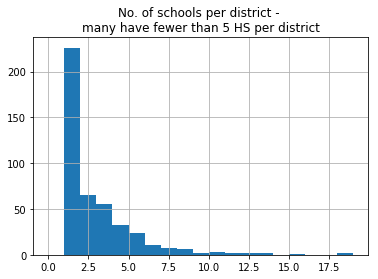

In [38]:
df_school_info_CA_schools.groupby('District').count()['School'].hist(bins=range(20))
plt.title('No. of schools per district - \nmany have fewer than 5 HS per district');

In [40]:
# Loop through each school in CA to get info

df_state = pd.DataFrame()

# Go district by district to avoid potential schools with similar names
for index_district, district in enumerate(df_school_info_CA_schools['District'].unique()):
    if index_district < 1000:
        #print(str(index_district), 'District queried: ', district)
        df_school_info_district = df_school_info_CA_schools.copy()[df_school_info_CA_schools['District']==district]
        for index, school in enumerate(df_school_info_district['School']):
            # Limit to high schools
            if index < 2000:
                try:
                    df = get_base_gs_school_info(school)
                    # Print to monitor, but limit the output
                    if index_district % 5 == 0:
                        print('District index: ', str(index_district), 'School index: ', str(index), school, df.shape, '\n -----')
                    if len(df_state.columns) < 1:
                        df_state = df.copy()
                        df_state.columns = [school]
                        index2get = df.index
                    else:
                        df_state[school] = df.copy().loc[index2get, :]
                        #df_state[school] = df
                except:
                    df_state[school] = None

            else:
                break
                
    else:
        break

# Transpose
df_state_tp = df_state.T

District index:  0 School index:  0 Envision Academy for Arts & Technology (23, 1) 
 -----


/Users/lacar/anaconda/lib/python3.5/site-packages/ipykernel_launcher.py:23: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
/Users/lacar/anaconda/lib/python3.5/site-packages/pandas/core/indexing.py:1367: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  return self._getitem_tuple(key)


District index:  5 School index:  0 Emery Secondary (23, 1) 
 -----
District index:  10 School index:  0 James Logan High (23, 1) 
 -----
District index:  15 School index:  0 Dublin High (23, 1) 
 -----
District index:  20 School index:  0 Inspire School of Arts and Sciences (23, 1) 
 -----
District index:  20 School index:  1 Chico High (23, 1) 
 -----
District index:  20 School index:  2 Pleasant Valley High (23, 1) 
 -----
District index:  25 School index:  0 Bret Harte Union High (23, 1) 
 -----
District index:  30 School index:  0 Williams Junior/Senior High (23, 1) 
 -----
District index:  35 School index:  0 Heritage High (23, 1) 
 -----
District index:  35 School index:  1 Freedom High (23, 1) 
 -----
District index:  35 School index:  2 Liberty High (23, 1) 
 -----
District index:  40 School index:  0 Dougherty Valley High (23, 1) 
 -----
District index:  40 School index:  1 California High (23, 1) 
 -----
District index:  40 School index:  2 Monte Vista High (23, 1) 
 -----
D

District index:  290 School index:  1 Adelanto High (22, 1) 
 -----
District index:  290 School index:  3 Options for Youth-Victorville Charter (23, 1) 
 -----
District index:  290 School index:  4 Silverado High (23, 1) 
 -----
District index:  290 School index:  5 Victor Valley High (23, 1) 
 -----
District index:  290 School index:  6 Cobalt Institute of Math and Science Academy (23, 1) 
 -----
District index:  295 School index:  0 Summit Leadership Academy-High Desert (23, 1) 
 -----
District index:  295 School index:  1 Mirus Secondary (22, 1) 
 -----
District index:  295 School index:  3 Oak Hills High (23, 1) 
 -----
District index:  295 School index:  4 Hesperia High (23, 1) 
 -----
District index:  295 School index:  5 Sultana High (23, 1) 
 -----
District index:  300 School index:  0 San Diego Workforce Innovation High (20, 1) 
 -----
District index:  300 School index:  1 Borrego Springs High (23, 1) 
 -----
District index:  305 School index:  0 River Valley Charter (23, 1) 


In [42]:
# Count number of rows with less than 5 null values out of the 23 targeted to scrape

print(str((df_state_tp.isnull().sum(axis=1) < 5).sum())
      +  ' GS schools info obtained out of ' 
      + str(df_state_tp.shape[0]) 
      + ' schools queried' )


no_of_schools_wlink = df_state_tp['overviewLink'].notnull().sum()
print('no. of schools with GS link: ', str(no_of_schools_wlink))

no_of_schools_wlink = df_state_tp['overviewLink'].notnull().sum()

1151 GS schools info obtained out of 1253 schools queried
no. of schools with GS link:  1165


In [43]:
df_state_tp['overviewLink'].notnull().sum()

1165

In [44]:
df_state_tp.loc[df_state_tp.isnull().sum(axis=1) > 5, :]

tags,gsId,name,type,gradeRange,enrollment,gsRating,parentRating,city,state,districtId,...,phone,fax,website,ncesId,lat,lon,overviewLink,ratingsLink,reviewsLink,schoolStatsLink
Silver Oak High Public Montessori Charter,None,None,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
MetWest High,None,None,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
McClymonds High,None,None,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
Paradise eLearning Academy,None,None,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
Maxwell Sr High,None,None,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
Clayton Valley Charter High,None,None,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
De Anza High,None,None,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
El Cerrito High,None,None,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
Big Picture Educational Academy,None,None,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
McLane High,None,None,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None


In [47]:
# Save csv so it's not necessary to reprocess
#df_state_tp.to_csv('repo/df_state_tp_WITH_URL_191006.csv')

#### Get high-level ratings using school profile page

For college readiness, test scores, advanced courses,
equity overview, race ethnicity, low income, disabilities

**Note: (API not required here)**

In [769]:
# Test query
# school = df_school_info_sd_schools_su['School'].iloc[5]
# print(school.replace(' ','-'))
# url = df_district_tp.loc[school, 'overviewLink']
# socket_read = urllib.request.urlopen(url).read()
# soup = BeautifulSoup(socket_read, 'html.parser')
# url_test = 'https://www.greatschools.org/california/chula-vista/6279-Bonita-Vista-Senior-High-School/?utm_source=GSAPI&utm_medium=referral'

In [34]:
def get_high_level_ratings(url_school):

    try:
        socket_read = urllib.request.urlopen(url_school).read()   # uncomment when there's internet
        soup = BeautifulSoup(socket_read, 'html.parser')
    
    except:
        soup = None

    rating_categories = (['College_readiness', 'Test_scores', 'Advanced_courses',
                         'Equity_overview', 'Race_ethnicity', 'Low-income_students',
                         'Students_with_Disabilities'])
        
    rating_list = list()
    for rating_cat in rating_categories:
        #print(rating_cat)
        try:
            tags = soup.find_all(href=re.compile(rating_cat))
            this_cat_rating_list = []
            for tag in tags:
                for index, child in enumerate(tag.contents):
                    if "rating" in str(child):
                        this_child = str(child)
                        rating = (int(this_child.split('--')[1].split()[0]))
                        this_cat_rating_list.append(rating)
                    else:
                        #print("no rating")
                        this_cat_rating_list.append('no_rating')

                # If there's no rating in any tag for that category, record it as None
                if False not in [i=='no_rating' for i in this_cat_rating_list]:
                    rating = None

        except:
            rating = None
            
        rating_list.append(rating)
        
    return rating_list

##### Testing with Sweetwater Union

In [ ]:
# Commented out if needed to start next loop at a certain index

# col_hl_ratings = ['college_readiness', 'test_scores', 'advanced_courses', 'equity_overview', 'race_ethnicity', 'low_income', 'disabilities']
# # Initiate columns
# for rating in col_hl_ratings:
#     df_district_tp.loc[:, rating] = None



In [92]:
# NOTE: This cell takes a while to run, likely due to internet speed limitations

# Use enumerate option to start at a certain index and not start over
for i, url in enumerate(df_district_tp['overviewLink'], 9):
    print(i)
    #try:
#     index_school = df_district_tp.index[i]
#     df_district_tp.loc[index_school, col_hl_ratings] = get_high_level_ratings(url)
#     print(str(i+1) + ' of ' + str(len(df_district_tp)) + ': ' + index_school)    # To monitor output
    #except:
    #    continue


9
10
11
12
13
14
15
16
17
18
19
20


In [114]:
df_district_tp['overviewLink'].iloc[9:]

Mar Vista Senior High     https://www.greatschools.org/california/imperi...
Sweetwater High           https://www.greatschools.org/california/nation...
Montgomery Senior High    https://www.greatschools.org/california/san-di...
Name: overviewLink, dtype: object

In [117]:
# NOTE: This cell takes a while to run, likely due to internet speed limitations

# Careful with this - 

start_val = 9
for i, url in enumerate(df_district_tp['overviewLink'].iloc[start_val:]):
    index_school = df_district_tp.index[i+start_val]
    print(i, index_school, url)
#     try:
#         index_school = df_district_tp.index[i]
#         df_district_tp.loc[index_school, col_hl_ratings] = get_high_level_ratings(url)
#         no_of_values = df_district_tp.loc[index_school, col_hl_ratings].notnull().sum()
#         print(str(i+1) + ' of ' + str(len(df_district_tp)) + ': ' + index_school + ' - ' + str(no_of_values))    # To monitor output
#     except:
#         continue



0 Mar Vista Senior High https://www.greatschools.org/california/imperial-beach/6289-Mar-Vista-Senior-High-School/?utm_source=GSAPI&utm_medium=referral
1 Sweetwater High https://www.greatschools.org/california/national-city/6297-Sweetwater-High-School/?utm_source=GSAPI&utm_medium=referral
2 Montgomery Senior High https://www.greatschools.org/california/san-diego/6291-Montgomery-Senior-High-School/?utm_source=GSAPI&utm_medium=referral


#####  Testing with LA Unified

In [1291]:
# NOTE: This cell takes a while to run, likely due to internet speed limitations

# col_hl_ratings = ['college_readiness', 'test_scores', 'advanced_courses', 'equity_overview', 'race_ethnicity', 'low_income', 'disabilities']
# # Initiate columns
# for rating in col_hl_ratings:
#     df_district_tp_LA.loc[:, rating] = None
    
# for i, url in enumerate(df_district_tp_LA['overviewLink']):
#     index_school = df_district_tp_LA.index[i]
#     print(str(i+1) + ' of ' + str(len(df_district_tp_LA)) + ': ' + index_school)    # To monitor output
#     df_district_tp_LA.loc[index_school, col_hl_ratings] = get_high_level_ratings(url)

1 of 160: High Tech LA
2 of 160: Wallis Annenberg High
3 of 160: Central City Value
4 of 160: ICEF View Park Preparatory Accelerated High
5 of 160: CATCH Prep Charter High, Inc.
6 of 160: Oscar De La Hoya Animo Charter High
7 of 160: Animo South Los Angeles Charter
8 of 160: Middle College High
9 of 160: Dr. Richard A. Vladovic Harbor Teacher Preparation Academy
10 of 160: Camino Nuevo Charter High
11 of 160: Animo Venice Charter High
12 of 160: Animo Pat Brown
13 of 160: Northridge Academy High
14 of 160: Port of Los Angeles High
15 of 160: CHAMPS - Charter HS of Arts-Multimedia & Performing
16 of 160: Alliance Judy Ivie Burton Technology Academy High
17 of 160: Alliance Collins Family College-Ready High
18 of 160: Santee Education Complex
19 of 160: South East High
20 of 160: Maywood Academy High
21 of 160: New Village Girls Academy
22 of 160: Alliance Patti And Peter Neuwirth Leadership Academy
23 of 160: Alliance Dr. Olga Mohan High
24 of 160: Animo Ralph Bunche Charter High
25 of 

##### Full CA high school data

In [114]:
# Commented out if needed to start next loop at a certain index

col_hl_ratings = ['college_readiness', 'test_scores', 'advanced_courses', 'equity_overview', 'race_ethnicity', 'low_income', 'disabilities']
# # Initiate columns
# for rating in col_hl_ratings:
#     df_state_tp.loc[:, rating] = None


In [119]:
# NOTE: This cell takes a while to run, likely due to internet speed limitations

# For debugging - start at a certain row and not have to start over
# Don't use enumerate option since the url doesn't track with the option

start_val = 350
for i, url in enumerate(df_state_tp['overviewLink'].iloc[start_val:]):
    index_school = df_state_tp.index[i+start_val]
    try:
        if url is not None:
            df_state_tp.loc[index_school, col_hl_ratings] = get_high_level_ratings(url)
            no_of_values = df_state_tp.loc[index_school, col_hl_ratings].notnull().sum()
        else:
            df_state_tp.loc[index_school, col_hl_ratings] = None
    except:
        df_state_tp.loc[index_school, col_hl_ratings] = None
    if i % 10 == 0:
        print(str(i+1+start_val) + ' of ' + str(len(df_state_tp)) + ': ' + index_school + ' - ' + str(no_of_values))    # To monitor output


1 of 1253: Contreras Learning Center-Academic Leadership Community - 4
11 of 1253: Alliance Tennenbaum Family Technology High - 4
21 of 1253: Valley Academy of Arts and Sciences - 4
31 of 1253: Synergy Quantum Academy - 4
41 of 1253: Augustus F. Hawkins High B Community Health Advocates - 4
51 of 1253: Alliance Alice M. Baxter College-Ready High - 3
61 of 1253: Collegiate Charter High School of Los Angeles - 3
71 of 1253: Matrix for Success Academy - 0
81 of 1253: Grover Cleveland Charter High - 4
91 of 1253: Ulysses S. Grant Senior High - 4
101 of 1253: James Monroe High - 4
111 of 1253: University High School Charter - 4
121 of 1253: Monrovia High - 4
131 of 1253: Odyssey STEM Academy - 0
141 of 1253: Fremont Academy of Engineering and Design - 4
151 of 1253: Pioneer High - 4
161 of 1253: Opportunities for Learning - Santa Clarita - 4
171 of 1253: John A. Rowland High - 4
181 of 1253: Mira Costa High - 4
191 of 1253: Madera South High - 4
201 of 1253: San Rafael High - 4
211 of 1253:

In [98]:
# Something to fix if there's time
# df_state_tp.iloc[360:365, :]

tags,gsId,name,type,gradeRange,enrollment,gsRating,parentRating,city,state,districtId,...,ratingsLink,reviewsLink,schoolStatsLink,college_readiness,test_scores,advanced_courses,equity_overview,race_ethnicity,low_income,disabilities
Alliance Tennenbaum Family Technology High,25748,Alliance Tennenbaum Family Technology High,charter,9-12,408,6,4,Los Angeles,CA,286,...,https://www.greatschools.org/california/los-an...,https://www.greatschools.org/california/los-an...,https://www.greatschools.org/california/los-an...,10,10,None,None,None,10,None
"Math, Science, & Technology Magnet Academy at Roosevelt High",2496,Windsor Hills Math Science,public,K-5,530,4,4,Los Angeles,CA,286,...,https://www.greatschools.org/california/los-an...,https://www.greatschools.org/california/los-an...,https://www.greatschools.org/california/los-an...,2,4,None,4,None,4,None
Esteban Torres East LA Performing Arts Magnet,None,None,None,None,None,None,None,None,None,None,...,None,None,None,8,9,None,10,None,9,None
Humanitas Academy of Art and Technology at Esteban E. Torres High No. 4,25437,Humanitas Academy Of Art And Technology At Est...,public,9-12,493,4,NaN,Los Angeles,CA,286,...,https://www.greatschools.org/california/los-an...,https://www.greatschools.org/california/los-an...,https://www.greatschools.org/california/los-an...,None,None,None,None,None,None,None
Social Justice Leadership Academy at Esteban E. Torres High No. 5,25474,Social Justice Leadership Academy At Esteban E...,public,9-12,406,3,NaN,Los Angeles,CA,286,...,https://www.greatschools.org/california/los-an...,https://www.greatschools.org/california/los-an...,https://www.greatschools.org/california/los-an...,4,5,None,4,None,4,None


In [130]:
# Count number of rows with some null values out of the 30 targeted to scrape
# print(str((df_state_tp.isnull().sum(axis=1) < 5).sum())
#       +  ' GS schools info obtained out of ' 
#       + str(df_state_tp.shape[0]) 
#       + ' schools queried' )

no_of_schools_w_4HLratings = (df_state_tp.loc[:, col_hl_ratings].notnull().sum(axis=1) >=3).sum()
print(str(no_of_schools_w_4HLratings) + ' GS schools with at least 3 of the 4 high-level ratings out of ' + str(no_of_schools_wlink) + ' with a link')

1028 GS schools with at least 3 of the 4 high-level ratings out of 1165 with a link


In [125]:
# CSV to save I don't have to start over
#df_state_tp.to_csv('repo/df_state_tp_WITH_URL-HLdone997schoolsWinfo_191006.csv')

In [126]:
#df_state_tp.tail()

tags,gsId,name,type,gradeRange,enrollment,gsRating,parentRating,city,state,districtId,...,ratingsLink,reviewsLink,schoolStatsLink,college_readiness,test_scores,advanced_courses,equity_overview,race_ethnicity,low_income,disabilities
Woodland Senior High,7829,Woodland Senior High School,public,9-12,1318,5,3,Woodland,CA,1041,...,https://www.greatschools.org/california/woodla...,https://www.greatschools.org/california/woodla...,https://www.greatschools.org/california/woodla...,5,4,None,3,None,3,None
Lindhurst High,7771,Lindhurst High School,public,9-12,1122,3,4,Olivehurst,CA,1032,...,https://www.greatschools.org/california/oliveh...,https://www.greatschools.org/california/oliveh...,https://www.greatschools.org/california/oliveh...,3,3,None,2,None,2,None
Marysville Charter Academy for the Arts,11901,Marysville Charter Academy For The Arts,charter,7-12,376,8,5,Marysville,CA,1032,...,https://www.greatschools.org/california/marysv...,https://www.greatschools.org/california/marysv...,https://www.greatschools.org/california/marysv...,9,8,None,8,None,8,None
Marysville High,7773,Marysville High School,public,9-12,893,5,4,Marysville,CA,1032,...,https://www.greatschools.org/california/marysv...,https://www.greatschools.org/california/marysv...,https://www.greatschools.org/california/marysv...,8,3,None,2,None,2,None
Wheatland Union High,7785,Wheatland Union High School,public,9-12,707,5,3,Wheatland,CA,1035,...,https://www.greatschools.org/california/wheatl...,https://www.greatschools.org/california/wheatl...,https://www.greatschools.org/california/wheatl...,7,5,None,3,None,3,None


In [31]:
# Loading CSV back into memory
df_state_tp = pd.read_csv('repo/df_state_tp_WITH_URL-HLdone997schoolsWinfo_191006.csv', index_col=0)

In [32]:
df_state_tp.head()

,gsId,name,type,gradeRange,enrollment,gsRating,parentRating,city,state,districtId,...,ratingsLink,reviewsLink,schoolStatsLink,college_readiness,test_scores,advanced_courses,equity_overview,race_ethnicity,low_income,disabilities
Envision Academy for Arts & Technology,16870.0,Envision Academy For Arts & Technology,charter,9-12,407.0,4.0,3.0,Oakland,CA,1069.0,...,https://www.greatschools.org/california/oaklan...,https://www.greatschools.org/california/oaklan...,https://www.greatschools.org/california/oaklan...,1.0,4.0,NaN,5.0,NaN,4.0,NaN
Alameda High,1.0,Alameda High School,public,9-12,1853.0,9.0,4.0,Alameda,CA,1.0,...,https://www.greatschools.org/california/alamed...,https://www.greatschools.org/california/alamed...,https://www.greatschools.org/california/alamed...,10.0,9.0,NaN,7.0,NaN,8.0,NaN
Alternatives in Action,11903.0,Alternatives in Action,charter,9-12,165.0,NaN,4.0,Oakland,CA,1.0,...,https://www.greatschools.org/california/oaklan...,https://www.greatschools.org/california/oaklan...,https://www.greatschools.org/california/oaklan...,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Albany High,19.0,Albany High School,public,9-12,1210.0,9.0,4.0,Albany,CA,2.0,...,https://www.greatschools.org/california/albany...,https://www.greatschools.org/california/albany...,https://www.greatschools.org/california/albany...,9.0,9.0,NaN,9.0,NaN,8.0,NaN
Berkeley High,25.0,Berkeley High School,public,9-12,3205.0,8.0,4.0,Berkeley,CA,3.0,...,https://www.greatschools.org/california/berkel...,https://www.greatschools.org/california/berkel...,https://www.greatschools.org/california/berkel...,9.0,9.0,NaN,3.0,NaN,5.0,NaN


#### Obtain GS details on teacher and low income data

In [35]:
def get_school_page_doc(url_school):
    try:
        socket_read = urllib.request.urlopen(url_school).read()   # uncomment when there's internet
        soup = BeautifulSoup(socket_read, 'html.parser')
        school_page_doc = soup.get_text()
    except:
        school_page_doc = None
    return school_page_doc

In [36]:
def get_relevant_texts_teachers(my_text):
    try:
        my_str_loc = [(m.start(0), m.end(0)) for m in re.finditer(my_text,school_page_doc)]
        min_max_to_look = 300
        for this_match in range(len(my_str_loc)):
            #if "\"label\"" in school_page_doc[my_str_loc[this_match][0]-min_max_to_look:my_str_loc[this_match][1]+min_max_to_look]:
            relevant_text = school_page_doc[my_str_loc[this_match][0]-min_max_to_look:my_str_loc[this_match][1]+min_max_to_look]
    except:
        relevant_text = None
    return relevant_text

In [37]:
# This was arbitrarily chosen because it's the middle category
# but I tried other things and this seemed to work well to get the right section
# teacher_text = get_relevant_texts_teachers('Percentage of teachers with 3 or more years experience')

In [38]:
def get_ratios_for_staff(text):
    try:
        text2get = text
        # Added this next line
        teacher_text = get_relevant_texts_teachers('Percentage of teachers with 3 or more years experience')
        text2get_loc_start = teacher_text.replace('\n', '').find(text2get)
        text2get_loc_end = text2get_loc_start + len(text2get)
        ratio_loc = teacher_text.replace('\n', '').find(':', text2get_loc_end)
        student_to_one_staff = int(teacher_text.replace('\n', '')[text2get_loc_end:ratio_loc].strip())
    except:
        student_to_one_staff = None
    return student_to_one_staff


In [39]:
def get_percentages_for_staff(text):
    try:
        text2get = text
        # Added this next line
        teacher_text = get_relevant_texts_teachers('Percentage of teachers with 3 or more years experience')
        text2get_loc_start = teacher_text.replace('\n', '').find(text2get)
        text2get_loc_end = text2get_loc_start + len(text2get)
        character_loc = teacher_text.replace('\n', '').find('%', text2get_loc_end)
        percent_staff = int(teacher_text.replace('\n', '')[text2get_loc_end:character_loc].strip())
    except:
        percent_staff = None
    return percent_staff

In [40]:
def get_salary(text):
    try:
        text2get = text
        # Added this next line
        teacher_text = get_relevant_texts_teachers('Percentage of teachers with 3 or more years experience')
        text2get_loc_start = teacher_text.replace('\n', '').find(text2get)
        text2get_loc_end = text2get_loc_start + len(text2get)
        character_loc = teacher_text.replace('\n', '').find('$', text2get_loc_end)
        end_of_salary_loc = teacher_text.replace('\n', '').find(' ', character_loc)
        salary = int(teacher_text.replace('\n', '')[character_loc+1:end_of_salary_loc].replace(',',''))
    except:
        salary = None
    return salary

In [41]:
# Testing
# Add this to individual school info and then dataframe
# (get_ratios_for_staff('Students per teacher'),
#  get_ratios_for_staff('Students per counselor'),
#  get_percentages_for_staff('Percentage of teachers with 3 or more years experience'),
#  get_percentages_for_staff('% of full time teachers who are certified '),
#  get_salary('Average teacher salary'))

In [42]:
def get_pct_lowincome_students(school_page_doc):
    try:
        my_text = 'Low-income'
        my_str_loc = [(m.start(0), m.end(0)) for m in re.finditer(my_text,school_page_doc)]
        #min_max_to_look = 250  # use for other things
        min_max_to_look = 100
        counter = 0
        for this_match in range(len(my_str_loc)):
            relevant_text = school_page_doc[my_str_loc[this_match][0]-min_max_to_look:my_str_loc[this_match][1]+min_max_to_look]
            if '"breakdown":"Low-income","breakdown_in_english":"Economically disadvantaged"' in relevant_text:
                #print('   =============   ' + str(counter) + '   === (no. of low income?) ==========   ')
                #print(relevant_text)
                counter += 1
                break
    except:
        relevant_text = None
        
    try:
        str2find = '"percentage":'
        str2find_loc_start = relevant_text.find(str2find)
        str2find_loc_end = str2find_loc_start + len(str2find)
        pct_low_income_loc_end = relevant_text.find(',', str2find_loc_end)
        pct_low_income = int(relevant_text[str2find_loc_end:pct_low_income_loc_end].strip('"'))
    except:
        pct_low_income = None
    
    return pct_low_income

In [43]:
def get_lowincome_test_scores_overview(school_page_doc):
    try:
        my_text = 'Low-income'
        my_str_loc = [(m.start(0), m.end(0)) for m in re.finditer(my_text,school_page_doc)]
        min_max_to_look = 400
        counter = 0
        for this_match in range(len(my_str_loc)):
            relevant_text = school_page_doc[my_str_loc[this_match][0]-min_max_to_look:my_str_loc[this_match][1]+min_max_to_look]
            if 'label' in relevant_text and counter==0:
                #print('   =============   ' + str(counter) + '   === (label) ==========   ')
                #print(relevant_text)
                counter += 1
                break
    except:
        relevant_text = None
        
    try:  
        str2find = '"All students","label":'
        text_loc_start = relevant_text.find(str2find)
        text_loc_end = text_loc_start + len(str2find)
        score_start = relevant_text.find('"score":', text_loc_end)
        score_end = relevant_text.find(',', score_start)
        score_AS = int(relevant_text[score_start:score_end].split(':')[1])
    except:
        score_AS = None

    try:
        str2find = '"Economically disadvantaged","label":'
        text_loc_start = relevant_text.find(str2find)
        text_loc_end = text_loc_start + len(str2find)
        score_start = relevant_text.find('"score":', text_loc_end)
        score_end = relevant_text.find(',', score_start)
        score_LI = int(relevant_text[score_start:score_end].split(':')[1])
    except:
        score_LI = None

    try:
        str2find = '"Not economically disadvantaged","label":'
        text_loc_start = relevant_text.find(str2find)
        text_loc_end = text_loc_start + len(str2find)
        score_start = relevant_text.find('"score":', text_loc_end)
        score_end = relevant_text.find(',', score_start)
        score_notLI = int(relevant_text[score_start:score_end].split(':')[1])
    except:
        score_notLI = None

    return (score_AS, score_LI, score_notLI)

In [44]:
def get_lowincome_test_scores_for_subject(school_page_doc, subject):
    try:
        my_text = 'Low-income'
        my_str_loc = [(m.start(0), m.end(0)) for m in re.finditer(my_text,school_page_doc)]
        min_max_to_look = 350
        counter = 0
        for this_match in range(len(my_str_loc)):
            relevant_text = school_page_doc[my_str_loc[this_match][0]-min_max_to_look:my_str_loc[this_match][1]+min_max_to_look]
            if 'label' in relevant_text and subject in relevant_text:
                #print('   =============   ' + str(counter) + '   === (label) ==========   ')
                #print(relevant_text)
                counter += 1
                break
    except:
        relevant_text = None
    
    # Get all students info
    try:
        str2find = '"All students","label":'
        low_inc_score_loc_start = relevant_text.find(str2find)
        low_inc_score_loc_end = low_inc_score_loc_start + len(str2find)
        score_end = relevant_text.find(',', low_inc_score_loc_end)
        score_AS = int(relevant_text[low_inc_score_loc_end:score_end].strip('"'))
    except:
        score_AS = None

    try:
        str2find_no_students = '"number_students_tested":'
        no_students_loc_start = relevant_text.find(str2find_no_students, low_inc_score_loc_end)
        no_students_loc_end = no_students_loc_start + len(str2find_no_students)
        #score_start = no_students_loc_end + 1
        score_end = relevant_text.find(',', no_students_loc_end)
        no_students_tested_AS = int(relevant_text[no_students_loc_end:score_end])
    except:
        no_students_tested_AS = None
    
    # Get low income info
    try:
        str2find = '"Economically disadvantaged","label":'
        low_inc_score_loc_start = relevant_text.find(str2find)
        low_inc_score_loc_end = low_inc_score_loc_start + len(str2find)
        score_end = relevant_text.find(',', low_inc_score_loc_end)
        score_LI = int(relevant_text[low_inc_score_loc_end:score_end].strip('"'))
    except:
        score_LI = None
        
    try:    
        str2find_no_students = '"number_students_tested":'
        no_students_loc_start = relevant_text.find(str2find_no_students, low_inc_score_loc_end)
        no_students_loc_end = no_students_loc_start + len(str2find_no_students)
        #score_start = no_students_loc_end + 1
        score_end = relevant_text.find(',', no_students_loc_end)
        no_students_tested_LI = int(relevant_text[no_students_loc_end:score_end])
    except:
        no_students_tested_LI = None
    
    return (score_AS, no_students_tested_AS, score_LI, no_students_tested_LI)

In [45]:
def get_lowincome_gradrates_college_eligibility(school_page_doc, grad_category):
    try:
        my_text = 'Low-income'
        my_str_loc = [(m.start(0), m.end(0)) for m in re.finditer(my_text,school_page_doc)]
        min_max_to_look = 300
        counter = 0
        for this_match in range(len(my_str_loc)):
            relevant_text = school_page_doc[my_str_loc[this_match][0]-min_max_to_look:my_str_loc[this_match][1]+min_max_to_look]
            if 'label' in relevant_text and grad_category in relevant_text:
                #print('   =============   ' + str(counter) + '   === (label) ==========   ')
                #print(relevant_text)
                counter += 1
                break
                
    except:
        relevant_text = None

    try:
        str2find = '"All students","label":'
        low_inc_score_loc_start = relevant_text.find(str2find)
        low_inc_score_loc_end = low_inc_score_loc_start + len(str2find)
        score_end = relevant_text.find(',', low_inc_score_loc_end)
        score_AS = int(relevant_text[low_inc_score_loc_end:score_end].strip('"'))
    except:
        score_AS = None

    try:
        str2find = '"Low-income","label":'
        low_inc_score_loc_start = relevant_text.find(str2find)
        low_inc_score_loc_end = low_inc_score_loc_start + len(str2find)
        score_end = relevant_text.find(',', low_inc_score_loc_end)
        score_LI = int(relevant_text[low_inc_score_loc_end:score_end].strip('"'))
    except:
        score_LI = None

    return (score_AS, score_LI)

##### Testing with Sweetwater Union

In [160]:
# Initiate teacher rating columns
col_teacher_ratings = ['students_per_teacher', 'students_per_counselor', 'pct_teachers_3years_or_more', 'pct_teachers_who_r_certified', 'avg_teacher_salary']
for rating in col_teacher_ratings:
    df_district_tp.loc[:, rating] = None

# Initiate low income data columns
col_lowincome_ratings = (['test_score_rating_allStudents',
                          'test_score_rating_LIstudents',
                          'test_score_rating_notLIstudents',
                          'test_scores_english_allStudents',
                          'test_scores_english_allStudents_n_students',
                          'test_scores_english_LIstudents',
                          'test_scores_english_LIstudents_n_students',
                          'test_scores_math_allStudents',
                          'test_scores_math_allStudents_n_students',
                          'test_scores_math_LIstudents',
                          'test_scores_math_LIstudents_n_students',
                          'graduation_rates_UCCSU_eligibility_allStudents',
                          'graduation_rates_UCCSU_eligibility_LIstudents',
                          'graduation_rates_gradRates_eligibility_allStudents',
                          'graduation_rates_gradRates_eligibility_LIstudents',
                          'pct_LI_students'])
for rating in col_lowincome_ratings:
    df_district_tp.loc[:, rating] = None

    

start_val = 3
end_val = 5
for i, url in enumerate(df_district_tp['overviewLink'].iloc[start_val:end_val]):
    index_school = df_district_tp.index[i+start_val]
     
# for i, url in enumerate(df_district_tp['overviewLink']):
#     index_school = df_district_tp.index[i]
    print(str(i+1+start_val) + ' of ' + str(len(df_district_tp)) + ': ' + index_school)    # To monitor output
    school_page_doc = get_school_page_doc(url)
    
    # Detailed teacher info
    df_district_tp.loc[index_school, 'students_per_teacher'] = get_ratios_for_staff('Students per teacher')
    df_district_tp.loc[index_school, 'students_per_counselor'] = get_ratios_for_staff('Students per counselor')
    df_district_tp.loc[index_school, 'pct_teachers_3years_or_more'] = get_percentages_for_staff('Percentage of teachers with 3 or more years experience')
    df_district_tp.loc[index_school, 'pct_teachers_who_r_certified'] = get_percentages_for_staff('% of full time teachers who are certified')
    df_district_tp.loc[index_school, 'avg_teacher_salary'] = get_salary('Average teacher salary')
    
    # Detailed low income info
    df_district_tp.loc[index_school, col_lowincome_ratings[0:3]] = get_lowincome_test_scores_overview(school_page_doc)
    df_district_tp.loc[index_school, col_lowincome_ratings[3:7]] = get_lowincome_test_scores_for_subject(school_page_doc, 'English Language Arts')
    df_district_tp.loc[index_school, col_lowincome_ratings[7:11]] = get_lowincome_test_scores_for_subject(school_page_doc, 'Math')
    df_district_tp.loc[index_school, col_lowincome_ratings[11:13]] = get_lowincome_gradrates_college_eligibility(school_page_doc, 'UC/CSU eligibility')
    df_district_tp.loc[index_school, col_lowincome_ratings[13:15]] = get_lowincome_gradrates_college_eligibility(school_page_doc, 'Graduation rates')
    df_district_tp.loc[index_school, col_lowincome_ratings[15]] = get_pct_lowincome_students(school_page_doc)

print('done getting schools in this set')

4 of 12: Castle Park Senior High
5 of 12: Eastlake High
done getting schools in this set


##### Testing with LA Unified

In [227]:
#col_teacher_ratings = ['students_per_teacher', 'students_per_counselor', 'pct_teachers_3years_or_more', 'pct_teachers_who_r_certified', 'avg_teacher_salary']
# # Initiate columns
# for rating in col_teacher_ratings:
#     df_district_tp_LA.loc[:, rating] = None
    
# for i, url in enumerate(df_district_tp_LA['overviewLink']):
#     index_school = df_district_tp_LA.index[i]
#     print(str(i+1) + ' of ' + str(len(df_district_tp_LA)) + ': ' + index_school)    # To monitor output
#     school_page_doc = get_school_page_doc(url)
#     #teacher_text = get_relevant_texts_teachers('Percentage of teachers with 3 or more years experience')
#     df_district_tp_LA.loc[index_school, 'students_per_teacher'] = get_ratios_for_staff('Students per teacher')
#     # print(get_ratios_for_staff('Students per teacher'))
#     df_district_tp_LA.loc[index_school, 'students_per_counselor'] = get_ratios_for_staff('Students per counselor')
#     df_district_tp_LA.loc[index_school, 'pct_teachers_3years_or_more'] = get_percentages_for_staff('Percentage of teachers with 3 or more years experience')
#     df_district_tp_LA.loc[index_school, 'pct_teachers_who_r_certified'] = get_percentages_for_staff('% of full time teachers who are certified')
#     df_district_tp_LA.loc[index_school, 'avg_teacher_salary'] = get_salary('Average teacher salary')

##### Full CA high school data

In [288]:
col_teacher_ratings = ['students_per_teacher', 'students_per_counselor', 'pct_teachers_3years_or_more', 'pct_teachers_who_r_certified', 'avg_teacher_salary']

col_lowincome_ratings = (['test_score_rating_allStudents',
                          'test_score_rating_LIstudents',
                          'test_score_rating_notLIstudents',
                          'test_scores_english_allStudents',
                          'test_scores_english_allStudents_n_students',
                          'test_scores_english_LIstudents',
                          'test_scores_english_LIstudents_n_students',
                          'test_scores_math_allStudents',
                          'test_scores_math_allStudents_n_students',
                          'test_scores_math_LIstudents',
                          'test_scores_math_LIstudents_n_students',
                          'graduation_rates_UCCSU_eligibility_allStudents',
                          'graduation_rates_UCCSU_eligibility_LIstudents',
                          'graduation_rates_gradRates_eligibility_allStudents',
                          'graduation_rates_gradRates_eligibility_LIstudents',
                          'pct_LI_students'])

In [60]:
# Initiate teacher rating columns - comment out to start mid-loop
# col_teacher_ratings = ['students_per_teacher', 'students_per_counselor', 'pct_teachers_3years_or_more', 'pct_teachers_who_r_certified', 'avg_teacher_salary']
# for rating in col_teacher_ratings:
#     df_state_tp.loc[:, rating] = None

# # Initiate low income data columns
# col_lowincome_ratings = (['test_score_rating_allStudents',
#                           'test_score_rating_LIstudents',
#                           'test_score_rating_notLIstudents',
#                           'test_scores_english_allStudents',
#                           'test_scores_english_allStudents_n_students',
#                           'test_scores_english_LIstudents',
#                           'test_scores_english_LIstudents_n_students',
#                           'test_scores_math_allStudents',
#                           'test_scores_math_allStudents_n_students',
#                           'test_scores_math_LIstudents',
#                           'test_scores_math_LIstudents_n_students',
#                           'graduation_rates_UCCSU_eligibility_allStudents',
#                           'graduation_rates_UCCSU_eligibility_LIstudents',
#                           'graduation_rates_gradRates_eligibility_allStudents',
#                           'graduation_rates_gradRates_eligibility_LIstudents',
#                           'pct_LI_students'])
# for rating in col_lowincome_ratings:
#     df_state_tp.loc[:, rating] = None

# Set start and end to avoid hangups
start_val = 799
end_val = len(df_state_tp)
#for i, url in enumerate(df_state_tp['overviewLink'].iloc[start_val:end_val]):
    index_school = df_state_tp.index[i+start_val]
    #print(str(i+1+start_val) + ' of ' + str(len(df_state_tp)) + ': ' + index_school)    # To monitor output
    # Monitor output but don't print everything
    if i % 10==0:
        print(str(i+1+start_val) + ' of ' + str(len(df_state_tp)) + ': ' + index_school)    # To monitor output
    school_page_doc = get_school_page_doc(url)
    
    # Detailed teacher info
    df_state_tp.loc[index_school, 'students_per_teacher'] = get_ratios_for_staff('Students per teacher')
    df_state_tp.loc[index_school, 'students_per_counselor'] = get_ratios_for_staff('Students per counselor')
    df_state_tp.loc[index_school, 'pct_teachers_3years_or_more'] = get_percentages_for_staff('Percentage of teachers with 3 or more years experience')
    df_state_tp.loc[index_school, 'pct_teachers_who_r_certified'] = get_percentages_for_staff('% of full time teachers who are certified')
    df_state_tp.loc[index_school, 'avg_teacher_salary'] = get_salary('Average teacher salary')
    
    # Detailed low income info
    df_state_tp.loc[index_school, col_lowincome_ratings[0:3]] = get_lowincome_test_scores_overview(school_page_doc)
    df_state_tp.loc[index_school, col_lowincome_ratings[3:7]] = get_lowincome_test_scores_for_subject(school_page_doc, 'English Language Arts')
    df_state_tp.loc[index_school, col_lowincome_ratings[7:11]] = get_lowincome_test_scores_for_subject(school_page_doc, 'Math')
    df_state_tp.loc[index_school, col_lowincome_ratings[11:13]] = get_lowincome_gradrates_college_eligibility(school_page_doc, 'UC/CSU eligibility')
    df_state_tp.loc[index_school, col_lowincome_ratings[13:15]] = get_lowincome_gradrates_college_eligibility(school_page_doc, 'Graduation rates')
    df_state_tp.loc[index_school, col_lowincome_ratings[15]] = get_pct_lowincome_students(school_page_doc)

print('done getting schools in this set')

800 of 1253: Natomas High
810 of 1253: Big Bear High
820 of 1253: Ruben S. Ayala High
830 of 1253: Fontana High
840 of 1253: Rialto High
850 of 1253: San Gorgonio High
860 of 1253: Baker High
870 of 1253: Elite Academic Academy - Adult Work Force Investment
880 of 1253: Classical Academy High
890 of 1253: Steele Canyon High
900 of 1253: Westview High
910 of 1253: San Diego Science and Technology
920 of 1253: Charter School of San Diego
930 of 1253: Canyon Crest Academy
940 of 1253: MAAC Community Charter
950 of 1253: Vista High
960 of 1253: High Tech High Chula Vista
970 of 1253: Burton (Phillip and Sala) Academic High
980 of 1253: O'Connell (John) High
990 of 1253: be.tech
1000 of 1253: Millennium Charter
1010 of 1253: Morro Bay High
1020 of 1253: Terra Nova High
1030 of 1253: Summit Preparatory Charter High
1040 of 1253: Lompoc High
1050 of 1253: Summit Public School: Tahoma
1060 of 1253: ACE Charter High
1070 of 1253: James Lick High
1080 of 1253: Dr. TJ Owens Gilroy Early College A

In [61]:
# No. of schools with at least 5 of the 21 detailed ratings
no_of_schools_wdetailed_ratings = (df_state_tp.loc[:, col_teacher_ratings + col_lowincome_ratings].isnull().sum(axis=1) < 5).sum()
print('', str(no_of_schools_wdetailed_ratings))

 1001


In [62]:
# CSV to save I don't have to start over
# df_state_tp.to_csv('repo/df_state_tp_WITH_URL-HLdone997schoolsWinfo_WdetailsALLschools_191007.csv')

In [63]:
df_state_tp.tail()

,gsId,name,type,gradeRange,enrollment,gsRating,parentRating,city,state,districtId,...,test_scores_english_LIstudents_n_students,test_scores_math_allStudents,test_scores_math_allStudents_n_students,test_scores_math_LIstudents,test_scores_math_LIstudents_n_students,graduation_rates_UCCSU_eligibility_allStudents,graduation_rates_UCCSU_eligibility_LIstudents,graduation_rates_gradRates_eligibility_allStudents,graduation_rates_gradRates_eligibility_LIstudents,pct_LI_students
Woodland Senior High,7829.0,Woodland Senior High School,public,9-12,1318.0,5.0,3.0,Woodland,CA,1041.0,...,196,18,303,14,196,42,38,89,88,63
Lindhurst High,7771.0,Lindhurst High School,public,9-12,1122.0,3.0,4.0,Olivehurst,CA,1032.0,...,194,13,230,12,197,31,30,90,90,84
Marysville Charter Academy for the Arts,11901.0,Marysville Charter Academy For The Arts,charter,7-12,376.0,8.0,5.0,Marysville,CA,1032.0,...,119,40,60,40,119,67,72,92,96,44
Marysville High,7773.0,Marysville High School,public,9-12,893.0,5.0,4.0,Marysville,CA,1032.0,...,118,16,185,11,117,33,29,97,97,62
Wheatland Union High,7785.0,Wheatland Union High School,public,9-12,707.0,5.0,3.0,Wheatland,CA,1035.0,...,72,23,162,13,70,52,51,98,99,37


### Merge datasets

In [ ]:
#  Merge on this - TO DO LATER
# From school info: NCESDist	NCESSchool  :  622710 + 11365
# On GS info: ncesId:   62271011365

# And filter out unrated schools (gsRating = None)
# df_school_info.head().loc[:, 'NCESDist'] + df_school_info.head().loc[:, 'NCESSchool']

# df_state_tp.head().loc[:, 'ncesId']

In [74]:
# Merge on school and zip code due to same named schools

# Need zip code in GS data
df_temp = df_state_tp['address'].str.split(expand=True)
col_index4zip = len(df_temp.columns) - df_temp.isnull().sum(axis=1) - 1

zipcode_list = list()
for i, col in enumerate(col_index4zip):
    if col != -1:
        zipcode = df_temp.iloc[i, col]
    else:
        zipcode = df_temp.iloc[i, 8]
    try:
        zipcode_list.append(int(zipcode))
    except:
        zipcode_list.append(None)
        
df_state_tp['zip_code_GS'] = zipcode_list
df_state_tp['schoolname4merge'] = df_state_tp.index

In [83]:
df_state_tp.head().index

Index(['Envision Academy for Arts & Technology', 'Alameda High',
       'Alternatives in Action', 'Albany High', 'Berkeley High'],
      dtype='object')

In [84]:
df_state_tp['name'].head()

Envision Academy for Arts & Technology    Envision Academy For Arts & Technology
Alameda High                                                 Alameda High School
Alternatives in Action                                    Alternatives in Action
Albany High                                                   Albany High School
Berkeley High                                               Berkeley High School
Name: name, dtype: object

In [86]:
bool_name_dup = df_state_tp['name'].duplicated(keep=False)

In [87]:
df_state_tp.loc[bool_name_dup, :]

,gsId,name,type,gradeRange,enrollment,gsRating,parentRating,city,state,districtId,...,test_scores_math_allStudents_n_students,test_scores_math_LIstudents,test_scores_math_LIstudents_n_students,graduation_rates_UCCSU_eligibility_allStudents,graduation_rates_UCCSU_eligibility_LIstudents,graduation_rates_gradRates_eligibility_allStudents,graduation_rates_gradRates_eligibility_LIstudents,pct_LI_students,schoolname4merge,zip_code_GS
Silver Oak High Public Montessori Charter,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,None,None,None,None,None,None,None,None,Silver Oak High Public Montessori Charter,NaN
MetWest High,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,None,None,None,None,None,None,None,None,MetWest High,NaN
McClymonds High,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,None,None,None,None,None,None,None,None,McClymonds High,NaN
Paradise eLearning Academy,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,None,None,None,None,None,None,None,None,Paradise eLearning Academy,NaN
Maxwell Sr High,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,None,None,None,None,None,None,None,None,Maxwell Sr High,NaN
Clayton Valley Charter High,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,None,None,None,None,None,None,None,None,Clayton Valley Charter High,NaN
De Anza High,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,None,None,None,None,None,None,None,None,De Anza High,NaN
El Cerrito High,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,None,None,None,None,None,None,None,None,El Cerrito High,NaN
Big Picture Educational Academy,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,None,None,None,None,None,None,None,None,Big Picture Educational Academy,NaN
McLane High,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,None,None,None,None,None,None,None,None,McLane High,NaN


In [91]:
# Merge great schools and school info on zip code
df_state_info_gs = pd.merge(df_school_info, df_state_tp, how='inner',
                            left_on=['School', 'zip_code'],
                            right_on=['schoolname4merge', 'zip_code_GS'])

# Inspection showed a handful of schools in df_school_info with duplicate values for some reason
df_state_info_gs = df_state_info_gs.drop_duplicates(subset=['School', 'Street'], keep='last')

In [92]:
# Merge great schools, school info and demographic info on zip code
df_state_info_gs_census = pd.merge(df_state_info_gs, df_census,
                                      how='inner', left_on='zip_code', right_index=True)

In [195]:
# Save but comment after doing so
# df_state_info_gs_census.to_csv('repo/df_state_info_gs_census_ALL.csv')

### Read in to avoid re-downloading data if necessary

In [121]:
# df_state_info_gs_census = pd.read_csv('df_state_info_gs_census_ALL.csv', index_col=0)
df_state_info_gs_census = pd.read_csv('~/Documents/Goals_and_careers/Edu_Data_Science/Insight/edu_project_for_interview/df_state_info_gs_census_ALL.csv')

In [122]:
print('Dimensions of dataframe after data merging:\n', df_state_info_gs_census.shape)

Dimensions of dataframe after data merging:
 (1152, 218)


## Feature confirmation

In [373]:
sns.set_context(
    "talk", rc={"font.size": 10, "axes.titlesize": 10, "axes.labelsize": 10}
)

<IPython.core.display.Javascript object>

In [ ]:
def scatter_plot_open_circles(df, feature_x, feature_y, ax):
    x = df[feature_x]
    y = df[feature_y]
    ax.scatter(x, y, facecolors="none", edgecolors=B_dkgray)
    ax.set_xlabel(feature_x)
    ax.set_ylabel(feature_y)

In [392]:
def hist_plot(df, feature, ax):
    df[feature].hist(ax=ax, bins=30, color=B_slate)
    ax.set_title(feature)

<IPython.core.display.Javascript object>

### Feature categories

In [123]:
# Replace magnet and charter status with category encoding variables
df_state_info_gs_census['Magnet_cat_encoded'] = df_state_info_gs_census['Magnet'].replace({'No Data':None, 'N':0, 'Y':1})
df_state_info_gs_census['Charter_cat_encoded'] = df_state_info_gs_census['Charter'].replace({'No Data':None, 'N':0, 'Y':1})

In [367]:
# Census columns that start with '%'
col_census_pct = df_state_info_gs_census.columns[
    df_state_info_gs_census.columns.str.startswith("%")
]
# Broad categories in pct census columns
print(set([i.split("-")[0] for i in col_census_pct.tolist()]))

{'%; OCCUPATION ', '%; HEALTH_INS_COVERAGE ', '%; %', '%; WORKER_CLASS ', '%; INDUSTRY ', '%; INCOME_BENEFITS ', '%; WORK_COMMUTE ', '%; EMPLOY_STATUS '}


<IPython.core.display.Javascript object>

In [125]:
# Census income columns (starts with 'Est')
col_census_est = df_state_info_gs_census.columns[df_state_info_gs_census.columns.str.startswith('Est')]
# Change so that all are numeric/float, using appply
df_state_info_gs_census[col_census_est] = df_state_info_gs_census[col_census_est].apply(pd.to_numeric, errors='coerce').dropna().astype('float')
col_census_est.tolist()

['Est.; INCOME_BENEFITS - Total households - Median household income ($)',
 'Est.; INCOME_BENEFITS - Total households - Mean household income ($)',
 'Est.; INCOME_BENEFITS - w/ Social Security - Mean Social Security income ($)',
 'Est.; INCOME_BENEFITS - w/ retirement income',
 'Est.; INCOME_BENEFITS - w/ retirement income - Mean retirement income ($)',
 'Est.; INCOME_BENEFITS - w/ cash public assistance income',
 'Est.; INCOME_BENEFITS - w/ cash public assistance income - Mean cash public assistance income ($)',
 'Est.; INCOME_BENEFITS - Families - Median family income ($)',
 'Est.; INCOME_BENEFITS - Families - Mean family income ($)',
 'Est.; INCOME_BENEFITS - Per capita income ($)',
 'Est.; INCOME_BENEFITS - Nonfamily households - Median nonfamily income ($)',
 'Est.; INCOME_BENEFITS - Nonfamily households - Mean nonfamily income ($)']

In [126]:
# School info columns
col_school_info_magnet_charter = ['Magnet_cat_encoded', 'Charter_cat_encoded']
col_school_info_magnet_charter

['Magnet_cat_encoded', 'Charter_cat_encoded']

In [142]:
# High level GS school rating columns
col_hl_ratings = ['college_readiness', 'test_scores', 'advanced_courses', 'equity_overview', 'race_ethnicity', 'low_income', 'disabilities']
col_gs_hl_ratings = ['gsRating'] + col_hl_ratings
# df_state_info_gs_census[col_gs_hl_ratings] = df_state_info_gs_census[col_gs_hl_ratings].apply(pd.to_numeric, errors='coerce').dropna().astype('float')
# Data types look like they're already float
# initial_analysis(df_state_info_gs_census[col_gs_hl_ratings])
col_gs_hl_ratings

['gsRating',
 'college_readiness',
 'test_scores',
 'advanced_courses',
 'equity_overview',
 'race_ethnicity',
 'low_income',
 'disabilities']

In [143]:
col_teacher_ratings = ['students_per_teacher', 'students_per_counselor', 'pct_teachers_3years_or_more', 'pct_teachers_who_r_certified', 'avg_teacher_salary']
col_teacher_ratings

['students_per_teacher',
 'students_per_counselor',
 'pct_teachers_3years_or_more',
 'pct_teachers_who_r_certified',
 'avg_teacher_salary']

In [144]:
col_lowincome_ratings = (['test_score_rating_allStudents',
                          'test_score_rating_LIstudents',
                          'test_score_rating_notLIstudents',
                          'test_scores_english_allStudents',
                          'test_scores_english_allStudents_n_students',
                          'test_scores_english_LIstudents',
                          'test_scores_english_LIstudents_n_students',
                          'test_scores_math_allStudents',
                          'test_scores_math_allStudents_n_students',
                          'test_scores_math_LIstudents',
                          'test_scores_math_LIstudents_n_students',
                          'graduation_rates_UCCSU_eligibility_allStudents',
                          'graduation_rates_UCCSU_eligibility_LIstudents',
                          'graduation_rates_gradRates_eligibility_allStudents',
                          'graduation_rates_gradRates_eligibility_LIstudents',
                          'pct_LI_students'])

# Need to remove target from this list without altering original list
col_lowincome_ratings_notarget = col_lowincome_ratings[:]
col_lowincome_ratings_notarget.remove('graduation_rates_UCCSU_eligibility_LIstudents')
col_lowincome_ratings_notarget

['test_score_rating_allStudents',
 'test_score_rating_LIstudents',
 'test_score_rating_notLIstudents',
 'test_scores_english_allStudents',
 'test_scores_english_allStudents_n_students',
 'test_scores_english_LIstudents',
 'test_scores_english_LIstudents_n_students',
 'test_scores_math_allStudents',
 'test_scores_math_allStudents_n_students',
 'test_scores_math_LIstudents',
 'test_scores_math_LIstudents_n_students',
 'graduation_rates_UCCSU_eligibility_allStudents',
 'graduation_rates_gradRates_eligibility_allStudents',
 'graduation_rates_gradRates_eligibility_LIstudents',
 'pct_LI_students']

In [145]:
all_features = (col_census_pct.tolist() + col_census_est.tolist() + 
                col_school_info_magnet_charter +
                col_gs_hl_ratings + col_teacher_ratings +
                col_lowincome_ratings_notarget)

In [146]:
all_features_filt = df_state_info_gs_census[all_features].dropna(thresh=0.67*len(df_state_info_gs_census), axis=1).columns.tolist()

In [147]:
print('No. of features where at least 2/3 of the schools have values for a feature: \n',
      len(all_features_filt))

No. of features where at least 2/3 of the schools have values for a feature: 
 137


In [224]:
# Identify which features were removed
print('Features that had too many missing values: ', set(all_features)-set(all_features_filt))

Features that had too many missing values:  {'advanced_courses', 'disabilities', 'race_ethnicity'}


### Census category text inspection

Before filtering:
- INCOME_BENEFITS - percentage (28 columns) - check for redundant columns and correlated and anti-correlated features
- INCOME_BENEFITS - estimated values - (12 columns) - manually select features
- HEALTH_INS_COVERAGE (17 columns) - manually select columns
- WORK_COMMUTE - adds to 100% (6 columns) - interesting to keep, but drop rare categories
- OCCUPATION - adds to 100% (5 columns) - perhaps drop - may be redundant with industry
- INDUSTRY - adds to 100% (13 columns) - interesting to keep but inspect
- WORKER_CLASS - adds to 100% (4 columns) - OK to keep but inspect
- EMPLOY_STATUS - (12 columns) - OK to keep but inspect
- %-AGE_FAMILIES_INCOME_BELOW_POVERTY (13 columns) - follow up


In [356]:
[print(i) for i in col_census_pct]

%; INCOME_BENEFITS - w/ retirement income_x
%; INCOME_BENEFITS - w/ cash public assistance income_x
%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force
%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Civilian labor force
%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Civilian labor force - Employed
%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Civilian labor force - Unemployed
%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Armed Forces
%; EMPLOY_STATUS - Pop. 16 yrs and up - Not in labor force
%; EMPLOY_STATUS - Civilian labor force - Unemployment Rate
%; EMPLOY_STATUS - Females 16 yrs and up - In labor force
%; EMPLOY_STATUS - Females 16 yrs and up - In labor force - Civilian labor force
%; EMPLOY_STATUS - Females 16 yrs and up - In labor force - Civilian labor force - Employed
%; EMPLOY_STATUS - Own children of the householder under 6 yrs - All parents in family in labor force
%; EMPLOY_STATUS - Own children of the householder 6 to 17 yrs - 

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

<IPython.core.display.Javascript object>

#### Income benefits columns

##### Evaluation of pct income benefits columns

In [342]:
col_census_pct_ib = col_census_pct[
    df_state_info_gs_census[col_census_pct].columns.str.contains("INCOME_BENEFITS")
].tolist()

# Drop columns containing '%; INCOME_BENEFITS - Families -' since it's redundant with '%; INCOME_BENEFITS - Total households - '
col2drop = col_census_pct[
    df_state_info_gs_census[col_census_pct].columns.str.contains(
        "%; INCOME_BENEFITS - Families"
    )
].tolist()

# Drop duplicated columns
col2drop = col2drop + [
    "%; INCOME_BENEFITS - w/ retirement income_y",
    "%; INCOME_BENEFITS - w/ cash public assistance income_y",
]

col_census_pct_ib = list(set(col_census_pct_ib) - set(col2drop))

# Iteration 1 - hand select other columns to account for correlations anti-correlations, etc.
col_census_pct_ib = [
    "%; INCOME_BENEFITS - Total households - Less than $10,000",
    "%; INCOME_BENEFITS - Total households - $10,000 to $14,999",
    "%; INCOME_BENEFITS - Total households - $15,000 to $24,999",
    "%; INCOME_BENEFITS - Total households - $25,000 to $34,999",
    "%; INCOME_BENEFITS - Total households - $35,000 to $49,999",
    "%; INCOME_BENEFITS - Total households - $50,000 to $74,999",
    "%; INCOME_BENEFITS - Total households - $75,000 to $99,999",
    "%; INCOME_BENEFITS - Total households - $100,000 to $149,999",
    "%; INCOME_BENEFITS - Total households - $150,000 to $199,999",
    "%; INCOME_BENEFITS - Total households - $200,000 or more",
    "%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefits in the past 12 months",
    "%; INCOME_BENEFITS - w/ Social Security",
    "%; INCOME_BENEFITS - w/ Supplemental Security Income",
]

<IPython.core.display.Javascript object>

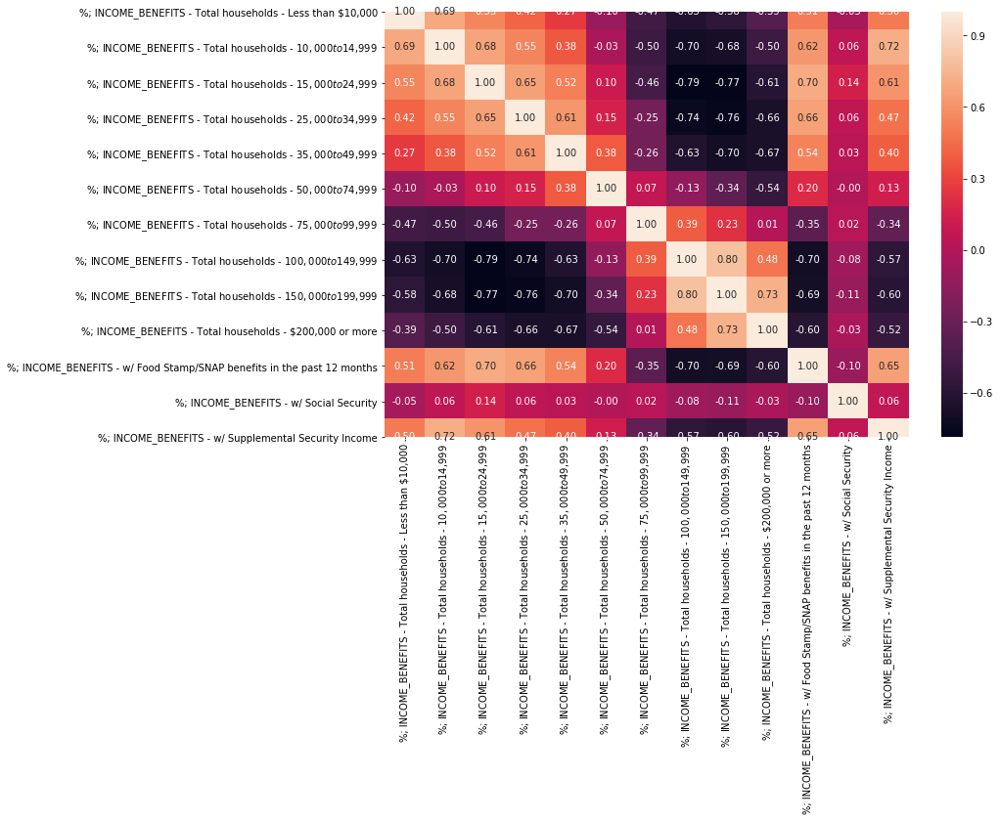

<IPython.core.display.Javascript object>

In [344]:
# Check for correlated and anti-correlated features - done before and after column filtering
fig, ax = plt.subplots(figsize=(12, 8))
sns.heatmap(
    df_state_info_gs_census[col_census_pct_ib].corr(method="pearson"),
    annot=True,
    fmt="0.2f",
)

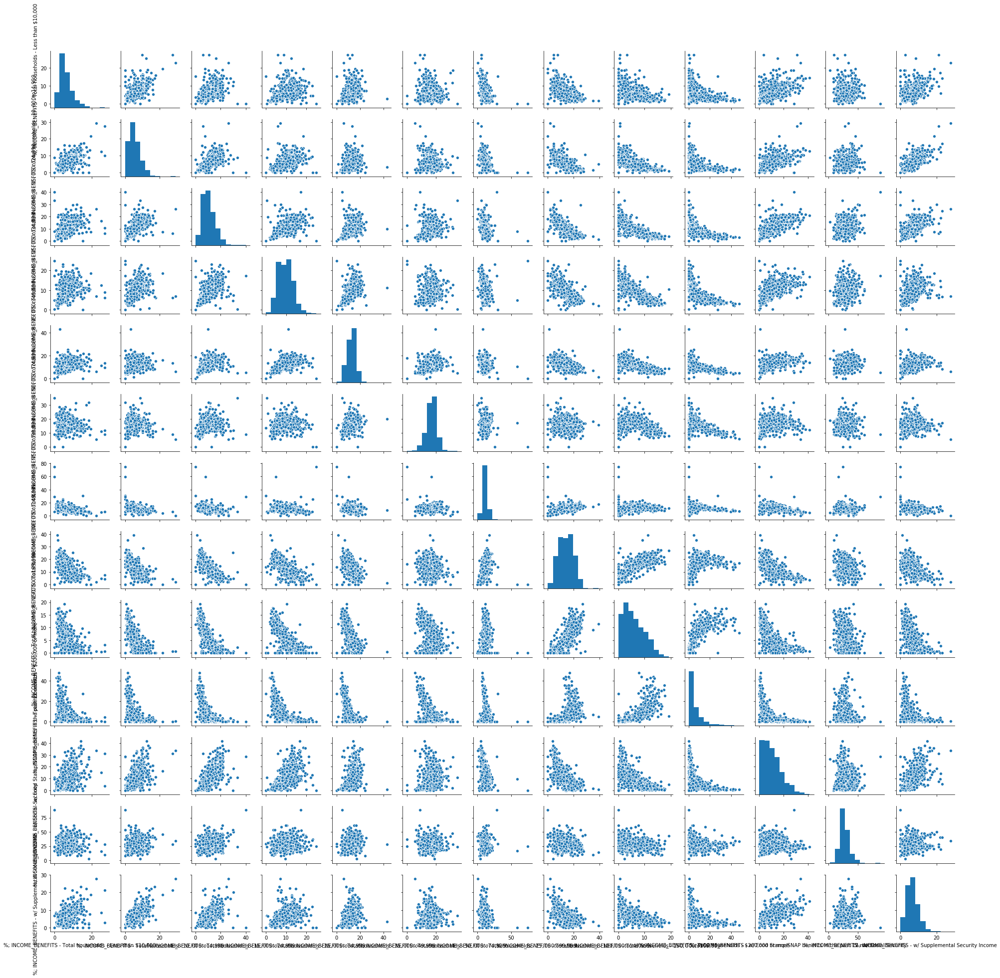

<IPython.core.display.Javascript object>

In [345]:
# Categorical breakdown of percent household income
sns.pairplot(df_state_info_gs_census.loc[:, col_census_pct_ib])

In [349]:
# Iteration 2 - hand select other columns to account for correlations anti-correlations, etc.

# % cash public assistance correlates with Food Stamp benefits
col_census_pct_ib_final = [
    "%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefits in the past 12 months",
    "%; INCOME_BENEFITS - w/ Social Security",
    "%; INCOME_BENEFITS - w/ Supplemental Security Income",
]

<IPython.core.display.Javascript object>

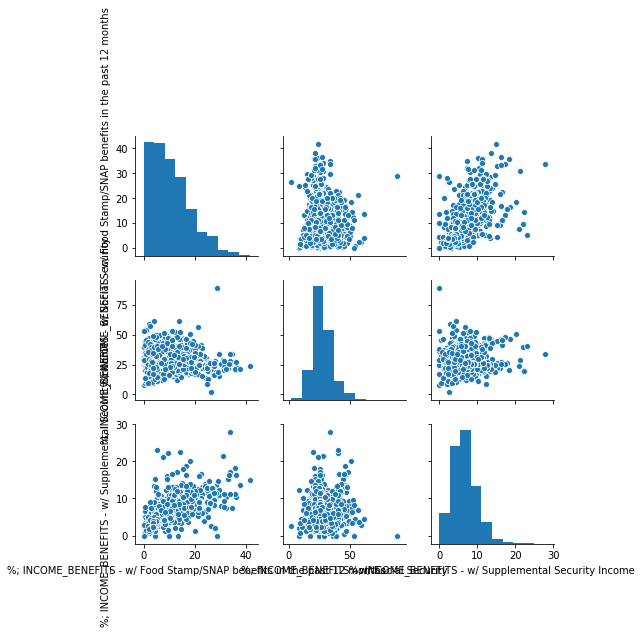

<IPython.core.display.Javascript object>

In [350]:
# Categorical breakdown of percent household income after feature culling
sns.pairplot(df_state_info_gs_census.loc[:, col_census_pct_ib_final]);


In [294]:
# View all correlation values, reshaping table
# df_state_info_gs_census[col_census_pct_ib[0:3]].corr(method='pearson')

<IPython.core.display.Javascript object>

##### Evaluation of estimated income benefits

In [340]:
col_census_est_ib = col_census_est[
    df_state_info_gs_census[col_census_est].columns.str.contains("INCOME_BENEFITS")
]
col_census_est_ib

Index(['Est.; INCOME_BENEFITS - Total households - Median household income ($)',
       'Est.; INCOME_BENEFITS - Total households - Mean household income ($)',
       'Est.; INCOME_BENEFITS - w/ Social Security - Mean Social Security income ($)',
       'Est.; INCOME_BENEFITS - w/ retirement income',
       'Est.; INCOME_BENEFITS - w/ retirement income - Mean retirement income ($)',
       'Est.; INCOME_BENEFITS - w/ cash public assistance income',
       'Est.; INCOME_BENEFITS - w/ cash public assistance income - Mean cash public assistance income ($)',
       'Est.; INCOME_BENEFITS - Families - Median family income ($)',
       'Est.; INCOME_BENEFITS - Families - Mean family income ($)',
       'Est.; INCOME_BENEFITS - Per capita income ($)',
       'Est.; INCOME_BENEFITS - Nonfamily households - Median nonfamily income ($)',
       'Est.; INCOME_BENEFITS - Nonfamily households - Mean nonfamily income ($)'],
      dtype='object')

<IPython.core.display.Javascript object>

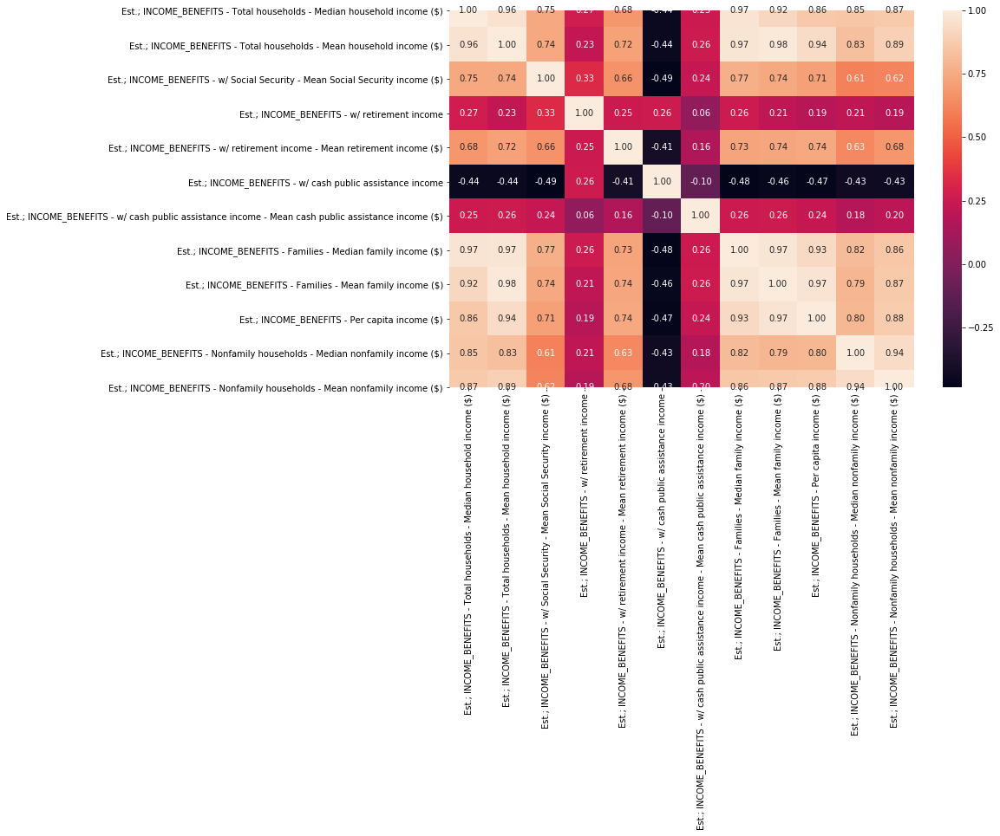

<IPython.core.display.Javascript object>

In [346]:
# Check for correlated and anti-correlated features - done before and after column filtering
fig, ax = plt.subplots(figsize=(12, 8))
sns.heatmap(
    df_state_info_gs_census[col_census_est_ib].corr(method="pearson"),
    annot=True,
    fmt="0.2f",
);

In [353]:
# Iteration 1 - hand select other columns to account for correlations anti-correlations, etc.
col_census_est_ib_final = [
    "Est.; INCOME_BENEFITS - Total households - Median household income ($)",
    "Est.; INCOME_BENEFITS - w/ retirement income - Mean retirement income ($)",
    "Est.; INCOME_BENEFITS - w/ cash public assistance income - Mean cash public assistance income ($)",
]

<IPython.core.display.Javascript object>

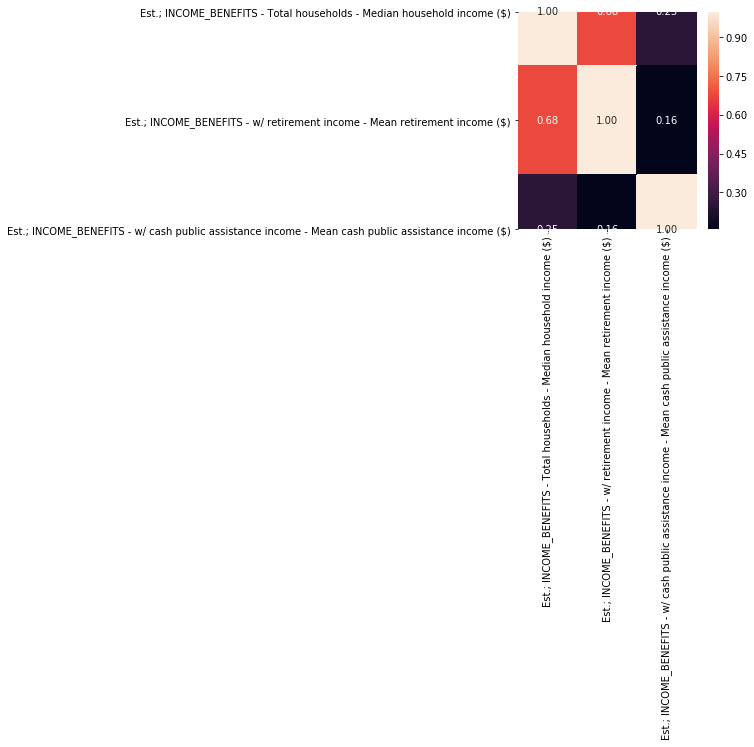

<IPython.core.display.Javascript object>

In [355]:
# Check for correlated and anti-correlated features - done before and after column filtering
fig, ax = plt.subplots(figsize=(4, 4))
sns.heatmap(
    df_state_info_gs_census[col_census_est_ib_final].corr(method="pearson"),
    annot=True,
    fmt="0.2f",
)

##### Examination space with text inspection

In [217]:
category_col = col_census_pct[df_state_info_gs_census[col_census_pct].columns.str.contains('INCOME_BENEFITS')]
category_col

Index(['%; INCOME_BENEFITS - w/ retirement income_x',
       '%; INCOME_BENEFITS - w/ cash public assistance income_x',
       '%; INCOME_BENEFITS - Total households - Less than $10,000',
       '%; INCOME_BENEFITS - Total households - $10,000 to $14,999',
       '%; INCOME_BENEFITS - Total households - $15,000 to $24,999',
       '%; INCOME_BENEFITS - Total households - $25,000 to $34,999',
       '%; INCOME_BENEFITS - Total households - $35,000 to $49,999',
       '%; INCOME_BENEFITS - Total households - $50,000 to $74,999',
       '%; INCOME_BENEFITS - Total households - $75,000 to $99,999',
       '%; INCOME_BENEFITS - Total households - $100,000 to $149,999',
       '%; INCOME_BENEFITS - Total households - $150,000 to $199,999',
       '%; INCOME_BENEFITS - Total households - $200,000 or more',
       '%; INCOME_BENEFITS - w/ earnings',
       '%; INCOME_BENEFITS - w/ Social Security',
       '%; INCOME_BENEFITS - w/ retirement income_y',
       '%; INCOME_BENEFITS - w/ Supplement

In [338]:
category_col = col_census_est[
    df_state_info_gs_census[col_census_est].columns.str.contains("INCOME_BENEFITS")
]
len(category_col)

12

<IPython.core.display.Javascript object>

In [214]:
df_state_info_gs_census[category_col].head()

,Est.; INCOME_BENEFITS - Total households - Median household income ($),Est.; INCOME_BENEFITS - Total households - Mean household income ($),Est.; INCOME_BENEFITS - w/ Social Security - Mean Social Security income ($),Est.; INCOME_BENEFITS - w/ retirement income,Est.; INCOME_BENEFITS - w/ retirement income - Mean retirement income ($),Est.; INCOME_BENEFITS - w/ cash public assistance income,Est.; INCOME_BENEFITS - w/ cash public assistance income - Mean cash public assistance income ($),Est.; INCOME_BENEFITS - Families - Median family income ($),Est.; INCOME_BENEFITS - Families - Mean family income ($),Est.; INCOME_BENEFITS - Per capita income ($),Est.; INCOME_BENEFITS - Nonfamily households - Median nonfamily income ($),Est.; INCOME_BENEFITS - Nonfamily households - Mean nonfamily income ($)
0,32993.0,55911.0,12978.0,659.0,29027.0,368.0,5055.0,38980.0,67067.0,32425.0,29122.0,51831.0
1,72884.0,99612.0,17113.0,3804.0,32115.0,827.0,4632.0,88693.0,118416.0,41592.0,52815.0,67936.0
2,31903.0,43104.0,12293.0,1086.0,19269.0,1268.0,5347.0,34633.0,44970.0,13082.0,18963.0,28948.0
3,31903.0,43104.0,12293.0,1086.0,19269.0,1268.0,5347.0,34633.0,44970.0,13082.0,18963.0,28948.0
4,80970.0,105995.0,17921.0,1085.0,36487.0,83.0,4229.0,95880.0,118328.0,42019.0,49099.0,74376.0


In [219]:
df_state_info_gs_census[category_col].sum(axis=1)

0       356416.0
1       600439.0
2       254866.0
3       254866.0
4       626472.0
          ...   
1147    434406.0
1148    367796.0
1149    342714.0
1150    342714.0
1151    430859.0
Length: 1152, dtype: float64

##### Examination space with visualizations of various features

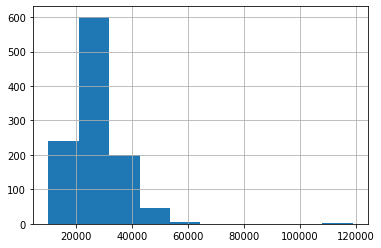

In [221]:
# Histogram
df_state_info_gs_census[category_col].iloc[:, 4].hist()

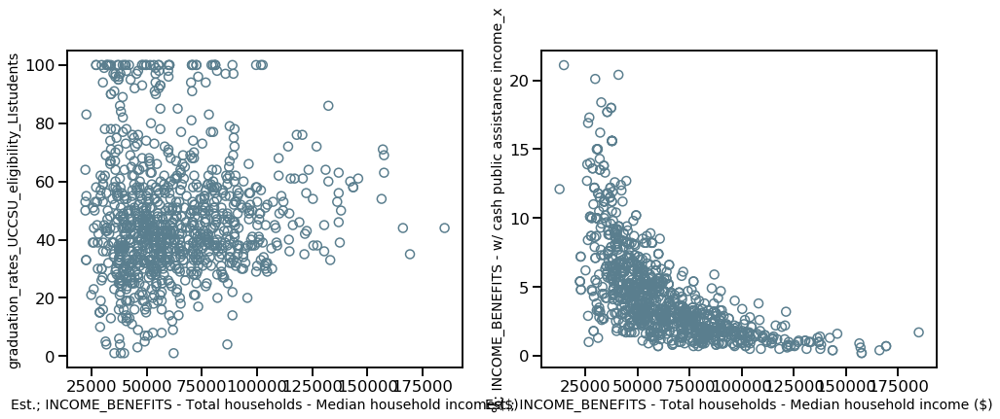

<IPython.core.display.Javascript object>

In [360]:
# Scatter plots
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
scatter_plot_open_circles(df_state_info_gs_census, 
                          'Est.; INCOME_BENEFITS - Total households - Median household income ($)', 
                          'graduation_rates_UCCSU_eligibility_LIstudents', 
                          ax1)

scatter_plot_open_circles(df_state_info_gs_census, 
                          'Est.; INCOME_BENEFITS - Total households - Median household income ($)', 
                          '%; INCOME_BENEFITS - w/ cash public assistance income_x', 
                          ax2)


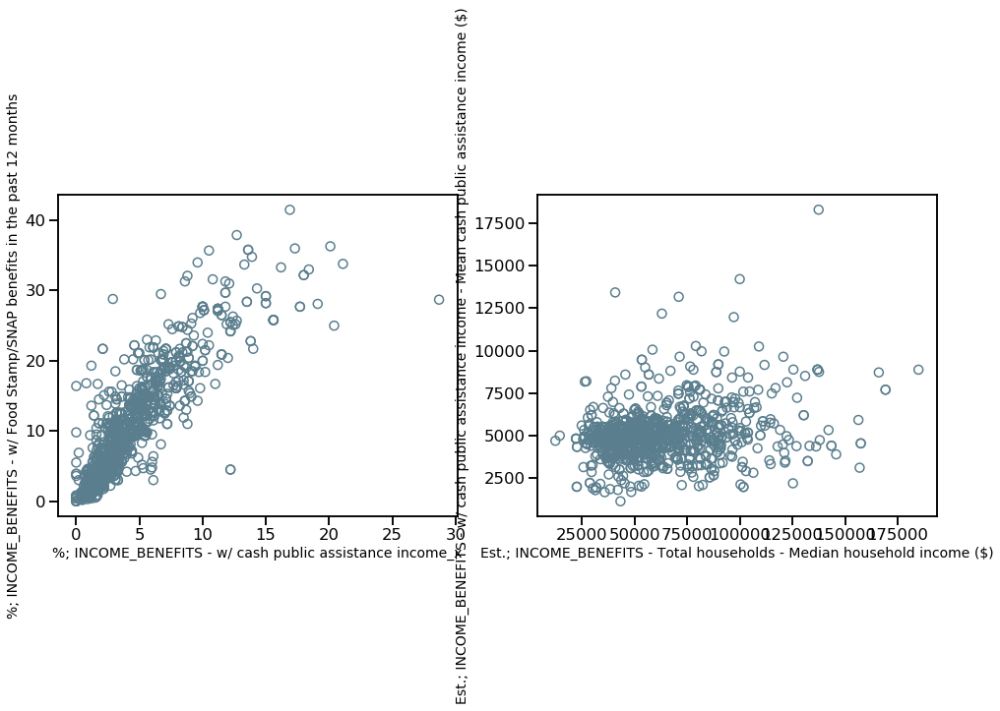

<IPython.core.display.Javascript object>

In [361]:
# Scatter plots
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
scatter_plot_open_circles(df_state_info_gs_census, 
                          '%; INCOME_BENEFITS - w/ cash public assistance income_x', 
                          '%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefits in the past 12 months', 
                          ax1)

scatter_plot_open_circles(df_state_info_gs_census, 
                          'Est.; INCOME_BENEFITS - Total households - Median household income ($)',
                          'Est.; INCOME_BENEFITS - w/ cash public assistance income - Mean cash public assistance income ($)', 
                          ax2)


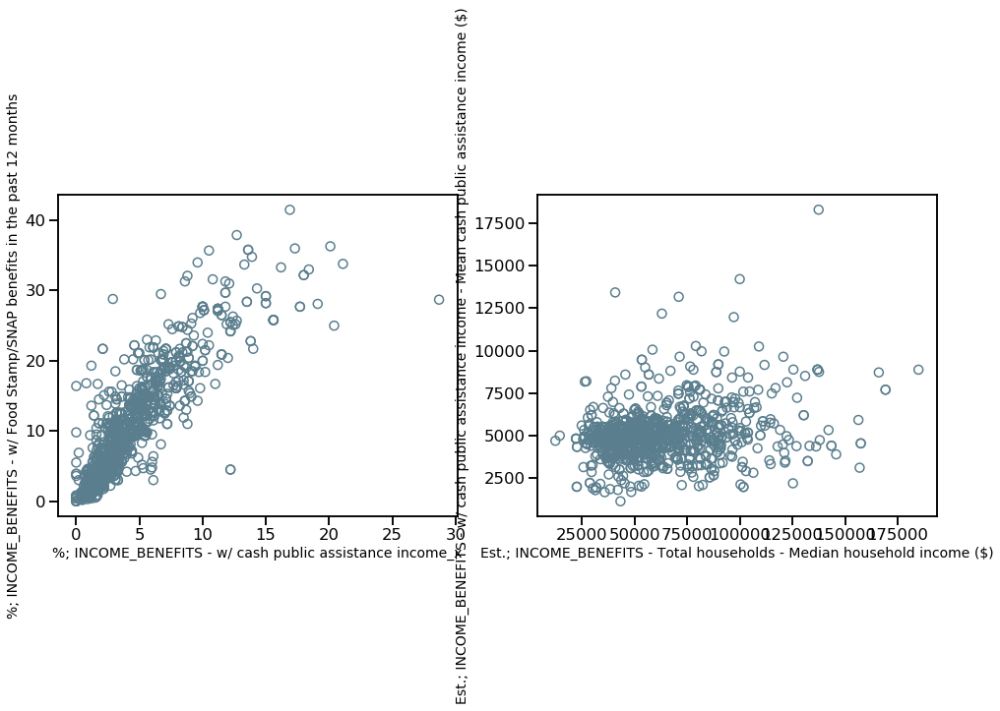

<IPython.core.display.Javascript object>

In [364]:
# Scatter plots - do I need percent and estimated income benefit columns?
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
scatter_plot_open_circles(
    df_state_info_gs_census,
    "%; INCOME_BENEFITS - w/ cash public assistance income_x",
    "%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefits in the past 12 months",
    ax1,
)

scatter_plot_open_circles(
    df_state_info_gs_census,
    "Est.; INCOME_BENEFITS - Total households - Median household income ($)",
    "Est.; INCOME_BENEFITS - w/ cash public assistance income - Mean cash public assistance income ($)",
    ax2,
)

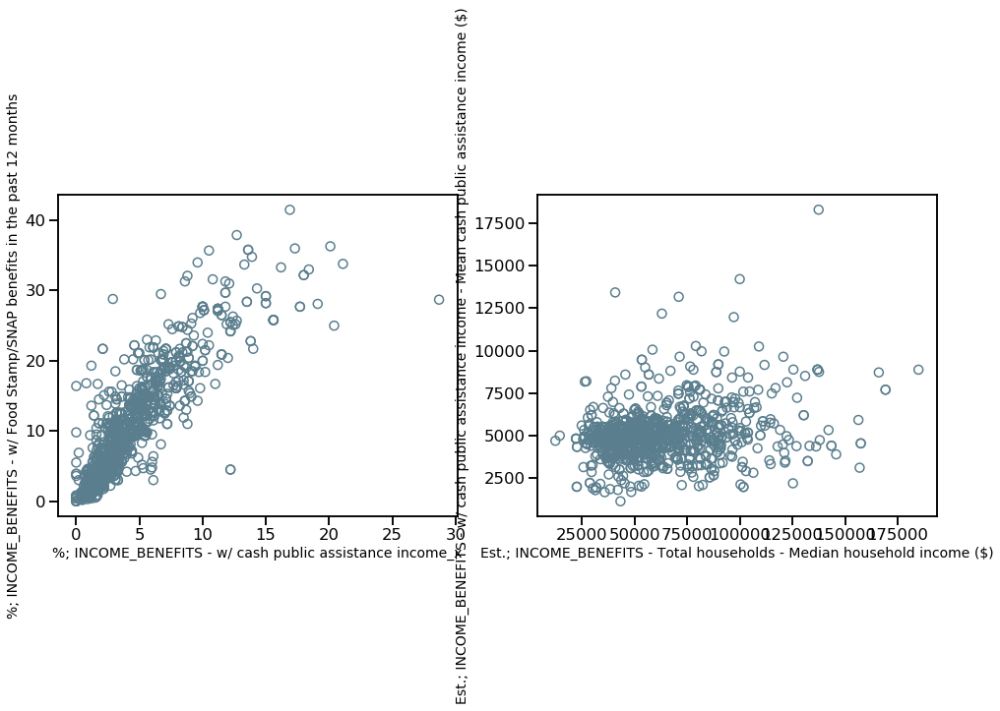

<IPython.core.display.Javascript object>

In [365]:
# Scatter plots - do I need percent and estimated income benefit columns?
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
scatter_plot_open_circles(df_state_info_gs_census, 
                          '%; INCOME_BENEFITS - w/ cash public assistance income_x', 
                          '%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefits in the past 12 months', 
                          ax1)

scatter_plot_open_circles(df_state_info_gs_census, 
                          'Est.; INCOME_BENEFITS - Total households - Median household income ($)',
                          'Est.; INCOME_BENEFITS - w/ cash public assistance income - Mean cash public assistance income ($)', 
                          ax2)


#### Health insurance columns

In [368]:
col_census_pct_hi = col_census_pct[
    df_state_info_gs_census[col_census_pct].columns.str.contains("HEALTH_INS")
].tolist()

<IPython.core.display.Javascript object>

In [375]:
col_census_pct_hi

['%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage',
 '%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage - w/ private health insurance',
 '%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage - w/ public coverage',
 '%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - No health ins coverage',
 '%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. <18 yrs - No health ins coverage',
 '%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. 18-64 yrs - In labor force: - Employed: - w/ health ins coverage',
 '%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. 18-64 yrs - In labor force: - Employed: - w/ health ins coverage - w/ private health insurance',
 '%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. 18-64 yrs - In labor force: - Employed: - w/ health ins coverage - w/ public coverage',
 '%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized p

<IPython.core.display.Javascript object>

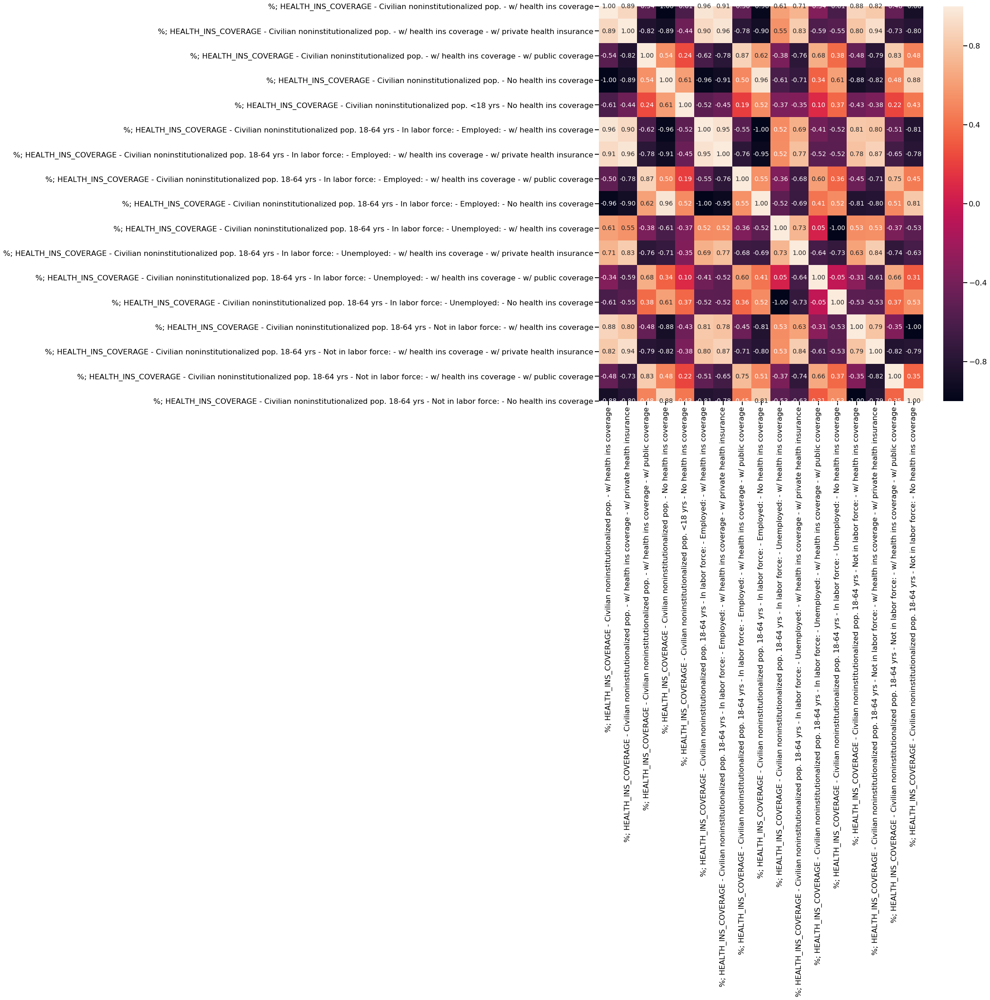

<IPython.core.display.Javascript object>

In [372]:
fig, ax = plt.subplots(figsize=(16, 16))
sns.heatmap(
    df_state_info_gs_census[col_census_pct_hi].corr(method="pearson"),
    annot=True,
    fmt="0.2f",
)

In [377]:
# Iteration 1 - hand select other columns to account for correlations anti-correlations, etc.
# Removed those with

col_census_pct_hi_v0 = [
    "%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage",
    "%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage - w/ public coverage",
    "%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. <18 yrs - No health ins coverage",
]

<IPython.core.display.Javascript object>

In [380]:
df_state_info_gs_census[col_census_pct_hi_v0].corr(method="pearson")

,%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage,%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage - w/ public coverage,%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. <18 yrs - No health ins coverage
%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage,1.000000,-0.540853,-0.609231
%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage - w/ public coverage,-0.540853,1.000000,0.242434
%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. <18 yrs - No health ins coverage,-0.609231,0.242434,1.000000


<IPython.core.display.Javascript object>

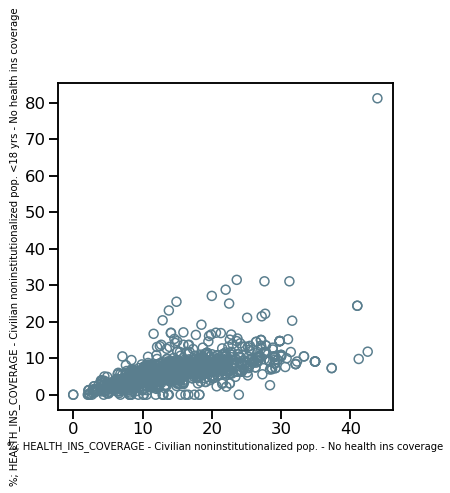

<IPython.core.display.Javascript object>

In [374]:
# Scatter plots - do I need percent and estimated income benefit columns?
f, (ax1) = plt.subplots(1, 1, figsize=(6, 6))
scatter_plot_open_circles(
    df_state_info_gs_census,
    "%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - No health ins coverage",
    "%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. <18 yrs - No health ins coverage",
    ax1,
)

In [414]:
col_census_pct_hi_final = col_census_pct_hi_v0.copy()
col_census_pct_hi_final

['%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage',
 '%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage - w/ public coverage',
 '%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. <18 yrs - No health ins coverage']

<IPython.core.display.Javascript object>

#### Work commute columns

In [383]:
col_census_pct_wc = col_census_pct[
    df_state_info_gs_census[col_census_pct].columns.str.contains("WORK_COMMUTE")
].tolist()
col_census_pct_wc

['%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- drove alone',
 '%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- carpooled',
 '%; WORK_COMMUTE - Workers 16 yrs and up - Public transportation (excluding taxicab)',
 '%; WORK_COMMUTE - Workers 16 yrs and up - Walked',
 '%; WORK_COMMUTE - Workers 16 yrs and up - Other means',
 '%; WORK_COMMUTE - Workers 16 yrs and up - Worked at home']

<IPython.core.display.Javascript object>

In [386]:
df_state_info_gs_census[col_census_pct_wc].corr(method="pearson")

,"%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- drove alone","%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- carpooled",%; WORK_COMMUTE - Workers 16 yrs and up - Public transportation (excluding taxicab),%; WORK_COMMUTE - Workers 16 yrs and up - Walked,%; WORK_COMMUTE - Workers 16 yrs and up - Other means,%; WORK_COMMUTE - Workers 16 yrs and up - Worked at home
"%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- drove alone",1.000000,-0.134708,-0.748350,-0.621511,-0.478256,-0.256264
"%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- carpooled",-0.134708,1.000000,-0.076330,-0.187178,-0.069642,-0.390938
%; WORK_COMMUTE - Workers 16 yrs and up - Public transportation (excluding taxicab),-0.748350,-0.076330,1.000000,0.287804,0.195814,-0.073084
%; WORK_COMMUTE - Workers 16 yrs and up - Walked,-0.621511,-0.187178,0.287804,1.000000,0.385832,0.162550
%; WORK_COMMUTE - Workers 16 yrs and up - Other means,-0.478256,-0.069642,0.195814,0.385832,1.000000,-0.024728
%; WORK_COMMUTE - Workers 16 yrs and up - Worked at home,-0.256264,-0.390938,-0.073084,0.162550,-0.024728,1.000000


<IPython.core.display.Javascript object>

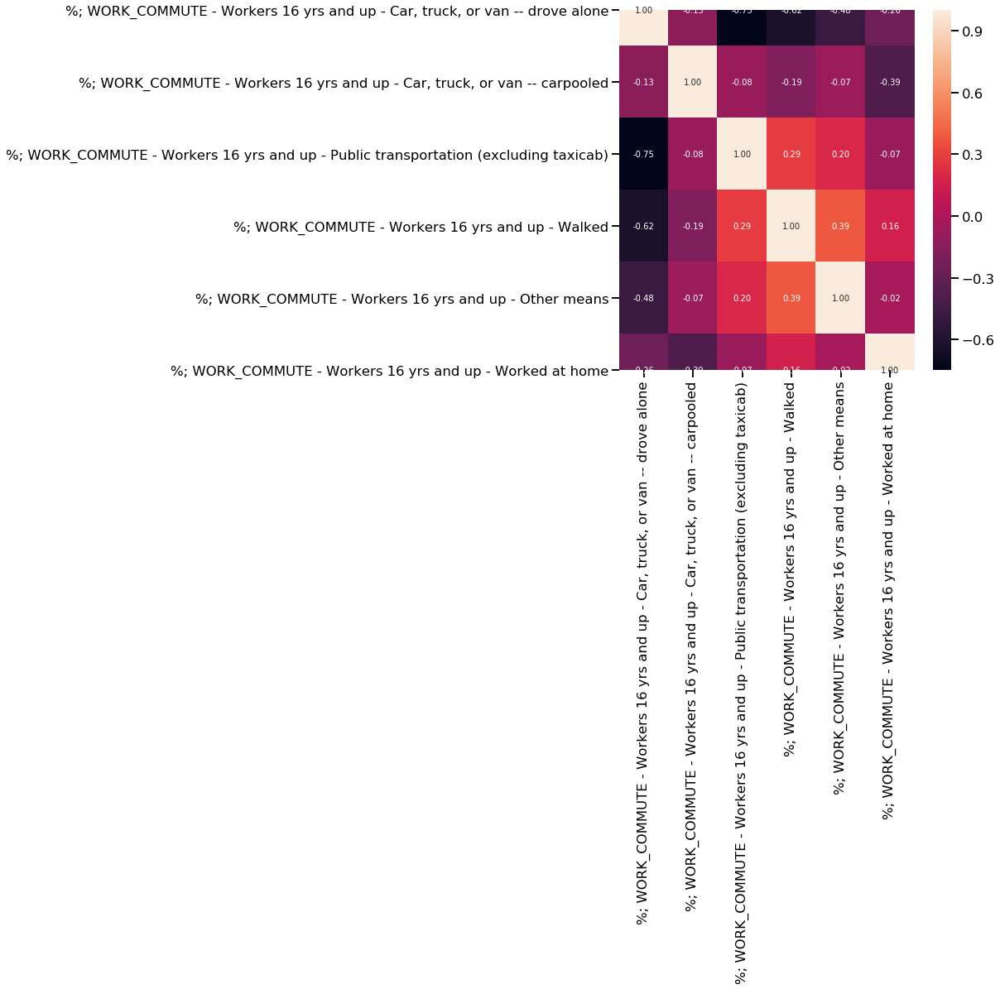

<IPython.core.display.Javascript object>

In [385]:
fig, ax = plt.subplots(figsize=(8, 8))
sns.heatmap(
    df_state_info_gs_census[col_census_pct_wc].corr(method="pearson"),
    annot=True,
    fmt="0.2f",
)

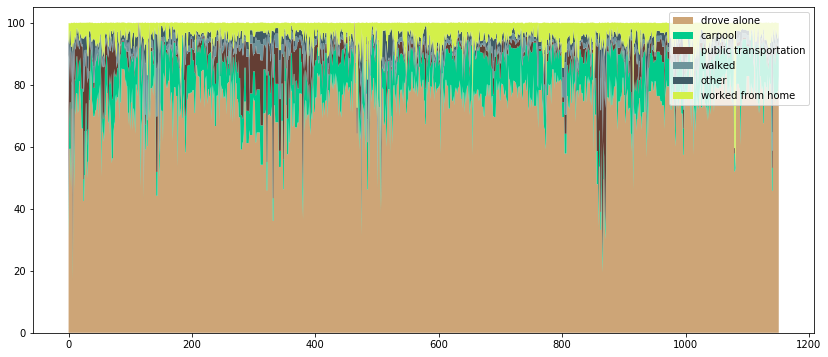

<IPython.core.display.Javascript object>

In [320]:
f, ax1 = plt.subplots(figsize=(14, 6))

ax1.stackplot(
    range(len(df_state_info_gs_census)),
    df_state_info_gs_census[work_commute_col].iloc[:, 0],
    df_state_info_gs_census[work_commute_col].iloc[:, 1],
    df_state_info_gs_census[work_commute_col].iloc[:, 2],
    df_state_info_gs_census[work_commute_col].iloc[:, 3],
    df_state_info_gs_census[work_commute_col].iloc[:, 4],
    df_state_info_gs_census[work_commute_col].iloc[:, 5],
    colors=B_colors_cat[0:6],
    labels=[
        "drove alone",
        "carpool",
        "public transportation",
        "walked",
        "other",
        "worked from home",
    ],
)

ax1.legend()

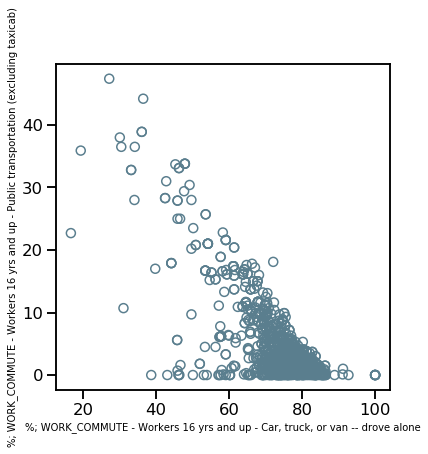

<IPython.core.display.Javascript object>

In [393]:
# Scatter plots - do I need percent and estimated income benefit columns?
f, (ax1) = plt.subplots(1, 1, figsize=(6, 6))
scatter_plot_open_circles(
    df_state_info_gs_census,
    "%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- drove alone",
    "%; WORK_COMMUTE - Workers 16 yrs and up - Public transportation (excluding taxicab)",
    ax1,
)

**The Pearson is -.0.75. It's borderline, but I'll keep both "drove alone" and "public transportation" since it's possible that they could be giving different information. But I will drop "other" and "work from home"**

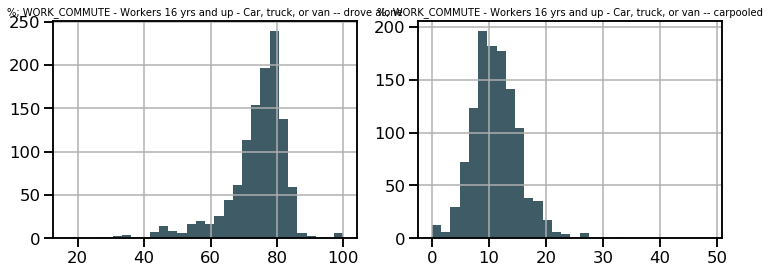

<IPython.core.display.Javascript object>

In [395]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

hist_plot(
    df_state_info_gs_census,
    "%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- drove alone",
    ax1,
)

hist_plot(
    df_state_info_gs_census,
    '%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- carpooled',
    ax2,
)

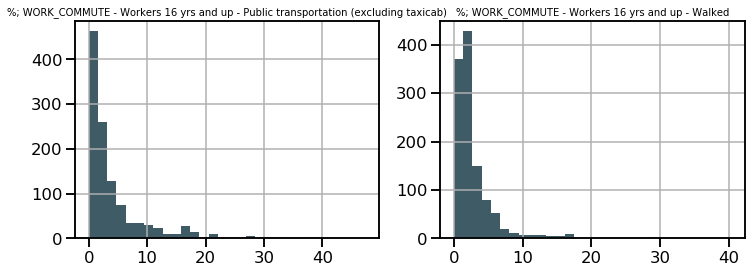

<IPython.core.display.Javascript object>

In [396]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

hist_plot(
    df_state_info_gs_census,
    "%; WORK_COMMUTE - Workers 16 yrs and up - Public transportation (excluding taxicab)",
    ax1,
)

hist_plot(
    df_state_info_gs_census, "%; WORK_COMMUTE - Workers 16 yrs and up - Walked", ax2,
)

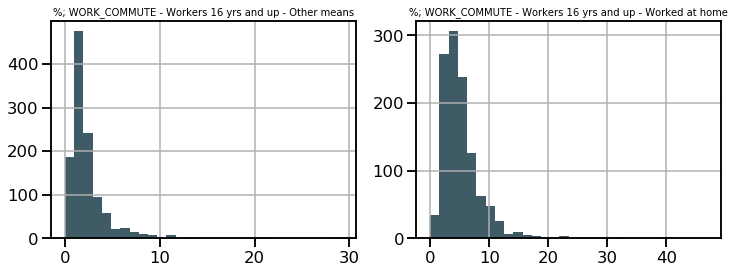

<IPython.core.display.Javascript object>

In [397]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

hist_plot(
    df_state_info_gs_census,
    "%; WORK_COMMUTE - Workers 16 yrs and up - Other means",
    ax1,
)

hist_plot(
    df_state_info_gs_census,
    "%; WORK_COMMUTE - Workers 16 yrs and up - Worked at home",
    ax2,
)

In [463]:
# Chose these since they had a more normal distribution and minimized correlations/anti-correlations
col_census_pct_wc_final = [
    "%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- drove alone",
    "%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- carpooled",
    "%; WORK_COMMUTE - Workers 16 yrs and up - Public transportation (excluding taxicab)",
    "%; WORK_COMMUTE - Workers 16 yrs and up - Walked",
    "%; WORK_COMMUTE - Workers 16 yrs and up - Worked at home",
]

<IPython.core.display.Javascript object>

#### Occupation and industry columns

In [400]:
col_census_pct_occ = col_census_pct[
    df_state_info_gs_census[col_census_pct].columns.str.contains("OCCUPATION")
].tolist()
col_census_pct_occ

['%; OCCUPATION - Civilian employed pop. 16 yrs and up - Management, business, science, and arts occupations',
 '%; OCCUPATION - Civilian employed pop. 16 yrs and up - Service occupations',
 '%; OCCUPATION - Civilian employed pop. 16 yrs and up - Sales and office occupations',
 '%; OCCUPATION - Civilian employed pop. 16 yrs and up - Natural resources, construction, and maintenance occupations',
 '%; OCCUPATION - Civilian employed pop. 16 yrs and up - Production, transportation, and material moving occupations']

<IPython.core.display.Javascript object>

In [402]:
df_state_info_gs_census[col_census_pct_occ].corr(method="pearson")

,"%; OCCUPATION - Civilian employed pop. 16 yrs and up - Management, business, science, and arts occupations",%; OCCUPATION - Civilian employed pop. 16 yrs and up - Service occupations,%; OCCUPATION - Civilian employed pop. 16 yrs and up - Sales and office occupations,"%; OCCUPATION - Civilian employed pop. 16 yrs and up - Natural resources, construction, and maintenance occupations","%; OCCUPATION - Civilian employed pop. 16 yrs and up - Production, transportation, and material moving occupations"
"%; OCCUPATION - Civilian employed pop. 16 yrs and up - Management, business, science, and arts occupations",1.000000,-0.651119,-0.112866,-0.637251,-0.772026
%; OCCUPATION - Civilian employed pop. 16 yrs and up - Service occupations,-0.651119,1.000000,-0.005824,0.171893,0.314625
%; OCCUPATION - Civilian employed pop. 16 yrs and up - Sales and office occupations,-0.112866,-0.005824,1.000000,-0.377559,0.019558
"%; OCCUPATION - Civilian employed pop. 16 yrs and up - Natural resources, construction, and maintenance occupations",-0.637251,0.171893,-0.377559,1.000000,0.327353
"%; OCCUPATION - Civilian employed pop. 16 yrs and up - Production, transportation, and material moving occupations",-0.772026,0.314625,0.019558,0.327353,1.000000


<IPython.core.display.Javascript object>

In [403]:
col_census_pct_industry = col_census_pct[
    df_state_info_gs_census[col_census_pct].columns.str.contains("INDUSTRY")
].tolist()
col_census_pct_industry

['%; INDUSTRY - Civilian employed pop. 16 yrs and up - Agriculture, forestry, fishing and hunting, and mining',
 '%; INDUSTRY - Civilian employed pop. 16 yrs and up - Construction',
 '%; INDUSTRY - Civilian employed pop. 16 yrs and up - Manufacturing',
 '%; INDUSTRY - Civilian employed pop. 16 yrs and up - Wholesale trade',
 '%; INDUSTRY - Civilian employed pop. 16 yrs and up - Retail trade',
 '%; INDUSTRY - Civilian employed pop. 16 yrs and up - Transportation and warehousing, and utilities',
 '%; INDUSTRY - Civilian employed pop. 16 yrs and up - Information',
 '%; INDUSTRY - Civilian employed pop. 16 yrs and up - Finance and insurance, and real estate and rental and leasing',
 '%; INDUSTRY - Civilian employed pop. 16 yrs and up - Professional, scientific, and management, and administrative and waste management services',
 '%; INDUSTRY - Civilian employed pop. 16 yrs and up - Educational services, and health care and social assistance',
 '%; INDUSTRY - Civilian employed pop. 16 yrs an

<IPython.core.display.Javascript object>

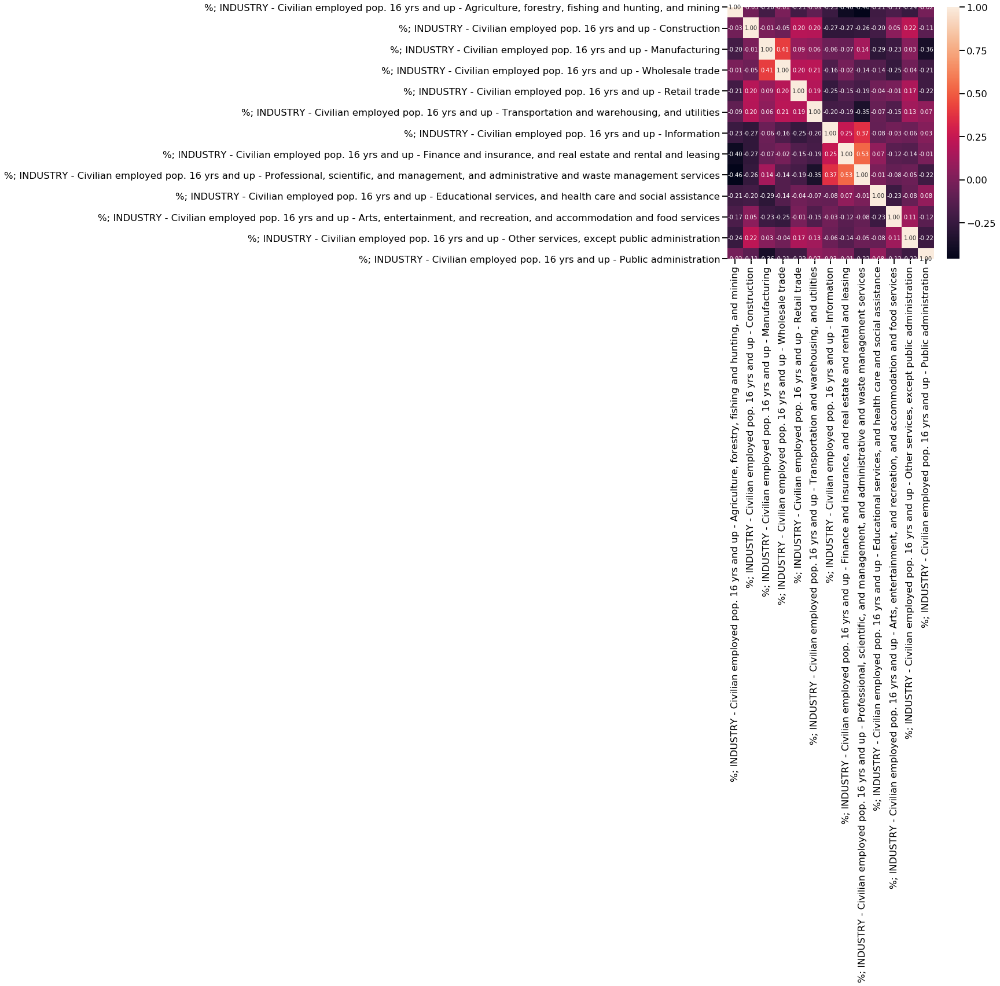

<IPython.core.display.Javascript object>

In [405]:
fig, ax = plt.subplots(figsize=(8, 8))
sns.heatmap(
    df_state_info_gs_census[col_census_pct_industry].corr(method="pearson"),
    annot=True,
    fmt="0.2f",
)

In [408]:
# df_state_info_gs_census[col_census_pct_industry].corr(method="pearson")

<IPython.core.display.Javascript object>

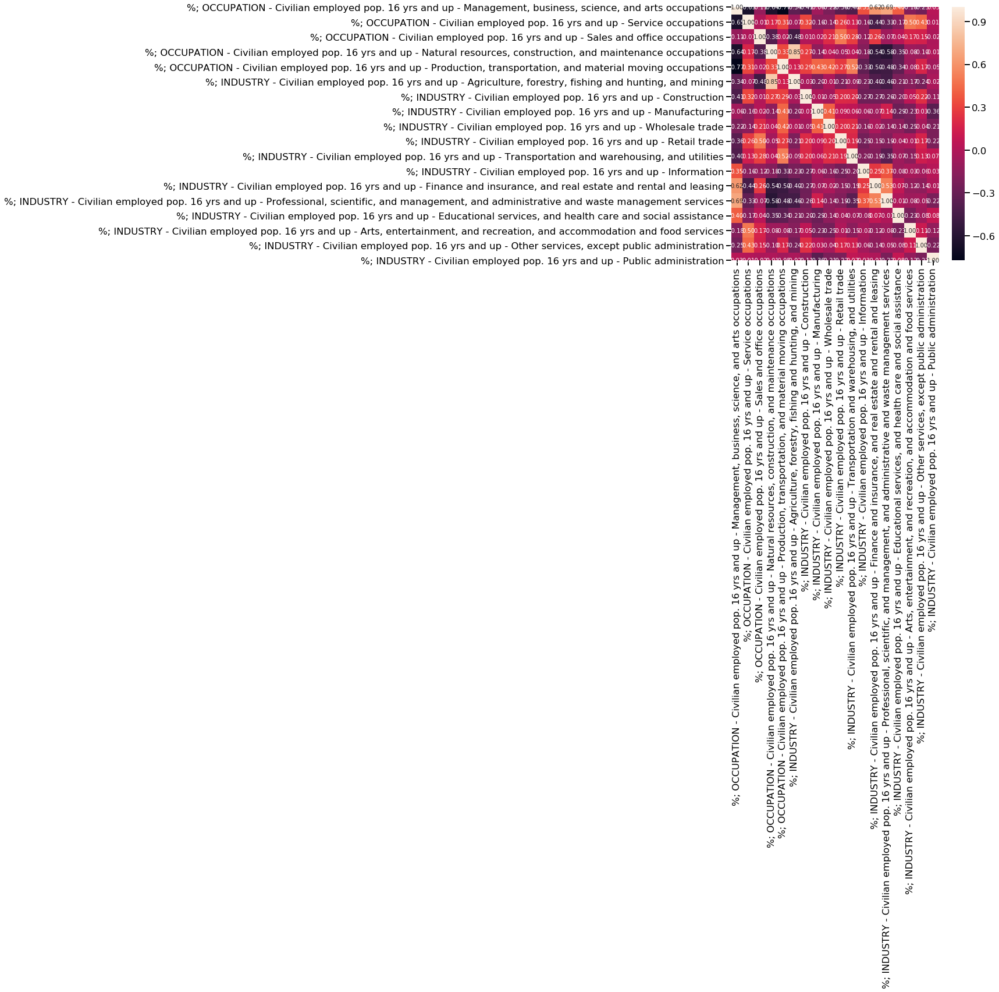

<IPython.core.display.Javascript object>

In [410]:
# Occupational and industry columns
fig, ax = plt.subplots(figsize=(8, 8))
sns.heatmap(
    df_state_info_gs_census[col_census_pct_occ + col_census_pct_industry].corr(
        method="pearson"
    ),
    annot=True,
    fmt="0.2f",
)

In [411]:
df_state_info_gs_census[col_census_pct_occ + col_census_pct_industry].corr(
    method="pearson"
)

,"%; OCCUPATION - Civilian employed pop. 16 yrs and up - Management, business, science, and arts occupations",%; OCCUPATION - Civilian employed pop. 16 yrs and up - Service occupations,%; OCCUPATION - Civilian employed pop. 16 yrs and up - Sales and office occupations,"%; OCCUPATION - Civilian employed pop. 16 yrs and up - Natural resources, construction, and maintenance occupations","%; OCCUPATION - Civilian employed pop. 16 yrs and up - Production, transportation, and material moving occupations","%; INDUSTRY - Civilian employed pop. 16 yrs and up - Agriculture, forestry, fishing and hunting, and mining",%; INDUSTRY - Civilian employed pop. 16 yrs and up - Construction,%; INDUSTRY - Civilian employed pop. 16 yrs and up - Manufacturing,%; INDUSTRY - Civilian employed pop. 16 yrs and up - Wholesale trade,%; INDUSTRY - Civilian employed pop. 16 yrs and up - Retail trade,"%; INDUSTRY - Civilian employed pop. 16 yrs and up - Transportation and warehousing, and utilities",%; INDUSTRY - Civilian employed pop. 16 yrs and up - Information,"%; INDUSTRY - Civilian employed pop. 16 yrs and up - Finance and insurance, and real estate and rental and leasing","%; INDUSTRY - Civilian employed pop. 16 yrs and up - Professional, scientific, and management, and administrative and waste management services","%; INDUSTRY - Civilian employed pop. 16 yrs and up - Educational services, and health care and social assistance","%; INDUSTRY - Civilian employed pop. 16 yrs and up - Arts, entertainment, and recreation, and accommodation and food services","%; INDUSTRY - Civilian employed pop. 16 yrs and up - Other services, except public administration",%; INDUSTRY - Civilian employed pop. 16 yrs and up - Public administration
"%; OCCUPATION - Civilian employed pop. 16 yrs and up - Management, business, science, and arts occupations",1.000000,-0.651119,-0.112866,-0.637251,-0.772026,-0.336756,-0.412884,-0.064357,-0.216176,-0.359250,-0.401320,0.354922,0.619367,0.686628,0.402354,-0.181746,-0.251939,0.029640
%; OCCUPATION - Civilian employed pop. 16 yrs and up - Service occupations,-0.651119,1.000000,-0.005824,0.171893,0.314625,-0.065766,0.317193,-0.158169,-0.144442,0.263628,0.128541,-0.162298,-0.443095,-0.326043,-0.173869,0.496177,0.433081,0.012932
%; OCCUPATION - Civilian employed pop. 16 yrs and up - Sales and office occupations,-0.112866,-0.005824,1.000000,-0.377559,0.019558,-0.476017,0.008806,0.019921,0.210372,0.496428,0.284236,-0.123303,0.262218,-0.068594,0.036469,0.167170,0.149692,-0.015600
"%; OCCUPATION - Civilian employed pop. 16 yrs and up - Natural resources, construction, and maintenance occupations",-0.637251,0.171893,-0.377559,1.000000,0.327353,0.846018,0.274436,-0.139901,0.038191,-0.051668,0.038276,-0.183049,-0.535469,-0.579994,-0.351597,-0.075552,-0.099985,-0.009806
"%; OCCUPATION - Civilian employed pop. 16 yrs and up - Production, transportation, and material moving occupations",-0.772026,0.314625,0.019558,0.327353,1.000000,0.132925,0.287661,0.430231,0.415384,0.270263,0.521042,-0.330199,-0.500786,-0.481135,-0.335958,-0.078284,0.170713,-0.054744
"%; INDUSTRY - Civilian employed pop. 16 yrs and up - Agriculture, forestry, fishing and hunting, and mining",-0.336756,-0.065766,-0.476017,0.846018,0.132925,1.000000,-0.034049,-0.197875,-0.006528,-0.205810,-0.093545,-0.231081,-0.401008,-0.457953,-0.214443,-0.172716,-0.236332,-0.021795
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Construction,-0.412884,0.317193,0.008806,0.274436,0.287661,-0.034049,1.000000,-0.006547,-0.051895,0.200251,0.195629,-0.271239,-0.271492,-0.257875,-0.196911,0.052843,0.224600,-0.112985
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Manufacturing,-0.064357,-0.158169,0.019921,-0.139901,0.430231,-0.197875,-0.006547,1.000000,0.408274,0.085309,0.061410,-0.058021,-0.067525,0.137603,-0.285511,-0.225374,0.033621,-0.363136
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Wholesale trade,-0.216176,-0.144442,0.210372,0.038191,0.415384,-0.006528,-0.051895,0.408274,1.00

<IPython.core.display.Javascript object>

**I'll keep the industry columns but drop the occupation columns. The former is more variable and has fewer correlations/anti-correlations.**

In [413]:
col_census_pct_industry_final = col_census_pct_industry.copy()

<IPython.core.display.Javascript object>

#### Worker class columns

In [415]:
col_census_pct_workerclass = col_census_pct[
    df_state_info_gs_census[col_census_pct].columns.str.contains("WORKER_CLASS")
].tolist()

df_state_info_gs_census[col_census_pct_workerclass].corr(method="pearson")

,%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Private wage and salary workers,%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Government workers,%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Self-employed in own not incorporated business workers,%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Unpaid family workers
%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Private wage and salary workers,1.000000,-0.855091,-0.424615,-0.223774
%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Government workers,-0.855091,1.000000,-0.084067,0.050251
%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Self-employed in own not incorporated business workers,-0.424615,-0.084067,1.000000,0.072156
%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Unpaid family workers,-0.223774,0.050251,0.072156,1.000000


<IPython.core.display.Javascript object>

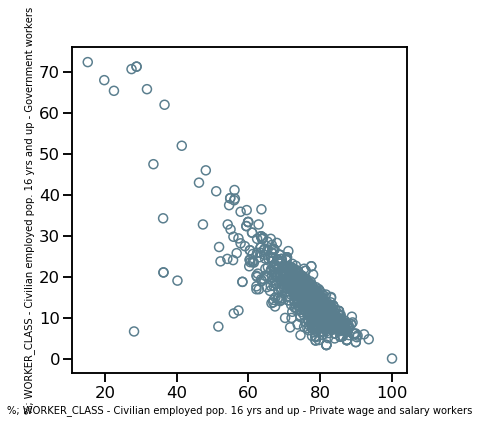

<IPython.core.display.Javascript object>

In [418]:
# Scatter plots - do I need percent and estimated income benefit columns?
f, (ax1) = plt.subplots(1, 1, figsize=(6, 6))
scatter_plot_open_circles(
    df_state_info_gs_census,
    "%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Private wage and salary workers",
    "%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Government workers",
    ax1,
)

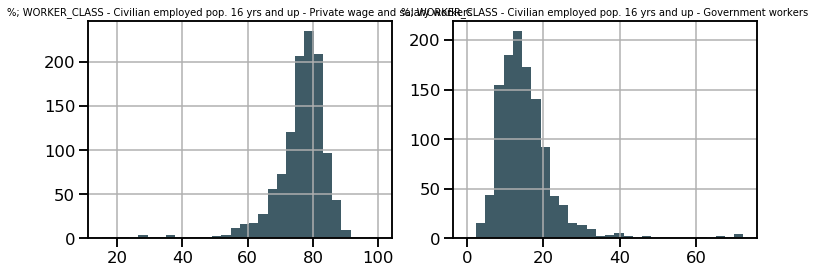

<IPython.core.display.Javascript object>

In [417]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

hist_plot(
    df_state_info_gs_census,
    "%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Private wage and salary workers",
    ax1,
)

hist_plot(
    df_state_info_gs_census,
    "%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Government workers",
    ax2,
)

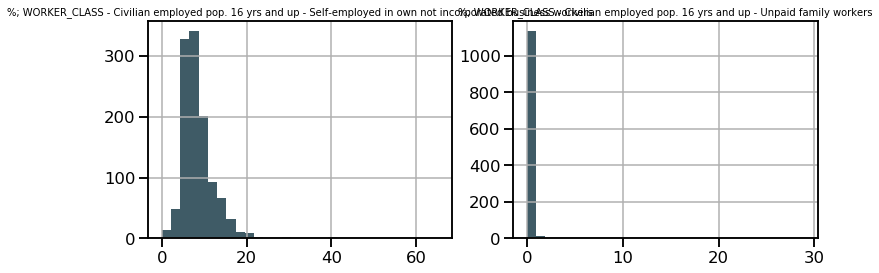

<IPython.core.display.Javascript object>

In [419]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

hist_plot(
    df_state_info_gs_census,
    "%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Self-employed in own not incorporated business workers",
    ax1,
)

hist_plot(
    df_state_info_gs_census,
    "%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Unpaid family workers",
    ax2,
)

**Drop government workers since they're highly correlated with private wage and salary workers. Also drop Unpaid family workers since they're pretty rare.**

In [421]:
col_census_pct_workerclass_final = [
    "%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Private wage and salary workers",
    "%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Self-employed in own not incorporated business workers",
]

<IPython.core.display.Javascript object>

#### Employment status columns

In [423]:
col_census_pct_employstatus = col_census_pct[
    df_state_info_gs_census[col_census_pct].columns.str.contains("EMPLOY_STATUS")
].tolist()

df_state_info_gs_census[col_census_pct_employstatus].corr(method="pearson")

,%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force,%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Civilian labor force,%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Civilian labor force - Employed,%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Civilian labor force - Unemployed,%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Armed Forces,%; EMPLOY_STATUS - Pop. 16 yrs and up - Not in labor force,%; EMPLOY_STATUS - Civilian labor force - Unemployment Rate,%; EMPLOY_STATUS - Females 16 yrs and up - In labor force,%; EMPLOY_STATUS - Females 16 yrs and up - In labor force - Civilian labor force,%; EMPLOY_STATUS - Females 16 yrs and up - In labor force - Civilian labor force - Employed,%; EMPLOY_STATUS - Own children of the householder under 6 yrs - All parents in family in labor force,%; EMPLOY_STATUS - Own children of the householder 6 to 17 yrs - All parents in family in labor force
%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force,1.000000,0.980370,0.940891,0.009738,0.076908,-1.000000,-0.333101,0.816019,0.811268,0.763717,0.251985,0.337010
%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Civilian labor force,0.980370,1.000000,0.954733,0.026683,-0.121120,-0.980370,-0.322781,0.806772,0.813365,0.763647,0.275864,0.339235
%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Civilian labor force - Employed,0.940891,0.954733,1.000000,-0.271813,-0.090588,-0.940891,-0.586093,0.792304,0.796778,0.838028,0.280439,0.345632
%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Civilian labor force - Unemployed,0.009738,0.026683,-0.271813,1.000000,-0.087336,-0.009738,0.925408,-0.052375,-0.046089,-0.345300,-0.048061,-0.061140
%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Armed Forces,0.076908,-0.121120,-0.090588,-0.087336,1.000000,-0.076908,-0.046006,0.028574,-0.028693,-0.016118,-0.124341,-0.019294
%; EMPLOY_STATUS - Pop. 16 yrs and up - Not in labor force,-1.000000,-0.980370,-0.940891,-0.009738,-0.076908,1.000000,0.333101,-0.816019,-0.811268,-0.763717,-0.251985,-0.337010
%; EMPLOY_STATUS - Civilian labor force - Unemployment Rate,-0.333101,-0.322781,-0.586093,0.925408,-0.046006,0.333101,1.000000,-0.311368,-0.306947,-0.570974,-0.134355,-0.190993
%; EMPLOY_STATUS - Females 16 yrs and up - In labor force,0.816019,0.806772,0.792304,-0.052375,0.028574,-0.816019,-0.311368,1.000000,0.997781,0.928405,0.407410,0.501666
%; EMPLOY_STATUS - Females 16 yrs and up - In labor force - Civilian labor force,0.811268,0.813365,0.796778,-0.046089,-0.028693,-0.811268,-0.306947,0.997781,1.000000,0.928807,0.413591,0.503153
%; EMPLOY_STATUS - Females 16 yrs and up - In labor force - Civilian labor force - Employed,0.763717,0.763647,0.838028,-0.345300,-0.016118,-0.763717,-0.570974,0.928405,0.928807,1.000000,0.403864,0.490307


<IPython.core.display.Javascript object>

In [424]:
col_census_pct_employstatus

['%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force',
 '%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Civilian labor force',
 '%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Civilian labor force - Employed',
 '%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Civilian labor force - Unemployed',
 '%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Armed Forces',
 '%; EMPLOY_STATUS - Pop. 16 yrs and up - Not in labor force',
 '%; EMPLOY_STATUS - Civilian labor force - Unemployment Rate',
 '%; EMPLOY_STATUS - Females 16 yrs and up - In labor force',
 '%; EMPLOY_STATUS - Females 16 yrs and up - In labor force - Civilian labor force',
 '%; EMPLOY_STATUS - Females 16 yrs and up - In labor force - Civilian labor force - Employed',
 '%; EMPLOY_STATUS - Own children of the householder under 6 yrs - All parents in family in labor force',
 '%; EMPLOY_STATUS - Own children of the householder 6 to 17 yrs - All parents in family in labor force']

<IPython.core.display.Javascript object>

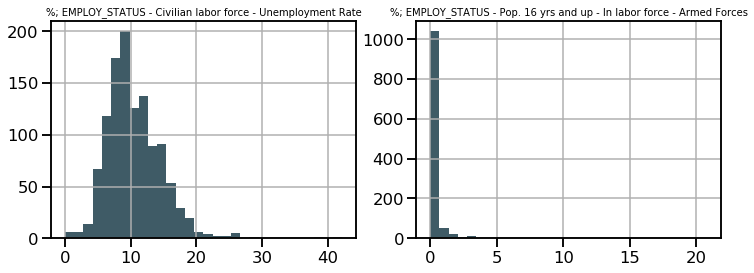

<IPython.core.display.Javascript object>

In [429]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

hist_plot(
    df_state_info_gs_census,
    "%; EMPLOY_STATUS - Civilian labor force - Unemployment Rate",
    ax1,
)

hist_plot(
    df_state_info_gs_census,
    "%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Armed Forces",
    ax2,
)

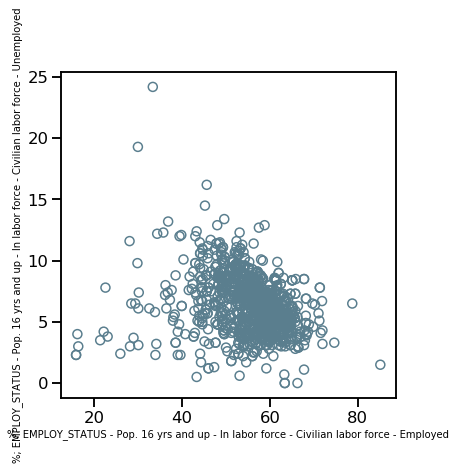

<IPython.core.display.Javascript object>

In [427]:
# Note - I don't entirely understand why
# "In labor force - Civilian labor force - Employed and Civilian labor force" and "Unemployment Rate" are not anti-correlated
# I'll keep only the latter

f, (ax1) = plt.subplots(1, 1, figsize=(6, 6))
scatter_plot_open_circles(
    df_state_info_gs_census,
    "%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Civilian labor force - Employed",
    "%; EMPLOY_STATUS - Pop. 16 yrs and up - In labor force - Civilian labor force - Unemployed",
    ax1,
)

In [433]:
col_census_pct_employstatus_final = [
    "%; EMPLOY_STATUS - Pop. 16 yrs and up - Not in labor force",
    "%; EMPLOY_STATUS - Civilian labor force - Unemployment Rate",
    "%; EMPLOY_STATUS - Females 16 yrs and up - In labor force - Civilian labor force - Employed",
    "%; EMPLOY_STATUS - Own children of the householder 6 to 17 yrs - All parents in family in labor force",
]

<IPython.core.display.Javascript object>

In [434]:
df_state_info_gs_census[col_census_pct_employstatus_final].corr(method="pearson")

,%; EMPLOY_STATUS - Pop. 16 yrs and up - Not in labor force,%; EMPLOY_STATUS - Civilian labor force - Unemployment Rate,%; EMPLOY_STATUS - Females 16 yrs and up - In labor force - Civilian labor force - Employed,%; EMPLOY_STATUS - Own children of the householder 6 to 17 yrs - All parents in family in labor force
%; EMPLOY_STATUS - Pop. 16 yrs and up - Not in labor force,1.000000,0.333101,-0.763717,-0.337010
%; EMPLOY_STATUS - Civilian labor force - Unemployment Rate,0.333101,1.000000,-0.570974,-0.190993
%; EMPLOY_STATUS - Females 16 yrs and up - In labor force - Civilian labor force - Employed,-0.763717,-0.570974,1.000000,0.490307
%; EMPLOY_STATUS - Own children of the householder 6 to 17 yrs - All parents in family in labor force,-0.337010,-0.190993,0.490307,1.000000


<IPython.core.display.Javascript object>

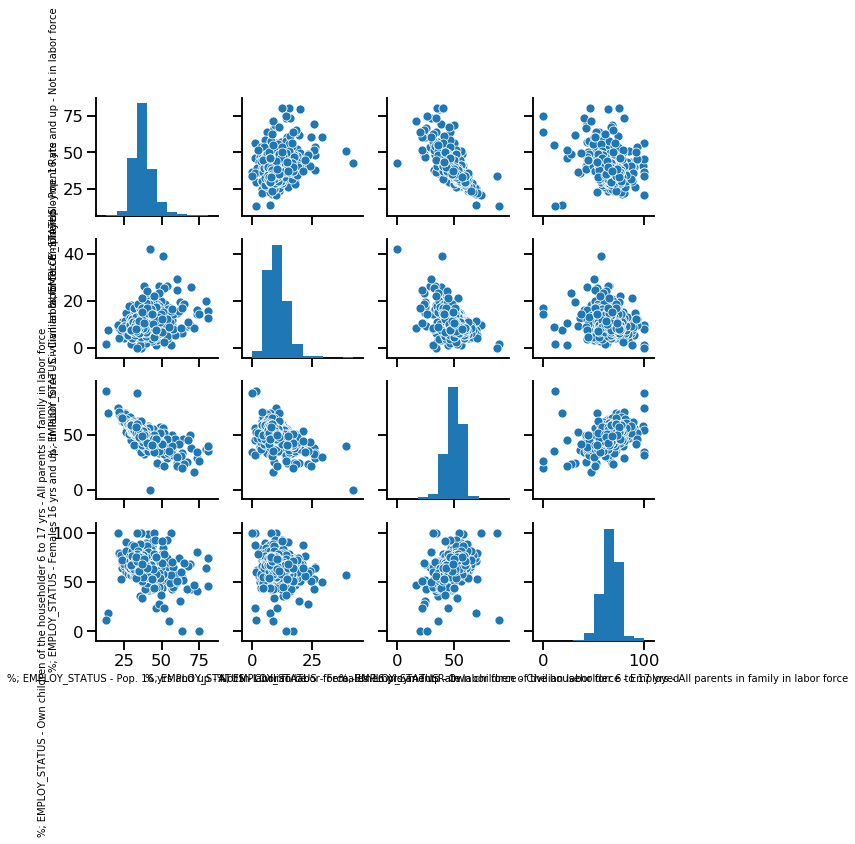

<IPython.core.display.Javascript object>

In [435]:
sns.pairplot(df_state_info_gs_census[col_census_pct_employstatus_final])

#### Percentage of families below poverty line columns

In [436]:
col_census_pct_povertyline = col_census_pct[
    df_state_info_gs_census[col_census_pct].columns.str.contains(
        "AGE_FAMILIES_INCOME_BELOW_POVERTY"
    )
].tolist()

df_state_info_gs_census[col_census_pct_povertyline].corr(method="pearson")

,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - All families,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - All families - w/ related children of the householder <18 yrs,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - Married couple families,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - Married couple families - w/ related children of the householder <18 yrs,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - All people,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - Under 18 yrs,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - Under 18 yrs - Related children of the householder <18 yrs,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - Under 18 yrs - Related children of the householder <18 yrs - Related children of the householder 5 to 17 yrs,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - 18 yrs and up,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - 18-64 yrs,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - 65 yrs and up,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - 65 yrs and up - People in families,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - 65 yrs and up - Unrelated individuals 15 yrs and up
%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - All families,1.000000,0.954137,0.926511,0.873690,0.938880,0.937910,0.938793,0.909696,0.888291,0.863695,0.665770,0.985584,0.665761
%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - All families - w/ related children of the householder <18 yrs,0.954137,1.000000,0.862861,0.889190,0.924765,0.976169,0.976855,0.935318,0.863638,0.860427,0.598186,0.962573,0.636493
%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - Married couple families,0.926511,0.862861,1.000000,0.929360,0.883640,0.873200,0.875453,0.873852,0.838648,0.802205,0.694139,0.927728,0.646620
%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - Married couple families - w/ related children of the householder <18 yrs,0.873690,0.889190,0.929360,1.000000,0.858592,0.897362,0.900181,0.896312,0.800083,0.788392,0.593411,0.905739,0.603573
%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - All people,0.938880,0.924765,0.883640,0.858592,1.000000,0.931017,0.929077,0.913223,0.982513,0.970192,0.652274,0.952240,0.774758
%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - Under 18 yrs,0.937910,0.976169,0.873200,0.897362,0.931017,1.000000,0.999361,0.974867,0.857546,0.847453,0.601294,0.967610,0.645443
%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - Under 18 yrs - Related children of the householder <18 yrs,0.938793,0.976855,0.875453,0.900181,0.929077,0.999361,1.000000,0.975530,0.855046,0.844835,0.603596,0.968728,0.640694
%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - Under 18 yrs - Related children of the householder <18 yrs - Related children of the householder 5 to 17 yrs,0.909696,0.935318,0.873852,0.896312,0.913223,0.974867,0.975530,1.000000,0.842408,0.824887,0.622359,0.946449,0.631928
%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - 18 yrs and up,0.888291,0.863638,0.838648,0.800083,0.982513,0.857546,0.855046,0.842408,1.000000,0.988064,0.660488,0.894300,0.794230
%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - 18-64 yrs,0.863695,0.860427,0.802205,0.788392,0.970192,0.847453,0.844835,0.824887,0.988064,1.000000,0.562505,0.875900,0.792789


<IPython.core.display.Javascript object>

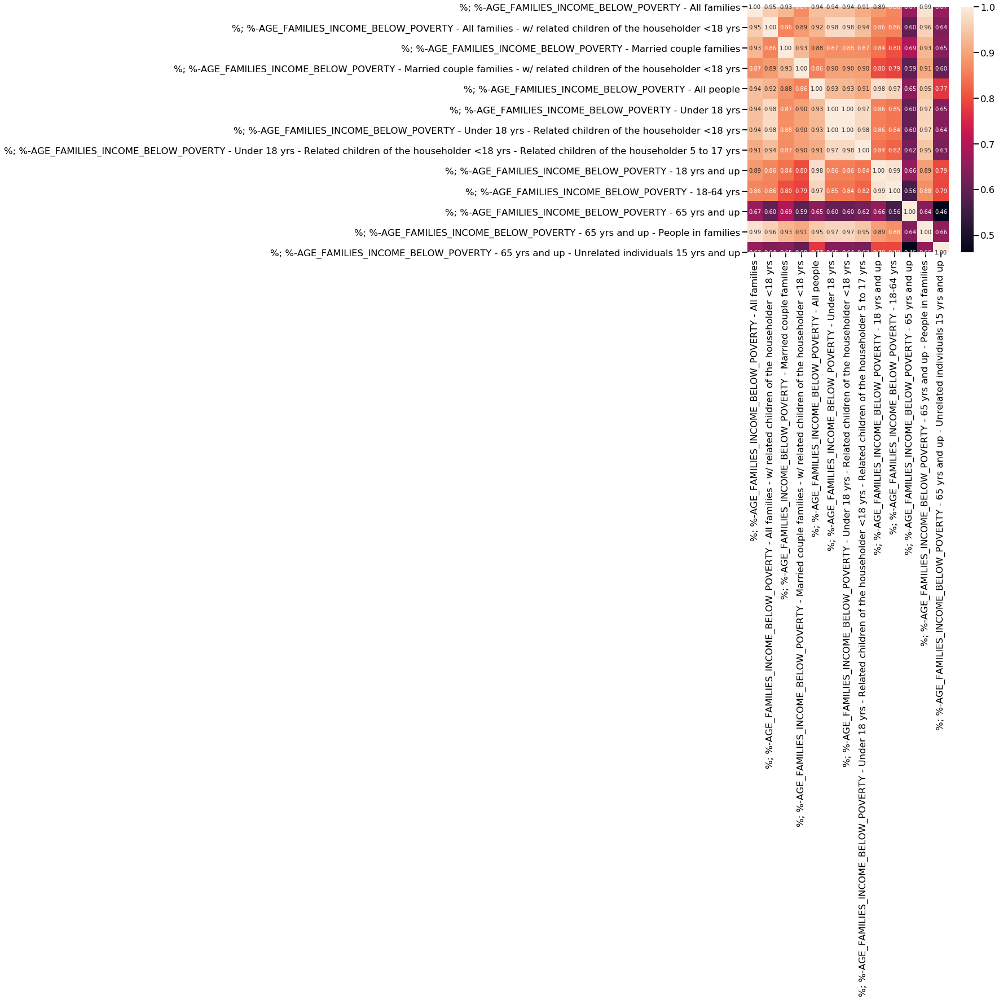

<IPython.core.display.Javascript object>

In [437]:
# Below poverty line columns
fig, ax = plt.subplots(figsize=(8, 8))
sns.heatmap(
    df_state_info_gs_census[col_census_pct_povertyline].corr(method="pearson"),
    annot=True,
    fmt="0.2f",
)

In [439]:
# Just keep this simple - pick one element that's mostly correlated with the others
col_census_pct_povertyline_final = [
    "%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - All families"
]

<IPython.core.display.Javascript object>

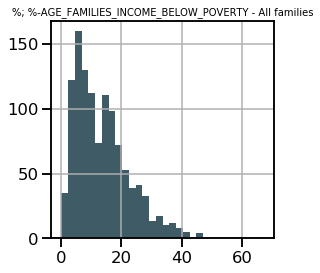

<IPython.core.display.Javascript object>

In [442]:
f, (ax1) = plt.subplots(1, 1, figsize=(4, 4))

hist_plot(
    df_state_info_gs_census,
    "%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - All families",
    ax1,
)



#### Combine final census features, check for other correlations

Before filtering:
- INCOME_BENEFITS - percentage (28 columns) - check for redundant columns and correlated and anti-correlated features
- INCOME_BENEFITS - estimated values - (12 columns) - manually select features
- HEALTH_INS_COVERAGE (17 columns) - manually select columns
- WORK_COMMUTE - adds to 100% (6 columns) - interesting to keep, but drop rare categories
- OCCUPATION - adds to 100% (5 columns) - perhaps drop - may be redundant with industry
- INDUSTRY - adds to 100% (13 columns) - interesting to keep but inspect
- WORKER_CLASS - adds to 100% (4 columns) - OK to keep but inspect
- EMPLOY_STATUS - (12 columns) - OK to keep but inspect
- %-AGE_FAMILIES_INCOME_BELOW_POVERTY (13 columns) - follow up

After filtering:
- INCOME_BENEFITS - percentage (3 columns)
- INCOME_BENEFITS - estimated values - (3 columns)
- HEALTH_INS_COVERAGE (3 columns)
- WORK_COMMUTE - (5 columns)
- OCCUPATION - (0 columns)
- INDUSTRY - (13 columns)
- WORKER_CLASS - (2 columns)
- EMPLOY_STATUS - (4 columns)
- %-AGE_FAMILIES_INCOME_BELOW_POVERTY (1 columns)

In [465]:
print(
    "\n income benefits, percentage - ",
    len(col_census_pct_ib_final),
    "\n income benefits, estimated - ",
    len(col_census_est_ib_final),
    "\n health insurance - ",
    len(col_census_pct_hi_final),
    "\n work commute - ",
    len(col_census_pct_wc_final),
    "\n industry - ",
    len(col_census_pct_industry_final),
    "\n worker class - ",
    len(col_census_pct_workerclass_final),
    "\n employment status - ",
    len(col_census_pct_employstatus_final),
    "\n percent below poverty line - ",
    len(col_census_pct_povertyline_final),
)


 income benefits, percentage -  3 
 income benefits, estimated -  3 
 health insurance -  3 
 work commute -  5 
 industry -  13 
 worker class -  2 
 employment status -  4 
 percent below poverty line -  1


<IPython.core.display.Javascript object>

In [466]:
census_col_final = (
    col_census_pct_ib_final
    + col_census_est_ib_final
    + col_census_pct_hi_final
    + col_census_pct_wc_final
    + col_census_pct_industry_final
    + col_census_pct_workerclass_final
    + col_census_pct_employstatus_final
    + col_census_pct_povertyline_final
)

<IPython.core.display.Javascript object>

In [888]:
col_census_pct_wc_final



['%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- drove alone',
 '%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- carpooled',
 '%; WORK_COMMUTE - Workers 16 yrs and up - Public transportation (excluding taxicab)',
 '%; WORK_COMMUTE - Workers 16 yrs and up - Walked',
 '%; WORK_COMMUTE - Workers 16 yrs and up - Worked at home']

<IPython.core.display.Javascript object>

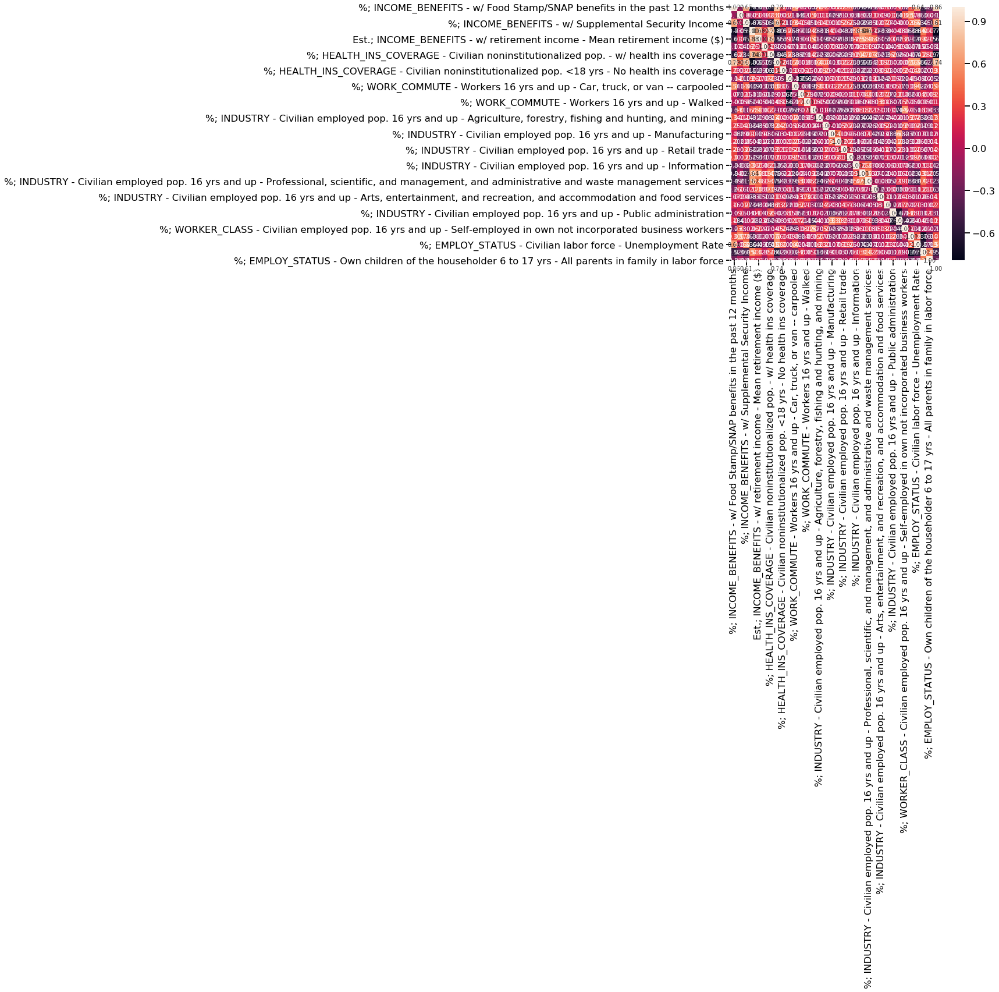

<IPython.core.display.Javascript object>

In [469]:
fig, ax = plt.subplots(figsize=(8, 8))
sns.heatmap(
    df_state_info_gs_census[census_col_final].corr(method="pearson"),
    annot=True,
    fmt="0.2f",
)

In [470]:
df_state_info_gs_census[census_col_final].corr(method="pearson")

,%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefits in the past 12 months,%; INCOME_BENEFITS - w/ Social Security,%; INCOME_BENEFITS - w/ Supplemental Security Income,Est.; INCOME_BENEFITS - Total households - Median household income ($),Est.; INCOME_BENEFITS - w/ retirement income - Mean retirement income ($),Est.; INCOME_BENEFITS - w/ cash public assistance income - Mean cash public assistance income ($),%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage,%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage - w/ public coverage,%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. <18 yrs - No health ins coverage,"%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- drove alone",...,"%; INDUSTRY - Civilian employed pop. 16 yrs and up - Arts, entertainment, and recreation, and accommodation and food services","%; INDUSTRY - Civilian employed pop. 16 yrs and up - Other services, except public administration",%; INDUSTRY - Civilian employed pop. 16 yrs and up - Public administration,%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Private wage and salary workers,%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Self-employed in own not incorporated business workers,%; EMPLOY_STATUS - Pop. 16 yrs and up - Not in labor force,%; EMPLOY_STATUS - Civilian labor force - Unemployment Rate,%; EMPLOY_STATUS - Females 16 yrs and up - In labor force - Civilian labor force - Employed,%; EMPLOY_STATUS - Own children of the householder 6 to 17 yrs - All parents in family in labor force,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - All families
%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefits in the past 12 months,1.000000,-0.099427,0.653882,-0.729109,-0.614616,-0.167118,-0.619386,0.785270,0.234384,-0.144824,...,0.069423,0.163684,-0.090993,0.176016,-0.234750,0.304361,0.641352,-0.524672,-0.276435,0.863977
%; INCOME_BENEFITS - w/ Social Security,-0.099427,1.000000,0.062799,-0.045917,0.144984,0.041529,0.233592,0.376184,0.025823,0.208717,...,0.093868,-0.008892,0.156389,-0.408687,0.331265,0.571346,0.063432,-0.358291,-0.042409,-0.156829
%; INCOME_BENEFITS - w/ Supplemental Security Income,0.653882,0.062799,1.000000,-0.668726,-0.552836,-0.158848,-0.472583,0.692272,0.209045,-0.191171,...,0.071791,0.267682,-0.041353,-0.004280,-0.020921,0.360665,0.527050,-0.445359,-0.175205,0.609095
Est.; INCOME_BENEFITS - Total households - Median household income ($),-0.729109,-0.045917,-0.668726,1.000000,0.678153,0.251763,0.740037,-0.796097,-0.507022,0.258780,...,-0.328565,-0.342622,-0.037376,0.075379,0.062518,-0.380201,-0.637943,0.500448,0.174871,-0.778418
Est.; INCOME_BENEFITS - w/ retirement income - Mean retirement income ($),-0.614616,0.144984,-0.552836,0.678153,1.000000,0.157658,0.669048,-0.554159,-0.389431,0.169459,...,-0.153798,-0.302773,0.138518,-0.233325,0.215287,-0.121804,-0.493916,0.322639,0.153570,-0.632089
Est.; INCOME_BENEFITS - w/ cash public assistance income - Mean cash public assistance income ($),-0.167118,0.041529,-0.158848,0.251763,0.157658,1.000000,0.184730,-0.152103,-0.164433,0.072358,...,-0.108308,-0.044231,-0.086368,0.085013,0.019195,-0.065615,-0.151299,0.051408,-0.077360,-0.162449
%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage,-0.619386,0.233592,-0.472583,0.740037,0.669048,0.184730,1.000000,-0.540853,-0.609231,0.327137,...,-0.212650,-0.358661,0.290064,-0.264410,-0.041072,-0.065481,-0.412128,0.284284,0.187646,-0.728354
%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage - w/ public coverage,0.785270,0.376184,0.692272,-0.796097,-0.554159,-0.152103,-0.540853,1.000000,0.242434,-0.146072,...,0.189111,0.225574,-0.021502,-0.081656,0.053830,0.557709,0.578243,-0.620097,-0.281216,0.741289
%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. <18 yrs - No health ins coverage,0.234384,0.025823,0.209045,-0.507022,-0.389431,-0.164433,-0.609231,0.242434,1.000000,-0.147483,...,0.087036,0.216

<IPython.core.display.Javascript object>

In [468]:
print("No. of census features ", len(census_col_final))

No. of census features  34


<IPython.core.display.Javascript object>

In [471]:
df_state_info_gs_census[census_col_final[0:2]].corr(method="pearson")

,%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefits in the past 12 months,%; INCOME_BENEFITS - w/ Social Security
%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefits in the past 12 months,1.000000,-0.099427
%; INCOME_BENEFITS - w/ Social Security,-0.099427,1.000000


<IPython.core.display.Javascript object>

In [485]:
def melt_corr_df(df_corr):
    df = df_corr.where(np.triu(np.ones(df_corr.shape)).astype(np.bool))
    df = df.stack().reset_index()
    df.columns = ["Row", "Column", "Pearson r"]

    # Remove self-correlated Pearson r
    df = df[df["Pearson r"] != 1].copy()

    return df

<IPython.core.display.Javascript object>

In [495]:
df_corr_melted_census = melt_corr_df(
    df_state_info_gs_census[census_col_final].corr(method="pearson")
)

<IPython.core.display.Javascript object>

In [496]:
df_corr_melted_census.sort_values(by="Pearson r", ascending=False).head(10)

,Row,Column,Pearson r
33,%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefi...,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - All f...,0.863977
7,%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefi...,%; HEALTH_INS_COVERAGE - Civilian noninstituti...,0.785270
243,%; HEALTH_INS_COVERAGE - Civilian noninstituti...,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - All f...,0.741289
102,Est.; INCOME_BENEFITS - Total households - Med...,%; HEALTH_INS_COVERAGE - Civilian noninstituti...,0.740037
72,%; INCOME_BENEFITS - w/ Supplemental Security ...,%; HEALTH_INS_COVERAGE - Civilian noninstituti...,0.692272
100,Est.; INCOME_BENEFITS - Total households - Med...,Est.; INCOME_BENEFITS - w/ retirement income -...,0.678153
132,Est.; INCOME_BENEFITS - w/ retirement income -...,%; HEALTH_INS_COVERAGE - Civilian noninstituti...,0.669048
2,%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefi...,%; INCOME_BENEFITS - w/ Supplemental Security ...,0.653882
30,%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefi...,%; EMPLOY_STATUS - Civilian labor force - Unem...,0.641352
117,Est.; INCOME_BENEFITS - Total households - Med...,%; INDUSTRY - Civilian employed pop. 16 yrs an...,0.636850


<IPython.core.display.Javascript object>

In [497]:
[
    print(i)
    for i in df_corr_melted.sort_values(by="Pearson r", ascending=False)
    .head(10)
    .loc[:, "Column"]
]

%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - All families
%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage - w/ public coverage
%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - All families
%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage
%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage - w/ public coverage
Est.; INCOME_BENEFITS - w/ retirement income - Mean retirement income ($)
%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage
%; INCOME_BENEFITS - w/ Supplemental Security Income
%; EMPLOY_STATUS - Civilian labor force - Unemployment Rate
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Finance and insurance, and real estate and rental and leasing


[None, None, None, None, None, None, None, None, None, None]

<IPython.core.display.Javascript object>

In [498]:
df_corr_melted_census.sort_values(by="Pearson r", ascending=False).tail(10)

,Row,Column,Pearson r
159,Est.; INCOME_BENEFITS - w/ retirement income -...,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - All f...,-0.632089
126,Est.; INCOME_BENEFITS - Total households - Med...,%; EMPLOY_STATUS - Civilian labor force - Unem...,-0.637943
68,%; INCOME_BENEFITS - w/ Supplemental Security ...,Est.; INCOME_BENEFITS - Total households - Med...,-0.668726
560,%; INDUSTRY - Civilian employed pop. 16 yrs an...,%; WORKER_CLASS - Civilian employed pop. 16 yr...,-0.674441
216,%; HEALTH_INS_COVERAGE - Civilian noninstituti...,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - All f...,-0.728354
3,%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefi...,Est.; INCOME_BENEFITS - Total households - Med...,-0.729109
272,"%; WORK_COMMUTE - Workers 16 yrs and up - Car,...",%; WORK_COMMUTE - Workers 16 yrs and up - Publ...,-0.748350
582,%; EMPLOY_STATUS - Pop. 16 yrs and up - Not in...,%; EMPLOY_STATUS - Females 16 yrs and up - In ...,-0.763717
129,Est.; INCOME_BENEFITS - Total households - Med...,%; %-AGE_FAMILIES_INCOME_BELOW_POVERTY - All f...,-0.778418
103,Est.; INCOME_BENEFITS - Total households - Med...,%; HEALTH_INS_COVERAGE - Civilian noninstituti...,-0.796097


<IPython.core.display.Javascript object>

In [499]:
# I'll drop the poverty line element since it correlates with % of families with food stamps and it's not actionable
census_col_final_filt = (
    col_census_pct_ib_final
    + col_census_est_ib_final
    + col_census_pct_hi_final
    + col_census_pct_wc_final
    + col_census_pct_industry_final
    + col_census_pct_workerclass_final
    + col_census_pct_employstatus_final
)

<IPython.core.display.Javascript object>

In [500]:
len(census_col_final_filt)

33

<IPython.core.display.Javascript object>

### Update features - focus on actionable features

In [535]:
all_features_filt_wcensuscheck = census_col_final_filt + [
    "pct_LI_students",
    "Magnet_cat_encoded",
    "Charter_cat_encoded",
    "college_readiness",
    "students_per_teacher",
    "students_per_counselor",
    "pct_teachers_3years_or_more",
    "pct_teachers_who_r_certified",
    "avg_teacher_salary",
    "test_score_rating_LIstudents",
    "test_score_rating_notLIstudents",
    "test_scores_english_LIstudents",
    "test_scores_math_LIstudents",
    "test_scores_math_LIstudents_n_students",
    "graduation_rates_gradRates_eligibility_allStudents",
    "graduation_rates_gradRates_eligibility_LIstudents",
    "graduation_rates_UCCSU_eligibility_allStudents",
    "graduation_rates_UCCSU_eligibility_LIstudents",
]

<IPython.core.display.Javascript object>

In [892]:
len(all_features_filt_wcensuscheck)

51

<IPython.core.display.Javascript object>

In [536]:
df_state_info_gs_census_corr = melt_corr_df(
    df_state_info_gs_census[all_features_filt_wcensuscheck].corr(method="pearson")
)

<IPython.core.display.Javascript object>

In [537]:
df_state_info_gs_census_corr.sort_values(by="Pearson r", ascending=False).head(20)

,Row,Column,Pearson r
1282,test_score_rating_LIstudents,test_score_rating_notLIstudents,0.985217
1317,graduation_rates_gradRates_eligibility_allStud...,graduation_rates_gradRates_eligibility_LIstudents,0.984875
1324,graduation_rates_UCCSU_eligibility_allStudents,graduation_rates_UCCSU_eligibility_LIstudents,0.926377
7,%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefi...,%; HEALTH_INS_COVERAGE - Civilian noninstituti...,0.785270
1299,test_scores_english_LIstudents,test_scores_math_LIstudents,0.763117
153,Est.; INCOME_BENEFITS - Total households - Med...,%; HEALTH_INS_COVERAGE - Civilian noninstituti...,0.740037
106,%; INCOME_BENEFITS - w/ Supplemental Security ...,%; HEALTH_INS_COVERAGE - Civilian noninstituti...,0.692272
151,Est.; INCOME_BENEFITS - Total households - Med...,Est.; INCOME_BENEFITS - w/ retirement income -...,0.678153
200,Est.; INCOME_BENEFITS - w/ retirement income -...,%; HEALTH_INS_COVERAGE - Civilian noninstituti...,0.669048
33,%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefi...,pct_LI_students,0.663581


<IPython.core.display.Javascript object>

In [538]:
df_state_info_gs_census_corr.sort_values(by="Pearson r", ascending=False).tail(20)

,Row,Column,Pearson r
350,%; HEALTH_INS_COVERAGE - Civilian noninstituti...,%; INDUSTRY - Civilian employed pop. 16 yrs an...,-0.560158
1096,%; EMPLOY_STATUS - Civilian labor force - Unem...,%; EMPLOY_STATUS - Females 16 yrs and up - In ...,-0.570974
36,%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefi...,college_readiness,-0.585722
293,%; HEALTH_INS_COVERAGE - Civilian noninstituti...,%; HEALTH_INS_COVERAGE - Civilian noninstituti...,-0.609231
4,%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefi...,Est.; INCOME_BENEFITS - w/ retirement income -...,-0.614616
6,%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefi...,%; HEALTH_INS_COVERAGE - Civilian noninstituti...,-0.619386
360,%; HEALTH_INS_COVERAGE - Civilian noninstituti...,%; EMPLOY_STATUS - Females 16 yrs and up - In ...,-0.620097
426,"%; WORK_COMMUTE - Workers 16 yrs and up - Car,...",%; WORK_COMMUTE - Workers 16 yrs and up - Walked,-0.621511
227,Est.; INCOME_BENEFITS - w/ retirement income -...,pct_LI_students,-0.621814
177,Est.; INCOME_BENEFITS - Total households - Med...,%; EMPLOY_STATUS - Civilian labor force - Unem...,-0.637943


<IPython.core.display.Javascript object>

In [541]:
# Look at what correlated best with the target

bool_target = df_state_info_gs_census_corr["Row"].str.contains(
    "graduation_rates_UCCSU_eligibility_LIstudents"
) | df_state_info_gs_census_corr["Column"].str.contains(
    "graduation_rates_UCCSU_eligibility_LIstudents"
)

df_state_info_gs_census_corr_target = (
    df_state_info_gs_census_corr.loc[bool_target, :]
    .sort_values(by="Pearson r", ascending=False)
    .copy()
)

<IPython.core.display.Javascript object>

In [542]:
df_state_info_gs_census_corr_target

,Row,Column,Pearson r
1324,graduation_rates_UCCSU_eligibility_allStudents,graduation_rates_UCCSU_eligibility_LIstudents,0.926377
1205,Charter_cat_encoded,graduation_rates_UCCSU_eligibility_LIstudents,0.488653
545,%; WORK_COMMUTE - Workers 16 yrs and up - Publ...,graduation_rates_UCCSU_eligibility_LIstudents,0.389259
1304,test_scores_english_LIstudents,graduation_rates_UCCSU_eligibility_LIstudents,0.388377
1310,test_scores_math_LIstudents,graduation_rates_UCCSU_eligibility_LIstudents,0.378830
919,%; INDUSTRY - Civilian employed pop. 16 yrs an...,graduation_rates_UCCSU_eligibility_LIstudents,0.260068
860,%; INDUSTRY - Civilian employed pop. 16 yrs an...,graduation_rates_UCCSU_eligibility_LIstudents,0.248058
1049,%; WORKER_CLASS - Civilian employed pop. 16 yr...,graduation_rates_UCCSU_eligibility_LIstudents,0.227108
1135,%; EMPLOY_STATUS - Females 16 yrs and up - In ...,graduation_rates_UCCSU_eligibility_LIstudents,0.191105
730,%; INDUSTRY - Civilian employed pop. 16 yrs an...,graduation_rates_UCCSU_eligibility_LIstudents,0.139005


<IPython.core.display.Javascript object>

## Exploratory data analysis

In [865]:
[print(i) for i in df_state_info_gs_census.columns]

Unnamed: 0
CDSCode
NCESDist
NCESSchool
StatusType
County
District
School
Street
StreetAbr
City
Zip
State
MailStreet
MailStrAbr
MailCity
MailZip
MailState
Phone
Ext
WebSite
OpenDate
ClosedDate
Charter
CharterNum
FundingType
DOC
DOCType
SOC
SOCType
EdOpsCode
EdOpsName
EILCode
EILName
GSoffered
GSserved
Virtual
Magnet
YearRoundYN
FederalDFCDistrictID
Latitude
Longitude
AdmFName1
AdmLName1
AdmEmail1
AdmFName2
AdmLName2
AdmEmail2
AdmFName3
AdmLName3
AdmEmail3
LastUpDate
zip_code
gsId
name
type
gradeRange
enrollment
gsRating
parentRating
city
state
districtId
district
districtNCESId
address
phone
fax
website
ncesId
lat
lon
overviewLink
ratingsLink
reviewsLink
schoolStatsLink
college_readiness
test_scores
advanced_courses
equity_overview
race_ethnicity
low_income
disabilities
students_per_teacher
students_per_counselor
pct_teachers_3years_or_more
pct_teachers_who_r_certified
avg_teacher_salary
test_score_rating_allStudents
test_score_rating_LIstudents
test_score_rating_notLIstudents
test_scor

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,

<IPython.core.display.Javascript object>

In [868]:
df_state_info_gs_census["enrollment"].quantile([0.1, 0.2, 0.5, 0.75, 1])

0.10     214.0
0.20     435.0
0.50    1409.0
0.75    2100.5
1.00    4794.0
Name: enrollment, dtype: float64

<IPython.core.display.Javascript object>

In [881]:
df_state_info_gs_census["SOCType"].value_counts()

High Schools (Public)                 1146
County Community                         3
Special Education Schools (Public)       2
Continuation High Schools                1
Name: SOCType, dtype: int64

<IPython.core.display.Javascript object>

In [880]:
df_state_info_gs_census.sort_values(by="enrollment")[
    [
        "School",
        "SOCType",
        "pct_LI_students",
        "enrollment",
        "graduation_rates_UCCSU_eligibility_LIstudents",
    ]
].head(50)

,School,SOCType,pct_LI_students,enrollment,graduation_rates_UCCSU_eligibility_LIstudents
475,Yosemite Park High,High Schools (Public),NaN,1.0,NaN
1112,Cold Springs High,High Schools (Public),NaN,4.0,NaN
190,Clear Passage Educational Center,High Schools (Public),NaN,4.0,NaN
1111,South Fork High,High Schools (Public),NaN,4.0,NaN
132,Mattole Triple Junction High,High Schools (Public),NaN,9.0,NaN
488,Whale Gulch High,High Schools (Public),NaN,9.0,NaN
489,Leggett Valley High,High Schools (Public),NaN,14.0,NaN
146,Death Valley High Academy,High Schools (Public),NaN,17.0,NaN
462,Mountain Oaks High,High Schools (Public),NaN,18.0,NaN
1013,Downieville Junior-Senior High,High Schools (Public),NaN,20.0,NaN


<IPython.core.display.Javascript object>

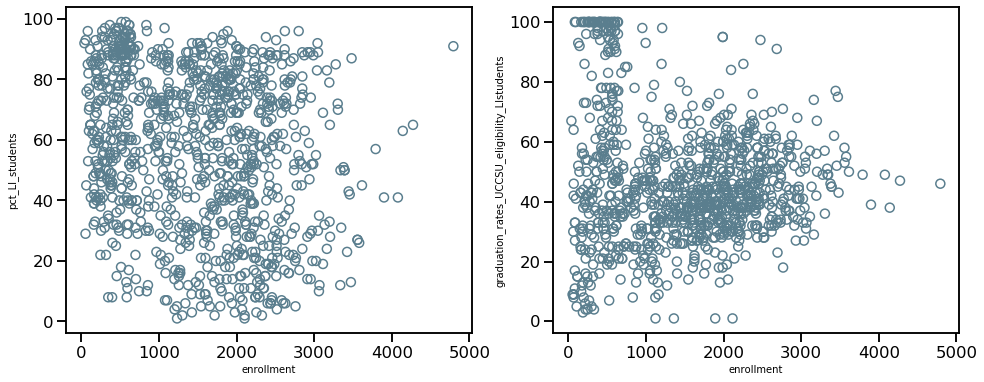

<IPython.core.display.Javascript object>

In [877]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
scatter_plot_open_circles(df_state_info_gs_census, "enrollment", "pct_LI_students", ax1)

scatter_plot_open_circles(
    df_state_info_gs_census,
    "enrollment",
    "graduation_rates_UCCSU_eligibility_LIstudents",
    ax2,
)

### Most correlated features

In [726]:
df_state_info_gs_census[
    "graduation_rates_UCCSU_eligibility_allStudents"
] * df_state_info_gs_census["pct_LI_students"] / 100

0       67.00
1       11.88
2         NaN
3       80.00
4       10.71
        ...  
1147    26.46
1148    26.04
1149    29.48
1150    20.46
1151    19.24
Length: 1152, dtype: float64

<IPython.core.display.Javascript object>

In [728]:
df_state_info_gs_census["graduation_rates_UCCSU_eligibility_LIstudents"]

0       100.0
1        50.0
2       100.0
3       100.0
4        45.0
        ...  
1147     38.0
1148     30.0
1149     72.0
1150     29.0
1151     51.0
Name: graduation_rates_UCCSU_eligibility_LIstudents, Length: 1152, dtype: float64

<IPython.core.display.Javascript object>

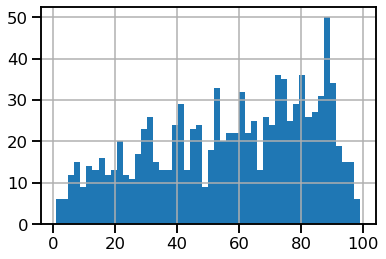

<IPython.core.display.Javascript object>

In [736]:
df_state_info_gs_census["pct_LI_students"].hist(bins=50)

''

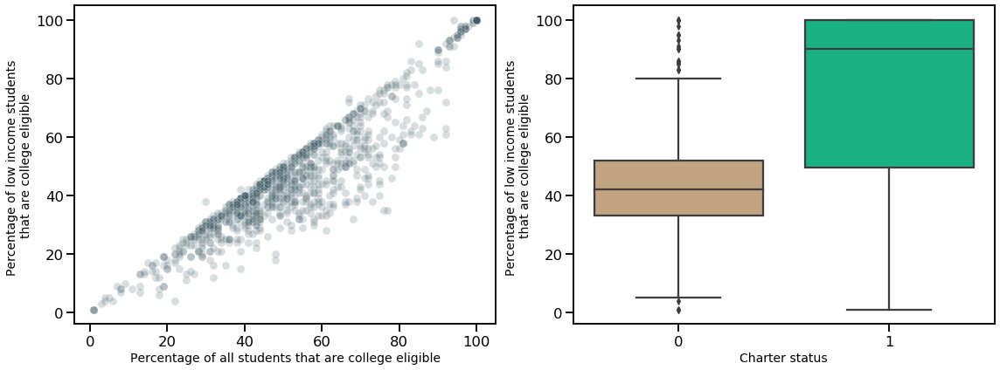

<IPython.core.display.Javascript object>

In [897]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
# scatter_plot_open_circles(
#     df_state_info_gs_census,
#     "graduation_rates_UCCSU_eligibility_allStudents",
#     "graduation_rates_UCCSU_eligibility_LIstudents",
#     ax1,
# )

sns.scatterplot(
    data=df_state_info_gs_census,
    x="graduation_rates_UCCSU_eligibility_allStudents",
    y="graduation_rates_UCCSU_eligibility_LIstudents",
    ax=ax1,
    alpha=0.2,
    color=B_slate,
    legend=False,
)
ax1.set_xlabel("Percentage of all students that are college eligible", fontsize=14)
ax1.set_ylabel(
    "Percentage of low income students \nthat are college eligible", fontsize=14
)


sns.boxplot(
    data=df_state_info_gs_census,
    x="Charter_cat_encoded",
    y="graduation_rates_UCCSU_eligibility_LIstudents",
    palette=[B_beige, B_green],
)
ax2.set_xlabel("Charter status", fontsize=14)
ax2.set_ylabel(
    "Percentage of low income students \nthat are college eligible", fontsize=14
)
plt.tight_layout()
;

In [628]:
df_state_info_gs_census["Charter_cat_encoded"].sum()

208

<IPython.core.display.Javascript object>

### Distribution of target

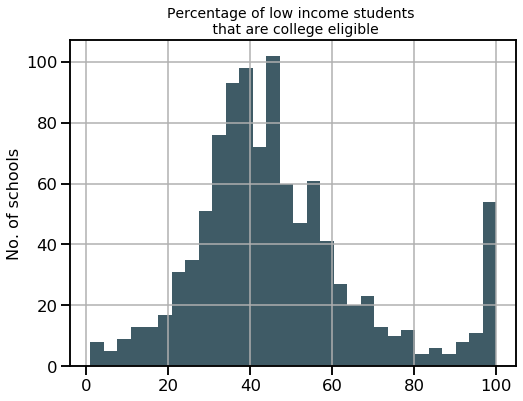

<IPython.core.display.Javascript object>

In [751]:
f, ax1 = plt.subplots(figsize=(8,6))
hist_plot(df_state_info_gs_census, "graduation_rates_UCCSU_eligibility_LIstudents", ax1)
ax1.set_ylabel("No. of schools", fontsize=16)
ax1.set_title("Percentage of low income students \n that are college eligible", fontsize=14);


mean:  46.7021484375
mean +/- 1SD:  25.971879691038332 67.43241718396166
mean + 2SD:  5.241610944576664 88.16268593042334


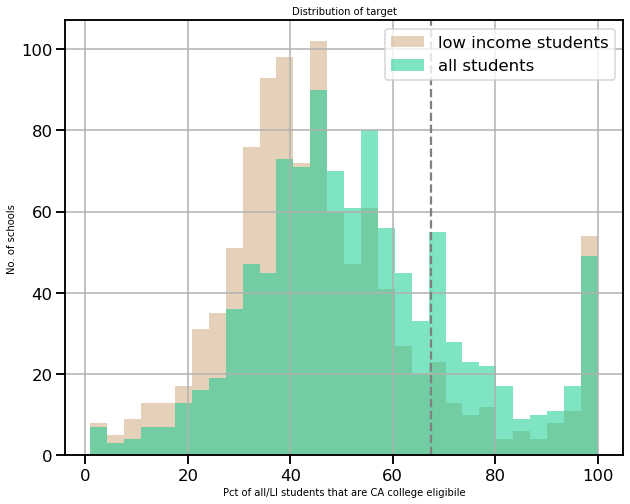

<IPython.core.display.Javascript object>

In [556]:
f, ax1 = plt.subplots(figsize=(10, 8))
df_state_info_gs_census["graduation_rates_UCCSU_eligibility_LIstudents"].hist(
    bins=30, ax=ax1, color=B_beige, alpha=0.5, label="low income students"
)
# df_state_info_gs_census["graduation_rates_UCCSU_eligibility_allStudents"].hist(
#     bins=30, ax=ax1, color=B_green, alpha=0.5, label="all students"
# )


ax1.axvline(67.4, c="gray", linestyle="dashed")
ax1.set_title("Distribution of target")
ax1.set_xlabel("Pct of all/LI students that are CA college eligibile")
ax1.set_ylabel("No. of schools")
ax1.legend()

target = df_state_info_gs_census["graduation_rates_UCCSU_eligibility_LIstudents"]
target_mean = target.mean()
target_sd = target.std()

print("mean: ", target_mean)
print("mean +/- 1SD: ", target_mean - target_sd, target_mean + target_sd)
print("mean + 2SD: ", target_mean - 2 * target_sd, target_mean + 2 * target_sd)

## RF regression, target as the percentage of low income students that are college eligble

In [566]:
from sklearn.ensemble import RandomForestRegressor

<IPython.core.display.Javascript object>

In [604]:
def get_split_data(X, y, testsize):

    # Keep rows only if there are no null values for that feature and target
    k_rows2keep = pd.merge(X, y, left_index=True, right_index=True).notnull().sum(
        axis=1
    ) == (X.shape[1] + 1)
    print(
        "No. of total schools before splitting (no null values for feature set or target): ",
        sum(k_rows2keep),
    )

    X = X.loc[k_rows2keep, :].copy()
    y = y[k_rows2keep].copy()

    # Split data between train and test_and_holdout
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=testsize, random_state=19
    )

    return X_train, X_test, y_train, y_test

<IPython.core.display.Javascript object>

In [656]:
def run_randomforest_v0(X_train, y_train, X_test, y_test):
    # Instantiate model with 100 decision trees
    rf = RandomForestRegressor(n_estimators=100, random_state=19)
    rf.fit(X_train, y_train)
    y_pred = rf.predict(X_test)
    df_eval = pd.DataFrame({"test": y_test, "pred": y_pred})

    return rf, df_eval

<IPython.core.display.Javascript object>

In [657]:
all_features_filt_wcensuscheck_notarget = all_features_filt_wcensuscheck[:-2].copy()
target = "graduation_rates_UCCSU_eligibility_LIstudents"

<IPython.core.display.Javascript object>

In [658]:
X_rf = df_state_info_gs_census[all_features_filt_wcensuscheck_notarget].copy()
y_rf = df_state_info_gs_census[target].copy()

<IPython.core.display.Javascript object>

In [659]:
X_train_rf, X_test_rf, y_train_rf, y_test_rf = get_split_data(X_rf, y_rf, 0.4)

No. of total schools before splitting (no null values for feature set or target):  825


<IPython.core.display.Javascript object>

In [891]:
X_train_rf.shape

(495, 49)

<IPython.core.display.Javascript object>

In [660]:
rf_v0, df_eval_v0 = run_randomforest_v0(X_train_rf, y_train_rf, X_test_rf, y_test_rf)

<IPython.core.display.Javascript object>

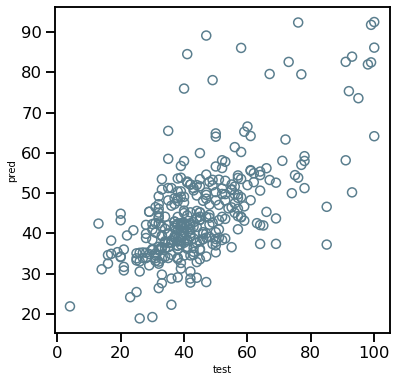

<IPython.core.display.Javascript object>

In [661]:
f, (ax1) = plt.subplots(1, 1, figsize=(6, 6))
scatter_plot_open_circles(df_eval_v0, "test", "pred", ax1)

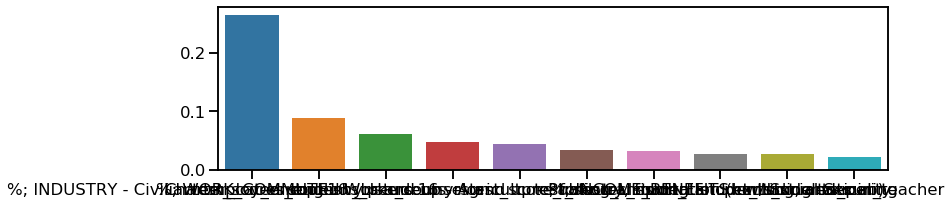

<IPython.core.display.Javascript object>

In [662]:
# Show most important features
features = X_train_rf.columns.tolist()
feature_imp = pd.Series(rf_v0.feature_importances_, index=features).sort_values(ascending=False)

# Creating a bar plot
plt.figure(figsize=(12,3))
ax = sns.barplot(y=feature_imp[0:10], x=feature_imp.index[0:10])
ax.xtick_labels


In [663]:
# Top 10
feature_imp[0:10]

Charter_cat_encoded                                                                                            0.264666
test_scores_english_LIstudents                                                                                 0.089539
students_per_counselor                                                                                         0.060808
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Agriculture, forestry, fishing and hunting, and mining    0.048641
%; WORK_COMMUTE - Workers 16 yrs and up - Public transportation (excluding taxicab)                            0.043851
test_score_rating_LIstudents                                                                                   0.034672
test_scores_math_LIstudents                                                                                    0.032194
%; INCOME_BENEFITS - w/ Social Security                                                                        0.027822
pct_LI_students                         

<IPython.core.display.Javascript object>

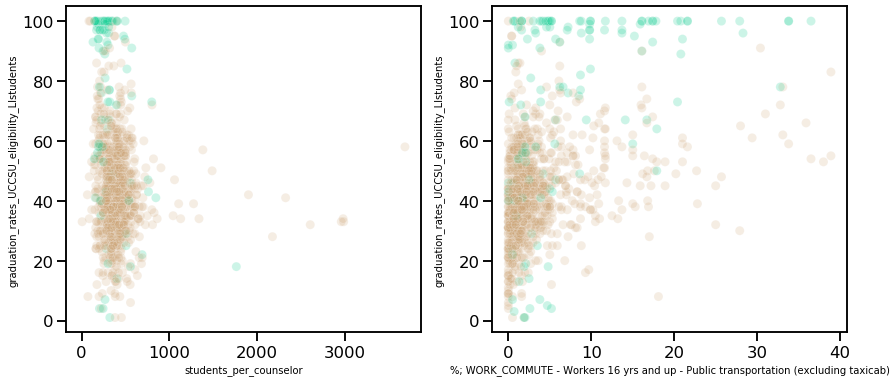

<IPython.core.display.Javascript object>

In [670]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))
sns.scatterplot(
    data=df_state_info_gs_census,
    x="students_per_counselor",
    y="graduation_rates_UCCSU_eligibility_LIstudents",
    hue="Charter_cat_encoded",
    palette=[B_beige, B_green],
    ax=ax1,
    alpha=0.2,
    legend=False,
)

sns.scatterplot(
    data=df_state_info_gs_census,
    x="%; WORK_COMMUTE - Workers 16 yrs and up - Public transportation (excluding taxicab)",
    y="graduation_rates_UCCSU_eligibility_LIstudents",
    hue="Charter_cat_encoded",
    palette=[B_beige, B_green],
    ax=ax2,
    alpha=0.2,
    legend=False,
)

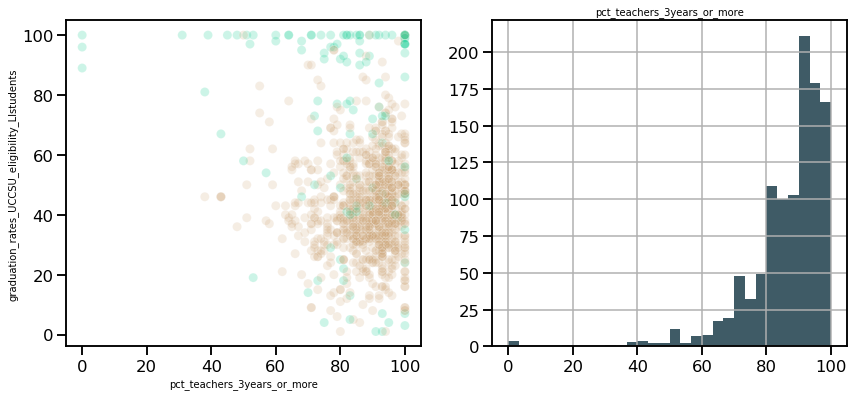

<IPython.core.display.Javascript object>

In [676]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))
sns.scatterplot(
    data=df_state_info_gs_census,
    x="pct_teachers_3years_or_more",
    y="graduation_rates_UCCSU_eligibility_LIstudents",
    hue="Charter_cat_encoded",
    palette=[B_beige, B_green],
    ax=ax1,
    alpha=0.2,
    legend=False,
)

hist_plot(df_state_info_gs_census, "pct_teachers_3years_or_more", ax=ax2)

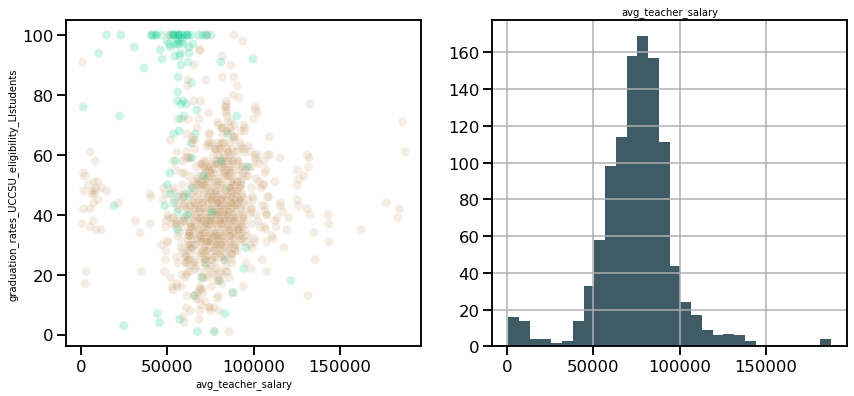

<IPython.core.display.Javascript object>

In [680]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))
sns.scatterplot(
    data=df_state_info_gs_census,
    x="avg_teacher_salary",
    y="graduation_rates_UCCSU_eligibility_LIstudents",
    hue="Charter_cat_encoded",
    palette=[B_beige, B_green],
    ax=ax1,
    alpha=0.2,
    legend=False,
)

hist_plot(df_state_info_gs_census, "avg_teacher_salary", ax=ax2)

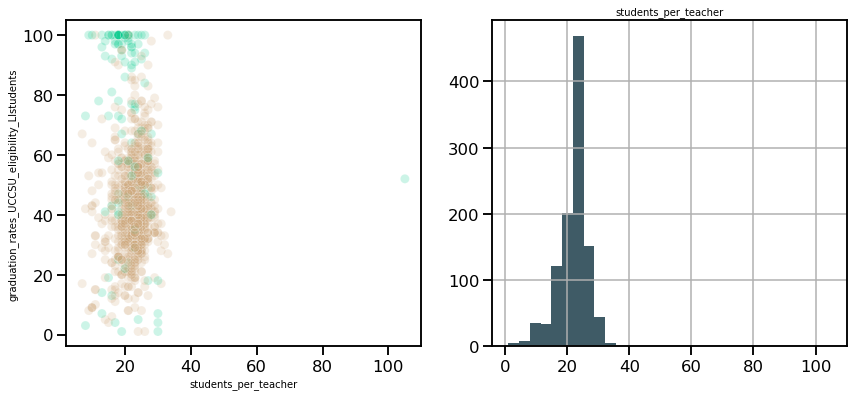

<IPython.core.display.Javascript object>

In [681]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))
sns.scatterplot(
    data=df_state_info_gs_census,
    x="students_per_teacher",
    y="graduation_rates_UCCSU_eligibility_LIstudents",
    hue="Charter_cat_encoded",
    palette=[B_beige, B_green],
    ax=ax1,
    alpha=0.2,
    legend=False,
)

hist_plot(df_state_info_gs_census, "students_per_teacher", ax=ax2)

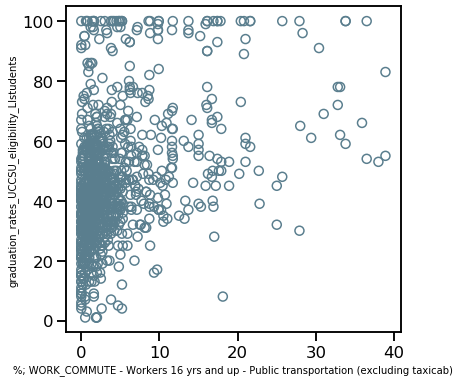

<IPython.core.display.Javascript object>

In [666]:
f, (ax1) = plt.subplots(1, 1, figsize=(6, 6))
scatter_plot_open_circles(
    df_state_info_gs_census,
    "%; WORK_COMMUTE - Workers 16 yrs and up - Public transportation (excluding taxicab)",
    "graduation_rates_UCCSU_eligibility_LIstudents",
    ax1,
)

In [667]:
print("R2 score: ", rf_v0.score(X_test_rf, y_test_rf))

R2 score:  0.43454237447381516


<IPython.core.display.Javascript object>

## RF regression, target as difference between percent low income and percent of all students college eligible

In [685]:
df_state_info_gs_census.loc[:, "graduation_rates_UCCSU_eligibility_LI_all_diff"] = df_state_info_gs_census.loc[:, "graduation_rates_UCCSU_eligibility_LIstudents"] - df_state_info_gs_census.loc[:, "graduation_rates_UCCSU_eligibility_allStudents"]


<IPython.core.display.Javascript object>

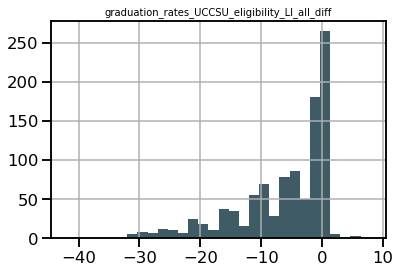

<IPython.core.display.Javascript object>

In [687]:
f, ax1 = plt.subplots()
hist_plot(
    df_state_info_gs_census, "graduation_rates_UCCSU_eligibility_LI_all_diff", ax1
)

In [694]:
target = "graduation_rates_UCCSU_eligibility_LI_all_diff"

<IPython.core.display.Javascript object>

In [695]:
X_rf_v1 = df_state_info_gs_census[all_features_filt_wcensuscheck_notarget].copy()
y_rf_v1 = df_state_info_gs_census[target].copy()

<IPython.core.display.Javascript object>

In [697]:
X_train_rf_v1, X_test_rf_v1, y_train_rf_v1, y_test_rf_v1 = get_split_data(
    X_rf_v1, y_rf_v1, 0.4
)

No. of total schools before splitting (no null values for feature set or target):  825


<IPython.core.display.Javascript object>

In [698]:
rf_v1, df_eval_v1 = run_randomforest_v0(
    X_train_rf_v1, y_train_rf_v1, X_test_rf_v1, y_test_rf_v1
)

<IPython.core.display.Javascript object>

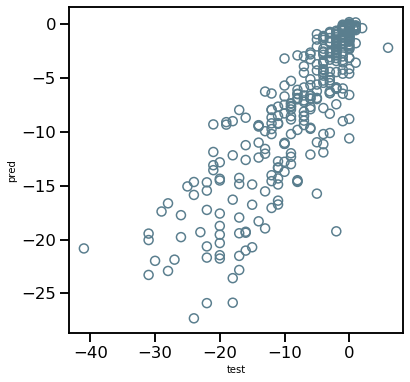

<IPython.core.display.Javascript object>

In [699]:
f, (ax1) = plt.subplots(1, 1, figsize=(6, 6))
scatter_plot_open_circles(df_eval_v1, "test", "pred", ax1)

In [701]:
print("R2 score: ", rf_v1.score(X_test_rf_v1, y_test_rf_v1))

R2 score:  0.7376636998668289


<IPython.core.display.Javascript object>

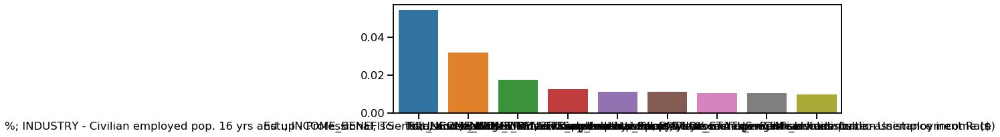

<IPython.core.display.Javascript object>

In [708]:
# Show most important features
features = X_train_rf_v1.columns.tolist()
feature_imp = pd.Series(rf_v1.feature_importances_, index=features).sort_values(
    ascending=False
)

# Creating a bar plot
plt.figure(figsize=(12, 3))
ax = sns.barplot(y=feature_imp[1:10], x=feature_imp.index[1:10])

In [703]:
feature_imp.head(10)

pct_LI_students                                                                                                                                    0.642368
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Professional, scientific, and management, and administrative and waste management services    0.054382
Est.; INCOME_BENEFITS - Total households - Median household income ($)                                                                             0.031948
test_scores_math_LIstudents_n_students                                                                                                             0.017409
%; INCOME_BENEFITS - w/ Supplemental Security Income                                                                                               0.012607
avg_teacher_salary                                                                                                                                 0.011402
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Public admi

<IPython.core.display.Javascript object>

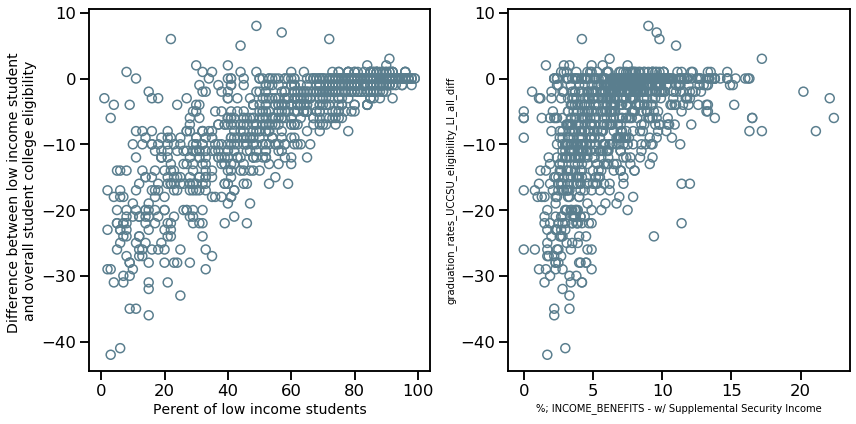

<IPython.core.display.Javascript object>

In [743]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
scatter_plot_open_circles(
    df_state_info_gs_census,
    "pct_LI_students",
    "graduation_rates_UCCSU_eligibility_LI_all_diff",
    ax1,
)
ax1.set_xlabel("Perent of low income students", fontsize=14)
ax1.set_ylabel(
    "Difference between low income student \nand overall student college eligibility",
    fontsize=14,
)


scatter_plot_open_circles(
    df_state_info_gs_census,
    "%; INCOME_BENEFITS - w/ Supplemental Security Income",
    "graduation_rates_UCCSU_eligibility_LI_all_diff",
    ax2,
)

plt.tight_layout()

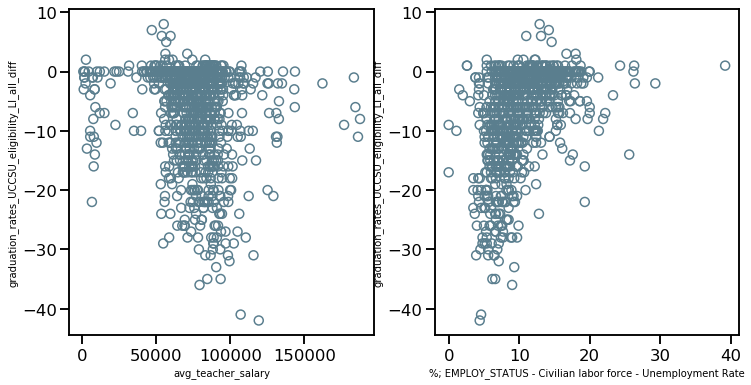

<IPython.core.display.Javascript object>

In [710]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
scatter_plot_open_circles(
    df_state_info_gs_census,
    "avg_teacher_salary",
    "graduation_rates_UCCSU_eligibility_LI_all_diff",
    ax1,
)

scatter_plot_open_circles(
    df_state_info_gs_census,
    "%; EMPLOY_STATUS - Civilian labor force - Unemployment Rate",
    "graduation_rates_UCCSU_eligibility_LI_all_diff",
    ax2,
)

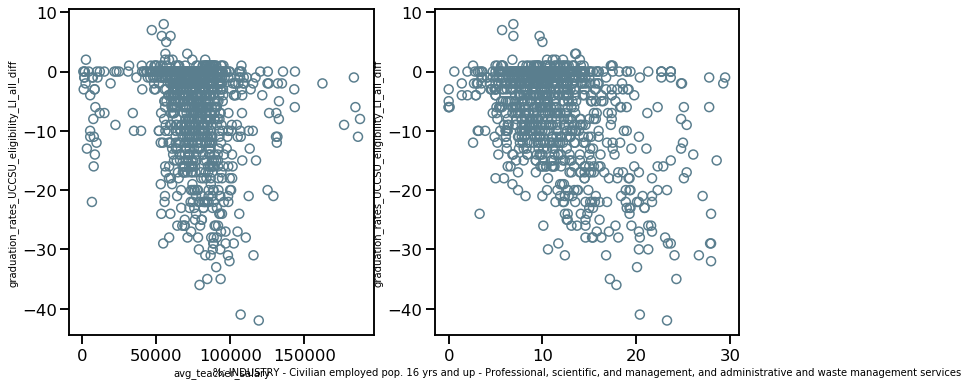

<IPython.core.display.Javascript object>

In [723]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
scatter_plot_open_circles(
    df_state_info_gs_census,
    "avg_teacher_salary",
    "graduation_rates_UCCSU_eligibility_LI_all_diff",
    ax1,
)

scatter_plot_open_circles(
    df_state_info_gs_census,
    "%; INDUSTRY - Civilian employed pop. 16 yrs and up - Professional, scientific, and management, and administrative and waste management services",
    "graduation_rates_UCCSU_eligibility_LI_all_diff",
    ax2,
)

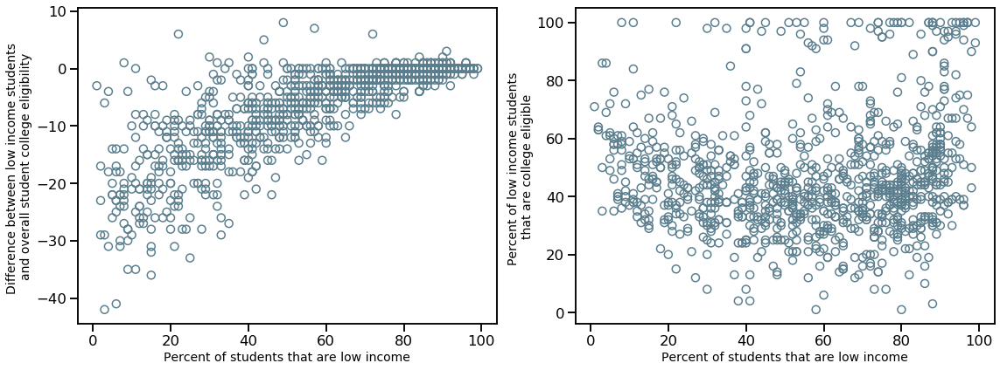

<IPython.core.display.Javascript object>

In [899]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
scatter_plot_open_circles(
    df_state_info_gs_census,
    "pct_LI_students",
    "graduation_rates_UCCSU_eligibility_LI_all_diff",
    ax1,
)
ax1.set_xlabel("Percent of students that are low income", fontsize=14)
ax1.set_ylabel(
    "Difference between low income students \nand overall student college eligibility",
    fontsize=14,
)


scatter_plot_open_circles(
    df_state_info_gs_census,
    "pct_LI_students",
    "graduation_rates_UCCSU_eligibility_LIstudents",
    ax2,
)

ax2.set_xlabel("Percent of students that are low income", fontsize=14)
ax2.set_ylabel(
    "Percent of low income students \nthat are college eligible", fontsize=14,
)
plt.tight_layout()

In [721]:
df_state_info_gs_census.sort_values(
    by="graduation_rates_UCCSU_eligibility_LI_all_diff", ascending=False
).loc[
    :,
    ["School", "City"]
    + all_features_filt_wcensuscheck_notarget
    + ["graduation_rates_UCCSU_eligibility_LIstudents", target],
].head(
    10
)

,School,City,%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefits in the past 12 months,%; INCOME_BENEFITS - w/ Social Security,%; INCOME_BENEFITS - w/ Supplemental Security Income,Est.; INCOME_BENEFITS - Total households - Median household income ($),Est.; INCOME_BENEFITS - w/ retirement income - Mean retirement income ($),Est.; INCOME_BENEFITS - w/ cash public assistance income - Mean cash public assistance income ($),%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage,%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage - w/ public coverage,...,avg_teacher_salary,test_score_rating_LIstudents,test_score_rating_notLIstudents,test_scores_english_LIstudents,test_scores_math_LIstudents,test_scores_math_LIstudents_n_students,graduation_rates_gradRates_eligibility_allStudents,graduation_rates_gradRates_eligibility_LIstudents,graduation_rates_UCCSU_eligibility_LIstudents,graduation_rates_UCCSU_eligibility_LI_all_diff
1009,Fall River Junior-Senior High,McArthur,2.5,42.3,9.0,NaN,NaN,NaN,80.0,35.6,...,55076.0,6.0,NaN,43.0,43.0,54.0,96.0,100.0,38.0,8.0
482,Redwood Academy of Ukiah,Ukiah,14.0,33.8,9.6,44596.0,30849.0,5465.0,87.2,49.5,...,47008.0,10.0,NaN,94.0,71.0,35.0,100.0,100.0,92.0,7.0
174,Lemoore Middle College High,Lemoore,11.1,18.4,4.2,48953.0,28140.0,3735.0,86.0,26.3,...,53762.0,5.0,10.0,69.0,13.0,16.0,95.0,100.0,100.0,6.0
685,New Technology High,Sacramento,16.5,32.4,9.8,45801.0,30934.0,4920.0,87.0,42.9,...,59676.0,2.0,4.0,32.0,12.0,25.0,96.0,94.0,73.0,6.0
1149,Marysville Charter Academy for the Arts,Marysville,19.9,31.2,11.0,44852.0,23725.0,5192.0,85.1,48.0,...,56749.0,8.0,NaN,64.0,40.0,119.0,92.0,96.0,72.0,5.0
1015,Dunsmuir High,Dunsmuir,13.2,48.3,17.2,28241.0,17935.0,4763.0,84.5,59.3,...,70957.0,39.0,39.0,NaN,NaN,NaN,77.0,75.0,42.0,3.0
654,NOVA Academy - Coachella,Coachella,23.0,15.1,6.2,37969.0,12531.0,4474.0,71.2,40.4,...,56200.0,4.0,4.0,42.0,NaN,NaN,91.0,90.0,86.0,3.0
850,High Tech High North County,San Marcos,2.6,31.8,2.9,59778.0,23576.0,3401.0,89.0,25.4,...,56111.0,5.0,8.0,62.0,14.0,21.0,97.0,96.0,98.0,2.0
377,Humanities and Arts (HARTS) Academy of Los Ang...,Harbor City,10.3,29.7,4.9,52294.0,25377.0,4715.0,82.8,36.8,...,74383.0,4.0,7.0,55.0,16.0,87.0,87.0,88.0,63.0,2.0
307,Linda Esperanza Marquez High A Huntington Park...,Huntington Park,19.8,23.4,7.5,35917.0,12985.0,5052.0,70.9,43.2,...,83091.0,7.0,8.0,68.0,28.0,127.0,85.0,88.0,64.0,2.0


<IPython.core.display.Javascript object>

## Statistical analysis, evaluate top and bottom performing schools

In [782]:
def run_mannwhitneyu(df, metric_col, bin_col):
    class0 = sorted(df[bin_col].unique())[0]
    class1 = sorted(df[bin_col].unique())[1]
    x = df.loc[df[bin_col] == class0, metric_col]
    y = df.loc[df[bin_col] == class1, metric_col]
    mwu_statistic, mwu_pval = mannwhitneyu(x, y, use_continuity=True, alternative=None)
    return mwu_pval

<IPython.core.display.Javascript object>

mean:  46.7021484375
mean +/- 1SD:  25.971879691038332 67.43241718396166


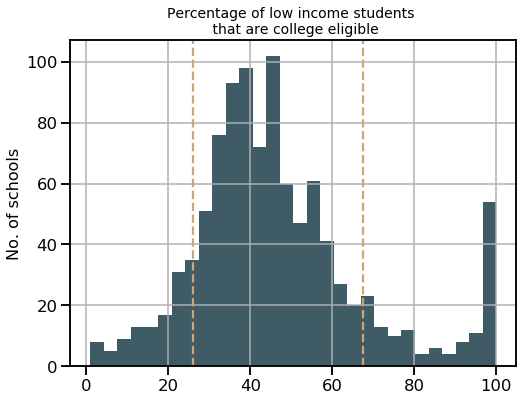

<IPython.core.display.Javascript object>

In [753]:
f, ax1 = plt.subplots(figsize=(8,6))
hist_plot(df_state_info_gs_census, "graduation_rates_UCCSU_eligibility_LIstudents", ax1)
ax1.set_ylabel("No. of schools", fontsize=16)
ax1.set_title("Percentage of low income students \n that are college eligible", fontsize=14);

target = df_state_info_gs_census["graduation_rates_UCCSU_eligibility_LIstudents"]
target_mean = target.mean()
target_sd = target.std()

# or top and bottom quantile

ax1.axvline(target_mean-target_sd, c=B_beige, linestyle="dashed")
ax1.axvline(target_mean+target_sd, c=B_beige, linestyle="dashed")

print("mean: ", target_mean)
print("mean +/- 1SD: ", target_mean - target_sd, target_mean + target_sd);


In [760]:
print(
    "No. of low performing schools: ",
    (
        df_state_info_gs_census["graduation_rates_UCCSU_eligibility_LIstudents"]
        < target_mean - target_sd
    ).sum(),
)

print(
    "No. of high performing schools: ",
    (
        df_state_info_gs_census["graduation_rates_UCCSU_eligibility_LIstudents"]
        > target_mean + target_sd
    ).sum(),
)

No. of low performing schools:  111
No. of high performing schools:  137


<IPython.core.display.Javascript object>

In [764]:
df_state_info_gs_census["LI_performance_status"] = "middle"

bool_low = df_state_info_gs_census["graduation_rates_UCCSU_eligibility_LIstudents"] < (
    target_mean - target_sd
)
df_state_info_gs_census.loc[bool_low, "LI_performance_status"] = "low"

bool_high = df_state_info_gs_census["graduation_rates_UCCSU_eligibility_LIstudents"] > (
    target_mean + target_sd
)
df_state_info_gs_census.loc[bool_high, "LI_performance_status"] = "high"

df_state_info_gs_census["LI_performance_status"].value_counts()

middle    904
high      137
low       111
Name: LI_performance_status, dtype: int64

<IPython.core.display.Javascript object>

In [771]:
feat_for_mw = all_features_filt_wcensuscheck[:-4]
feat_for_mw

['%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefits in the past 12 months',
 '%; INCOME_BENEFITS - w/ Social Security',
 '%; INCOME_BENEFITS - w/ Supplemental Security Income',
 'Est.; INCOME_BENEFITS - Total households - Median household income ($)',
 'Est.; INCOME_BENEFITS - w/ retirement income - Mean retirement income ($)',
 'Est.; INCOME_BENEFITS - w/ cash public assistance income - Mean cash public assistance income ($)',
 '%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage',
 '%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage - w/ public coverage',
 '%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. <18 yrs - No health ins coverage',
 '%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- drove alone',
 '%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- carpooled',
 '%; WORK_COMMUTE - Workers 16 yrs and up - Public transportation (excluding taxicab)',
 '%; WORK_COMMUTE - Workers

<IPython.core.display.Javascript object>

In [774]:
status2keep = ["low", "high"]

df_state_info_gs_census_forMW = df_state_info_gs_census.loc[
    df_state_info_gs_census["LI_performance_status"].isin(status2keep),
    feat_for_mw + ["LI_performance_status"],
].copy()

<IPython.core.display.Javascript object>

In [775]:
df_state_info_gs_census_forMW.head()

,%; INCOME_BENEFITS - w/ Food Stamp/SNAP benefits in the past 12 months,%; INCOME_BENEFITS - w/ Social Security,%; INCOME_BENEFITS - w/ Supplemental Security Income,Est.; INCOME_BENEFITS - Total households - Median household income ($),Est.; INCOME_BENEFITS - w/ retirement income - Mean retirement income ($),Est.; INCOME_BENEFITS - w/ cash public assistance income - Mean cash public assistance income ($),%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage,%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage - w/ public coverage,%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. <18 yrs - No health ins coverage,"%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- drove alone",...,students_per_counselor,pct_teachers_3years_or_more,pct_teachers_who_r_certified,avg_teacher_salary,test_score_rating_LIstudents,test_score_rating_notLIstudents,test_scores_english_LIstudents,test_scores_math_LIstudents,test_scores_math_LIstudents_n_students,LI_performance_status
0,9.2,24.0,16.0,32993.0,29027.0,5055.0,82.2,41.3,4.7,30.5,...,343.0,31.0,100.0,56500.0,4.0,4.0,47.0,18.0,77.0,high
2,28.4,20.0,13.4,31903.0,19269.0,5347.0,80.2,48.5,6.7,59.4,...,147.0,82.0,67.0,41722.0,22.0,22.0,22.0,NaN,NaN,high
3,28.4,20.0,13.4,31903.0,19269.0,5347.0,80.2,48.5,6.7,59.4,...,NaN,64.0,90.0,51656.0,7.0,7.0,63.0,NaN,NaN,high
13,9.9,29.0,8.1,76773.0,20501.0,4077.0,90.3,29.4,2.9,77.2,...,188.0,75.0,96.0,62587.0,9.0,10.0,75.0,44.0,102.0,high
19,4.5,25.8,5.5,86757.0,20687.0,4531.0,90.4,29.6,4.0,77.0,...,444.0,87.0,93.0,105027.0,3.0,6.0,42.0,14.0,180.0,low


<IPython.core.display.Javascript object>

In [811]:
df_sig_features = pd.DataFrame()
df_sig_features["feature"] = None
df_sig_features["raw_pval"] = None


for i, feature in enumerate(feat_for_mw):
    mwu_pval_feature = run_mannwhitneyu(
        df_state_info_gs_census_forMW, feature, "LI_performance_status"
    )
    if mwu_pval_feature < 0.05:
        df_sig_features.loc[i, "feature"] = feature
        df_sig_features.loc[i, "raw_pval"] = mwu_pval_feature

df_sig_features = df_sig_features.sort_values(
    by="raw_pval", ascending=True
).reset_index()

bonferroni_reject, bonferroni_p_val_corrected = multitest.multipletests(
    df_sig_features["raw_pval"], alpha=0.05, method="bonferroni"
)[0:2]

df_sig_features["corr_p_val_rej"] = bonferroni_reject
df_sig_features["corr_p_val"] = bonferroni_p_val_corrected

<IPython.core.display.Javascript object>

In [831]:
df_sig_features.loc[df_sig_features["corr_p_val_rej"], ["feature", "corr_p_val"]]

,feature,corr_p_val
0,%; WORK_COMMUTE - Workers 16 yrs and up - Publ...,5.07987e-19
1,%; INDUSTRY - Civilian employed pop. 16 yrs an...,7.23522e-17
2,%; INCOME_BENEFITS - w/ Social Security,5.22535e-14
3,%; WORKER_CLASS - Civilian employed pop. 16 yr...,1.01559e-13
4,test_scores_english_LIstudents,4.72221e-13
5,Charter_cat_encoded,2.54253e-12
6,%; INDUSTRY - Civilian employed pop. 16 yrs an...,1.23895e-11
7,%; EMPLOY_STATUS - Pop. 16 yrs and up - Not in...,1.76531e-11
8,%; INDUSTRY - Civilian employed pop. 16 yrs an...,4.63625e-11
9,%; INDUSTRY - Civilian employed pop. 16 yrs an...,2.34242e-09


<IPython.core.display.Javascript object>

In [834]:
[print(i, feature) for i, feature in enumerate(df_sig_features["feature"])]

0 %; WORK_COMMUTE - Workers 16 yrs and up - Public transportation (excluding taxicab)
1 %; INDUSTRY - Civilian employed pop. 16 yrs and up - Professional, scientific, and management, and administrative and waste management services
2 %; INCOME_BENEFITS - w/ Social Security
3 %; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Private wage and salary workers
4 test_scores_english_LIstudents
5 Charter_cat_encoded
6 %; INDUSTRY - Civilian employed pop. 16 yrs and up - Public administration
7 %; EMPLOY_STATUS - Pop. 16 yrs and up - Not in labor force
8 %; INDUSTRY - Civilian employed pop. 16 yrs and up - Information
9 %; INDUSTRY - Civilian employed pop. 16 yrs and up - Agriculture, forestry, fishing and hunting, and mining
10 test_scores_math_LIstudents
11 test_score_rating_LIstudents
12 %; EMPLOY_STATUS - Females 16 yrs and up - In labor force - Civilian labor force - Employed
13 %; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- drove alone
14 %; HEALTH_INS_COVERAGE - 

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

<IPython.core.display.Javascript object>

### First pass of boxplots - by order of significance

%; WORK_COMMUTE - Workers 16 yrs and up - Public transportation (excluding taxicab)
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Professional, scientific, and management, and administrative and waste management services
%; INCOME_BENEFITS - w/ Social Security


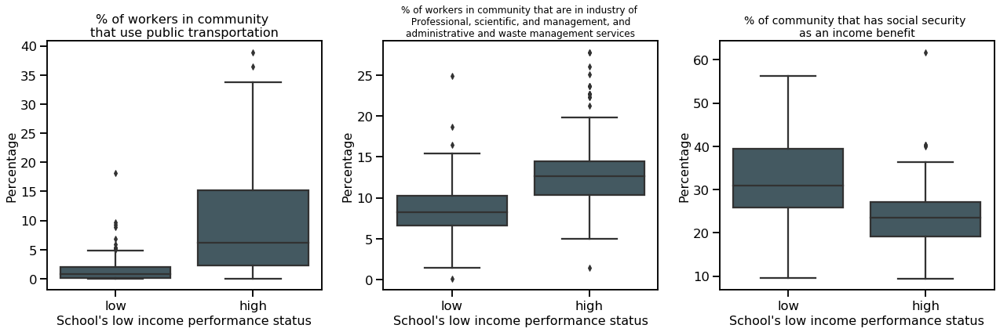

<IPython.core.display.Javascript object>

In [833]:
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 6))

feature_rank_to_plot = [0,1,2]

# First feature/boxplot
print(df_sig_features.loc[feature_rank_to_plot[0], "feature"])
sns.boxplot(
    data=df_state_info_gs_census_forMW,
    x="LI_performance_status",
    y=df_sig_features.loc[feature_rank_to_plot[0], "feature"],
    color=B_slate,
    order=["low", "high"],
    ax=ax1,
)

ax1.set_title("% of workers in community \nthat use public transportation", fontsize=16)
ax1.set_xlabel("School's low income performance status", fontsize=16)
ax1.set_ylabel("Percentage", fontsize=16)

# Second feature/boxplot
print(df_sig_features.loc[feature_rank_to_plot[1], "feature"])
sns.boxplot(
    data=df_state_info_gs_census_forMW,
    x="LI_performance_status",
    y=df_sig_features.loc[feature_rank_to_plot[1], "feature"],
    color=B_slate,
    order=["low", "high"],
    ax=ax2,
)

ax2.set_title("% of workers in community that are in industry of \n Professional, scientific, and management, and \nadministrative and waste management services", fontsize=12)
ax2.set_xlabel("School's low income performance status", fontsize=16)
ax2.set_ylabel("Percentage", fontsize=16)

# Third feature/boxplot
print(df_sig_features.loc[feature_rank_to_plot[2], "feature"])
sns.boxplot(
    data=df_state_info_gs_census_forMW,
    x="LI_performance_status",
    y=df_sig_features.loc[feature_rank_to_plot[2], "feature"],
    color=B_slate,
    order=["low", "high"],
    ax=ax3,
)

ax3.set_title("% of community that has social security \nas an income benefit", fontsize=14)
ax3.set_xlabel("School's low income performance status", fontsize=16)
ax3.set_ylabel("Percentage", fontsize=16)


plt.tight_layout();



%; WORKER_CLASS - Civilian employed pop. 16 yrs and up - Private wage and salary workers
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Public administration
%; EMPLOY_STATUS - Pop. 16 yrs and up - Not in labor force


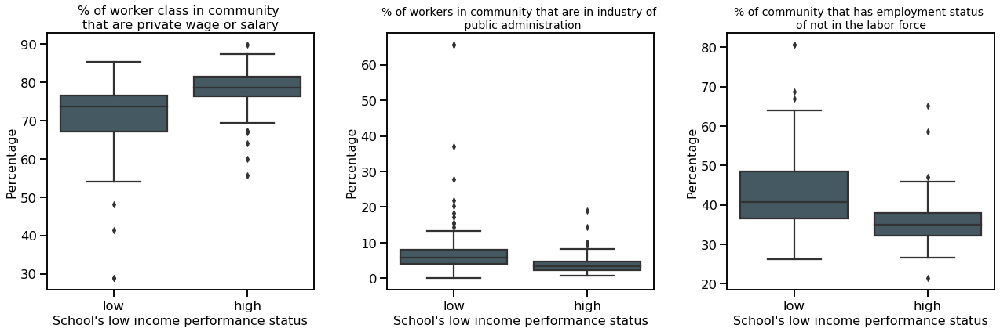

<IPython.core.display.Javascript object>

In [838]:
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 6))

feature_rank_to_plot = [3, 6, 7]

# First feature/boxplot
print(df_sig_features.loc[feature_rank_to_plot[0], "feature"])
sns.boxplot(
    data=df_state_info_gs_census_forMW,
    x="LI_performance_status",
    y=df_sig_features.loc[feature_rank_to_plot[0], "feature"],
    color=B_slate,
    order=["low", "high"],
    ax=ax1,
)

ax1.set_title(
    "% of worker class in community \nthat are private wage or salary", fontsize=16
)
ax1.set_xlabel("School's low income performance status", fontsize=16)
ax1.set_ylabel("Percentage", fontsize=16)

# Second feature/boxplot
print(df_sig_features.loc[feature_rank_to_plot[1], "feature"])
sns.boxplot(
    data=df_state_info_gs_census_forMW,
    x="LI_performance_status",
    y=df_sig_features.loc[feature_rank_to_plot[1], "feature"],
    color=B_slate,
    order=["low", "high"],
    ax=ax2,
)

ax2.set_title(
    "% of workers in community that are in industry of \n public administration",
    fontsize=14,
)
ax2.set_xlabel("School's low income performance status", fontsize=16)
ax2.set_ylabel("Percentage", fontsize=16)

# Third feature/boxplot
print(df_sig_features.loc[feature_rank_to_plot[2], "feature"])
sns.boxplot(
    data=df_state_info_gs_census_forMW,
    x="LI_performance_status",
    y=df_sig_features.loc[feature_rank_to_plot[2], "feature"],
    color=B_slate,
    order=["low", "high"],
    ax=ax3,
)

ax3.set_title(
    "% of community that has employment status \nof not in the labor force", fontsize=14
)
ax3.set_xlabel("School's low income performance status", fontsize=16)
ax3.set_ylabel("Percentage", fontsize=16)

plt.tight_layout()

%; INDUSTRY - Civilian employed pop. 16 yrs and up - Information
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Agriculture, forestry, fishing and hunting, and mining
%; EMPLOY_STATUS - Females 16 yrs and up - In labor force - Civilian labor force - Employed


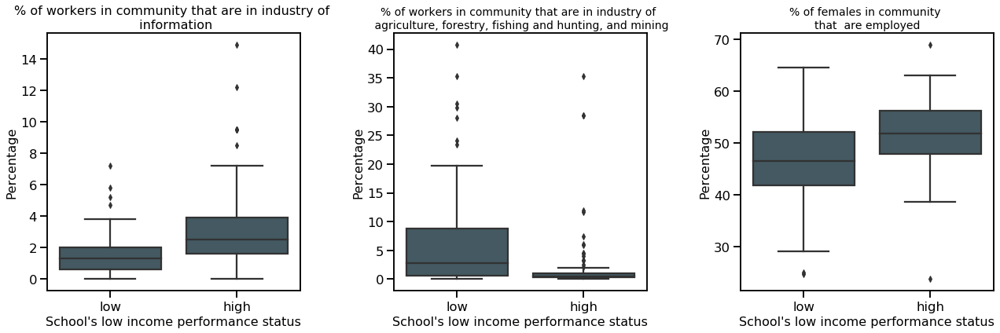

<IPython.core.display.Javascript object>

In [840]:
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 6))

feature_rank_to_plot = [8, 9, 12]

# First feature/boxplot
print(df_sig_features.loc[feature_rank_to_plot[0], "feature"])
sns.boxplot(
    data=df_state_info_gs_census_forMW,
    x="LI_performance_status",
    y=df_sig_features.loc[feature_rank_to_plot[0], "feature"],
    color=B_slate,
    order=["low", "high"],
    ax=ax1,
)

ax1.set_title(
    "% of workers in community that are in industry of \n information", fontsize=16
)
ax1.set_xlabel("School's low income performance status", fontsize=16)
ax1.set_ylabel("Percentage", fontsize=16)

# Second feature/boxplot
print(df_sig_features.loc[feature_rank_to_plot[1], "feature"])
sns.boxplot(
    data=df_state_info_gs_census_forMW,
    x="LI_performance_status",
    y=df_sig_features.loc[feature_rank_to_plot[1], "feature"],
    color=B_slate,
    order=["low", "high"],
    ax=ax2,
)

ax2.set_title(
    "% of workers in community that are in industry of \n agriculture, forestry, fishing and hunting, and mining",
    fontsize=14,
)
ax2.set_xlabel("School's low income performance status", fontsize=16)
ax2.set_ylabel("Percentage", fontsize=16)

# Third feature/boxplot
print(df_sig_features.loc[feature_rank_to_plot[2], "feature"])
sns.boxplot(
    data=df_state_info_gs_census_forMW,
    x="LI_performance_status",
    y=df_sig_features.loc[feature_rank_to_plot[2], "feature"],
    color=B_slate,
    order=["low", "high"],
    ax=ax3,
)

ax3.set_title("% of females in community \nthat  are employed", fontsize=14)
ax3.set_xlabel("School's low income performance status", fontsize=16)
ax3.set_ylabel("Percentage", fontsize=16)

plt.tight_layout()

%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- drove alone
%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage - w/ public coverage
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Manufacturing


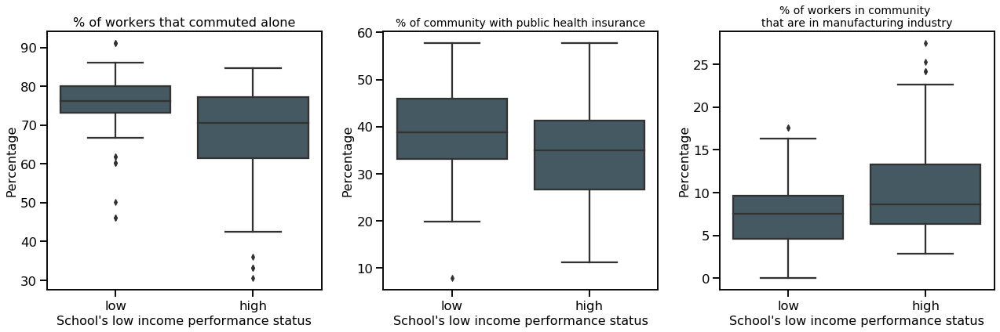

<IPython.core.display.Javascript object>

In [842]:
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 6))

feature_rank_to_plot = [13, 14, 15]

# First feature/boxplot
print(df_sig_features.loc[feature_rank_to_plot[0], "feature"])
sns.boxplot(
    data=df_state_info_gs_census_forMW,
    x="LI_performance_status",
    y=df_sig_features.loc[feature_rank_to_plot[0], "feature"],
    color=B_slate,
    order=["low", "high"],
    ax=ax1,
)

ax1.set_title("% of workers that commuted alone", fontsize=16)
ax1.set_xlabel("School's low income performance status", fontsize=16)
ax1.set_ylabel("Percentage", fontsize=16)

# Second feature/boxplot
print(df_sig_features.loc[feature_rank_to_plot[1], "feature"])
sns.boxplot(
    data=df_state_info_gs_census_forMW,
    x="LI_performance_status",
    y=df_sig_features.loc[feature_rank_to_plot[1], "feature"],
    color=B_slate,
    order=["low", "high"],
    ax=ax2,
)

ax2.set_title(
    "% of community with public health insurance", fontsize=14,
)
ax2.set_xlabel("School's low income performance status", fontsize=16)
ax2.set_ylabel("Percentage", fontsize=16)

# Third feature/boxplot
print(df_sig_features.loc[feature_rank_to_plot[2], "feature"])
sns.boxplot(
    data=df_state_info_gs_census_forMW,
    x="LI_performance_status",
    y=df_sig_features.loc[feature_rank_to_plot[2], "feature"],
    color=B_slate,
    order=["low", "high"],
    ax=ax3,
)

ax3.set_title(
    "% of workers in community \nthat are in manufacturing industry", fontsize=14
)
ax3.set_xlabel("School's low income performance status", fontsize=16)
ax3.set_ylabel("Percentage", fontsize=16)

plt.tight_layout()

### Second pass of boxplots - by category

%; INDUSTRY - Civilian employed pop. 16 yrs and up - Professional, scientific, and management, and administrative and waste management services
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Information
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Manufacturing


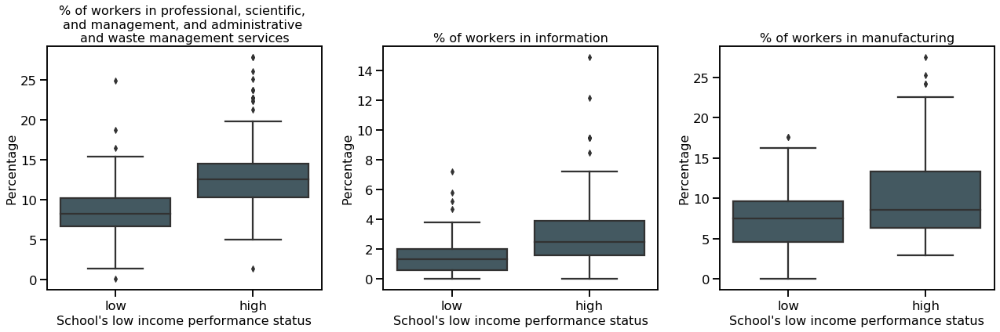

<IPython.core.display.Javascript object>

In [851]:
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 6))

feature_rank_to_plot = [1,8,15]

# First feature/boxplot
print(df_sig_features.loc[feature_rank_to_plot[0], "feature"])
sns.boxplot(
    data=df_state_info_gs_census_forMW,
    x="LI_performance_status",
    y=df_sig_features.loc[feature_rank_to_plot[0], "feature"],
    color=B_slate,
    order=["low", "high"],
    ax=ax1,
)

ax1.set_title("% of workers in professional, scientific, \nand management, and administrative \nand waste management services", fontsize=16)
ax1.set_xlabel("School's low income performance status", fontsize=16)
ax1.set_ylabel("Percentage", fontsize=16)

# Second feature/boxplot
print(df_sig_features.loc[feature_rank_to_plot[1], "feature"])
sns.boxplot(
    data=df_state_info_gs_census_forMW,
    x="LI_performance_status",
    y=df_sig_features.loc[feature_rank_to_plot[1], "feature"],
    color=B_slate,
    order=["low", "high"],
    ax=ax2,
)

ax2.set_title("% of workers in information", fontsize=16)
ax2.set_xlabel("School's low income performance status", fontsize=16)
ax2.set_ylabel("Percentage", fontsize=16)

# Third feature/boxplot
print(df_sig_features.loc[feature_rank_to_plot[2], "feature"])
sns.boxplot(
    data=df_state_info_gs_census_forMW,
    x="LI_performance_status",
    y=df_sig_features.loc[feature_rank_to_plot[2], "feature"],
    color=B_slate,
    order=["low", "high"],
    ax=ax3,
)

ax3.set_title("% of workers in manufacturing", fontsize=16)
ax3.set_xlabel("School's low income performance status", fontsize=16)
ax3.set_ylabel("Percentage", fontsize=16)

plt.tight_layout();


%; INDUSTRY - Civilian employed pop. 16 yrs and up - Public administration
%; INDUSTRY - Civilian employed pop. 16 yrs and up - Agriculture, forestry, fishing and hunting, and mining


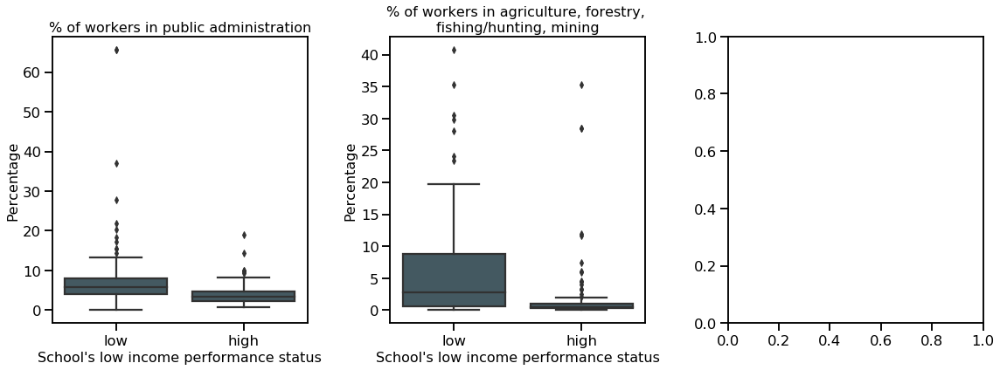

<IPython.core.display.Javascript object>

In [858]:
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16, 6))

feature_rank_to_plot = [6,9]

# First feature/boxplot
print(df_sig_features.loc[feature_rank_to_plot[0], "feature"])
sns.boxplot(
    data=df_state_info_gs_census_forMW,
    x="LI_performance_status",
    y=df_sig_features.loc[feature_rank_to_plot[0], "feature"],
    color=B_slate,
    order=["low", "high"],
    ax=ax1,
)

ax1.set_title("% of workers in public administration", fontsize=16)
ax1.set_xlabel("School's low income performance status", fontsize=16)
ax1.set_ylabel("Percentage", fontsize=16)

# Second feature/boxplot
print(df_sig_features.loc[feature_rank_to_plot[1], "feature"])
sns.boxplot(
    data=df_state_info_gs_census_forMW,
    x="LI_performance_status",
    y=df_sig_features.loc[feature_rank_to_plot[1], "feature"],
    color=B_slate,
    order=["low", "high"],
    ax=ax2,
)

ax2.set_title("% of workers in agriculture, forestry, \nfishing/hunting, mining", fontsize=16)
ax2.set_xlabel("School's low income performance status", fontsize=16)
ax2.set_ylabel("Percentage", fontsize=16)

plt.tight_layout();



%; EMPLOY_STATUS - Pop. 16 yrs and up - Not in labor force
%; EMPLOY_STATUS - Females 16 yrs and up - In labor force - Civilian labor force - Employed


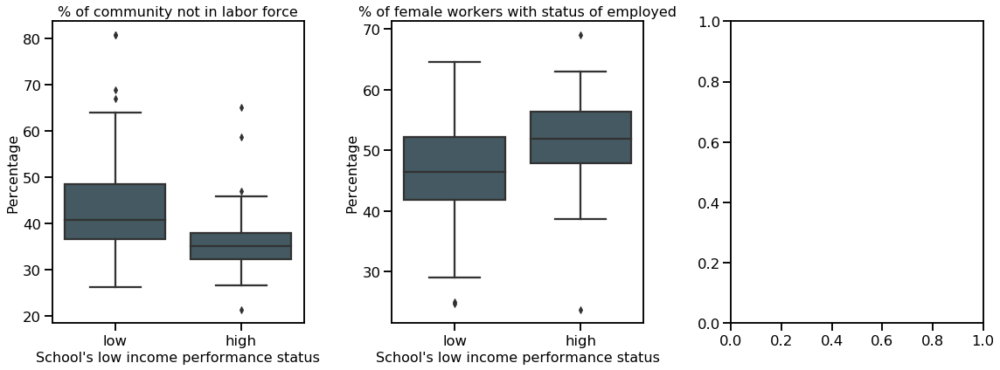

<IPython.core.display.Javascript object>

In [856]:
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16, 6))

feature_rank_to_plot = [7,12]

# First feature/boxplot
print(df_sig_features.loc[feature_rank_to_plot[0], "feature"])
sns.boxplot(
    data=df_state_info_gs_census_forMW,
    x="LI_performance_status",
    y=df_sig_features.loc[feature_rank_to_plot[0], "feature"],
    color=B_slate,
    order=["low", "high"],
    ax=ax1,
)

ax1.set_title("% of community not in labor force", fontsize=16)
ax1.set_xlabel("School's low income performance status", fontsize=16)
ax1.set_ylabel("Percentage", fontsize=16)

# Second feature/boxplot
print(df_sig_features.loc[feature_rank_to_plot[1], "feature"])
sns.boxplot(
    data=df_state_info_gs_census_forMW,
    x="LI_performance_status",
    y=df_sig_features.loc[feature_rank_to_plot[1], "feature"],
    color=B_slate,
    order=["low", "high"],
    ax=ax2,
)

ax2.set_title("% of female workers with status of employed", fontsize=16)
ax2.set_xlabel("School's low income performance status", fontsize=16)
ax2.set_ylabel("Percentage", fontsize=16)

plt.tight_layout();


%; WORK_COMMUTE - Workers 16 yrs and up - Public transportation (excluding taxicab)
%; WORK_COMMUTE - Workers 16 yrs and up - Car, truck, or van -- drove alone


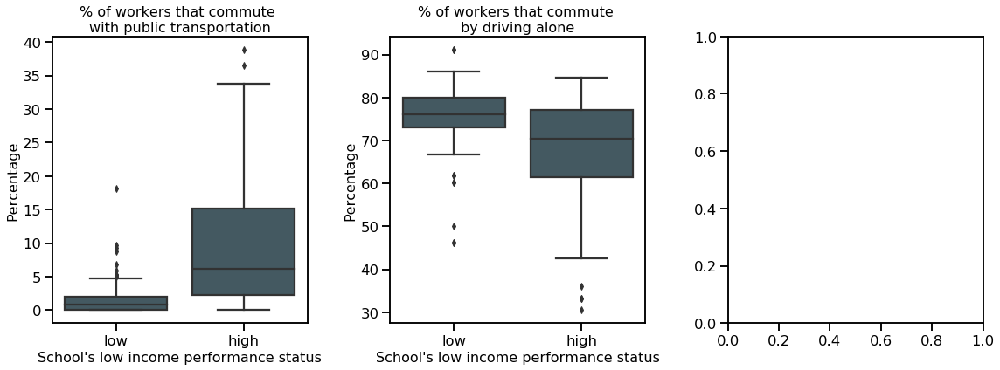

<IPython.core.display.Javascript object>

In [855]:
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16, 6))

feature_rank_to_plot = [0,13]

# First feature/boxplot
print(df_sig_features.loc[feature_rank_to_plot[0], "feature"])
sns.boxplot(
    data=df_state_info_gs_census_forMW,
    x="LI_performance_status",
    y=df_sig_features.loc[feature_rank_to_plot[0], "feature"],
    color=B_slate,
    order=["low", "high"],
    ax=ax1,
)

ax1.set_title("% of workers that commute \nwith public transportation", fontsize=16)
ax1.set_xlabel("School's low incomae performance status", fontsize=16)
ax1.set_ylabel("Percentage", fontsize=16)

# Second feature/boxplot
print(df_sig_features.loc[feature_rank_to_plot[1], "feature"])
sns.boxplot(
    data=df_state_info_gs_census_forMW,
    x="LI_performance_status",
    y=df_sig_features.loc[feature_rank_to_plot[1], "feature"],
    color=B_slate,
    order=["low", "high"],
    ax=ax2,
)

ax2.set_title("% of workers that commute \nby driving alone", fontsize=16)
ax2.set_xlabel("School's low income performance status", fontsize=16)
ax2.set_ylabel("Percentage", fontsize=16)

plt.tight_layout();


%; INCOME_BENEFITS - w/ Social Security
%; HEALTH_INS_COVERAGE - Civilian noninstitutionalized pop. - w/ health ins coverage - w/ public coverage


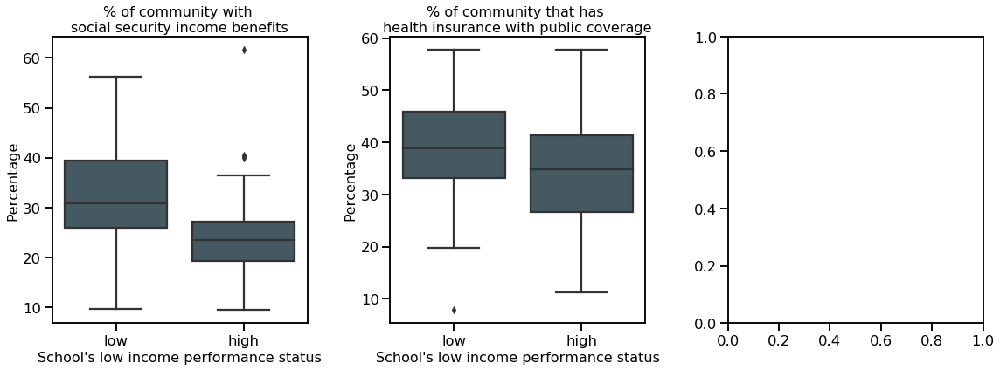

<IPython.core.display.Javascript object>

In [861]:
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16, 6))

feature_rank_to_plot = [2,14]

# First feature/boxplot
print(df_sig_features.loc[feature_rank_to_plot[0], "feature"])
sns.boxplot(
    data=df_state_info_gs_census_forMW,
    x="LI_performance_status",
    y=df_sig_features.loc[feature_rank_to_plot[0], "feature"],
    color=B_slate,
    order=["low", "high"],
    ax=ax1,
)

ax1.set_title("% of community with \nsocial security income benefits", fontsize=16)
ax1.set_xlabel("School's low income performance status", fontsize=16)
ax1.set_ylabel("Percentage", fontsize=16)

# Second feature/boxplot
print(df_sig_features.loc[feature_rank_to_plot[1], "feature"])
sns.boxplot(
    data=df_state_info_gs_census_forMW,
    x="LI_performance_status",
    y=df_sig_features.loc[feature_rank_to_plot[1], "feature"],
    color=B_slate,
    order=["low", "high"],
    ax=ax2,
)

ax2.set_title("% of community that has \nhealth insurance with public coverage", fontsize=16)
ax2.set_xlabel("School's low income performance status", fontsize=16)
ax2.set_ylabel("Percentage", fontsize=16)

plt.tight_layout();



## Conclusion and summary

This project identified features that are associated with low income student success. Some features have varying degrees of "actionability": some can be affected directly by policy changes, while others could be indirectly related.

For example, it is clear that schools where all students perform well (by college eligibility rates) is a significantly good predictor in how well their low income students are also doing. Superficially, it is not completely surprising, but it highlights how the right environment benefits all demographics of students.

Other features are not as influential but indicate that some public programs reap benefits. Communities where low income students do well receive some welfare benefits (in the form of supplemental and social security income) and have workers that use public transportation. Therefore policies that adversely affect the recipients of these programs might indirectly be detrimental to the school performance of their children or grandchildren.

It is also notable what features did *not* show benefits for low income student performance. While teacher salary was positively correlated with student performance, student-to-teacher ratio or whether teachers had 3 or more years of experience were not features that predicted whether a school was exceptionally performing. The magnet or charter status of a school were also not predictive features despite their perception. Of course, adding data from other states or evaluating schools longitudinally would help inform how robust these conclusions are.

New data would also be informative. For example, recently (October 2019) the state of [California will start mandating later high school start times](https://www.washingtonpost.com/opinions/students-need-more-sleep-good-for-california-for-giving-them-a-later-school-start/2019/10/18/f5dfc0d2-f047-11e9-8693-f487e46784aa_story.html). While the sleep benefits to students are clear, it is debatable whether this could disproportionately affect low income communities.

Other interesting data would be seeing whether and how much tech usage could be impactful. Do the schools encourage teachers and students to reference Khan Academy as lesson supplements? Or do they use Remind to facilitate communication?